In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


imaged_names = ['Starry_Night.jpg', 'wiki_gooze.jpg']
img=mpimg.imread(imaged_names[1])

(144, 210, 3)

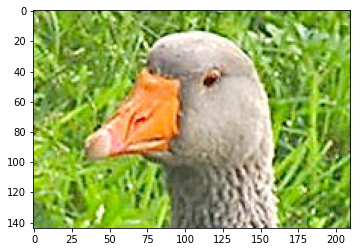

In [20]:
imgplot = plt.imshow(img)
img.shape

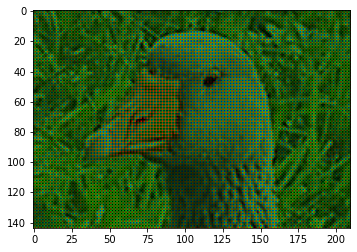

In [21]:
def make_b_filter(img):
    n, m, c = img.shape
    res = np.zeros((n, m, c), dtype=np.uint8)
    # Blue
    res[::2, ::2, 2] = img[::2, ::2, 2]

    # Green (top row of the Bayer matrix)
    res[1::2, ::2, 1] = img[1::2, ::2, 1]

    # Green (bottom row of the Bayer matrix)
    res[::2, 1::2, 1] = img[::2, 1::2, 1]

    # Red
    res[1::2, 1::2, 0] = img[1::2, 1::2, 0]

    return res
b_image = make_b_filter(img)
imgplot = plt.imshow(b_image)

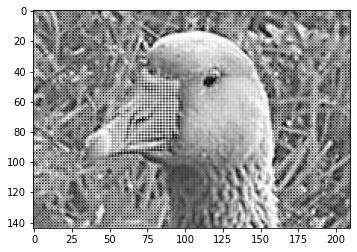

In [22]:
def make_b_filetr_1d(img):
    n, m, c = img.shape
    res = np.zeros((n, m), dtype=np.uint8)
    res = np.sum(img, axis=2)
    return res
b_1d_image = make_b_filetr_1d(b_image)
imgplot = plt.imshow(b_1d_image, cmap='gray')

In [144]:
def line_cnt_mat(A):
    center = [
        [[2,2], 1.],
        [[1,2], 1.],
        [[2,1], 2.],
        [[2,3], 2.],
        [[1,1], 2.],
        [[1,3], 2.],
    ]
    res = 0
    n, m = A.shape
    res_m = np.zeros((n-4, m-4))
    res_m[:,:] = A[2:n-2,2:m-2]
#     for f , norm in center:
#         res += np.abs(win[f[0]-1, f[1]] - win[f[0]+1, f[1]]) / norm
#     return res, (win[1, 2], (win[1,1]+win[1,3])/2., (win[2,2]+win[0,2])/2.)
    return res_m
A = np.array([
        [0, 0, 1, 0, 1],
        [0, 0, 2, 1, 0],
        [0, 0, 3, 0, 0],
        [0, 1, 4, 0, 0],
        [1, 0, 5, 0, 0],
    ])
print(line_cnt_mat(A))

[[3.]]


In [231]:
def get_color(pos):
    if pos[0] % 2 == 0 and pos[0] % 2 == 0:
        return 'b'
    if pos[0] % 2 == 1 and pos[0] % 2 == 1:
        return 'r'
    return 'g'

def get_color_num(pos):
    if pos[0] % 2 == 0 and pos[0] % 2 == 0:
        return 2
    if pos[0] % 2 == 1 and pos[0] % 2 == 1:
        return 0
    return 1



def line_cnt(win, color):
    center = [
        [[2,2], 1.],
        [[1,2], 1.],
        [[2,1], 2.],
        [[2,3], 2.],
        [[1,1], 2.],
        [[1,3], 2.],
    ]
    res = 0
    for f , norm in center:
        res += np.abs(win[f[0]-1, f[1]] - win[f[0]+1, f[1]]) / norm
    if color == 'r':
        return res, ((win[2,2]+win[0,2])/2., win[1, 2], (win[1,1]+win[1,3])/2.)
    if color == 'b':
        return res, ((win[1,1]+win[1,3])/2., win[1, 2], (win[2,2]+win[0,2])/2.,)
    if color == 'g': # check
        return res, ((win[1,1]+win[1,3])/2., win[1, 2], (win[2,2]+win[0,2])/2.)


def diag_cnt(win, color):
    center = [
        [2,2],
        [1,3],
    ]
    res = 0
    for f in center:
        res += np.abs(win[f[0]-1, f[1]+1] - win[f[0]+1, f[1]-1]) / 1.
    center_half = [
        [2,2],
        [3,3],
        [1,3],
        [2,4],
    ]
    greens_anti_grad = 0
    for f in center_half:
        res += np.abs(win[f[0]-1, f[1]] - win[f[0], f[1]-1]) / 2.
        greens_anti_grad += win[f[0]-1, f[1]]
    
    return res, ((win[2,2]+win[0,4])/2., greens_anti_grad, win[1,3])

In [232]:
def cnt_raws(A, pos):
    window = A[pos[0] - 2:pos[0] + 3, pos[1] - 2:pos[1] + 3]
    center = window[2,2]
    center_color = get_color(pos)
    lines = np.array(4)
#     line_names = ['n', 'e', 's', 'w']
#     diag_names = ['ne', 'se', 'sw', 'nw']
    directions = {}
    print(window)
    for i, name in enumerate(['n', 'e', 's', 'w']):
        directions[name] = line_cnt(np.rot90(window, k=i, axes=(1,0)), color=center_color)
    for i, name in enumerate(['ne', 'se', 'sw', 'nw']):
        directions[name] = diag_cnt(np.rot90(window, k=i, axes=(1,0)), color=center_color)
    min_direct = directions[min(directions, key=directions.get)][0]
    max_direct = directions[max(directions, key=directions.get)][0]
    
    th = min_direct * 1.5 + (min_direct + max_direct) * 0.5
    print(directions, th)
    color_sums = [0,0,0]
    color_items = 0
    for _, value in directions.items():
        if value[0] < th:
            for i in range(3):
                color_sums[i] += value[1][i]
                color_items += 1
    if center_color == 'r':
        return (center,
                center + (color_sums[1] - color_sums[0]) / color_items, 
                center + (color_sums[2] - color_sums[0]) / color_items)
    if center_color == 'b':
        return (center + (color_sums[0] - color_sums[1]) / color_items,
                center + (color_sums[1] - color_sums[1]) / color_items, 
                center)
    return (0, center + (color_sums[1] - color_sums[1]) / color_items, 0)
    

[[  0 123  96 171  84]
 [135 107 173 145 195]
 [ 93 172  86 175  79]
 [199 176 180 134 144]
 [ 94 225 123 143   3]]
{'n': (4.611686018427388e+19, (126.0, 173, 91.0)), 'e': (3.6893488147419103e+19, (141.5, 172, 89.5)), 's': (1.8446744073709552e+19, (155.0, 180, 104.5)), 'w': (3.6893488147419103e+19, (139.5, 175, 82.5)), 'ne': (5.5340232221128655e+19, (85.0, 714.0, 145)), 'se': (7.378697629483821e+19, (43.0, 603.0, 107)), 'sw': (9.223372036854776e+18, (90.0, 776.0, 176)), 'nw': (3.6893488147419103e+19, (44.5, 642.0, 134))} 5.5340232221128655e+19
[ 86.         164.97222222  84.94444444]
[[123  96 171  84 188]
 [107 173 145 195 142]
 [172  86 175  79 155]
 [176 180 134 144 115]
 [225 123 143   3 123]]
{'n': (2.7670116110564327e+19, (184.0, 145, 173.0)), 'e': (3.6893488147419103e+19, (176.5, 86, 173.5)), 's': (5.5340232221128655e+19, (162.0, 134, 159.0)), 'w': (6.456360425798343e+19, (169.5, 79, 165.0)), 'ne': (1.8446744073709552e+19, (181.5, 450.0, 195)), 'se': (3.6893488147419103e+19, (14

/home/pavel/anaconda3/envs/ml_fivt/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: overflow encountered in ulong_scalars
/home/pavel/anaconda3/envs/ml_fivt/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: overflow encountered in ulong_scalars
/home/pavel/anaconda3/envs/ml_fivt/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in ulong_scalars



{'n': (3.6893488147419103e+19, (110.5, 153, 60.0)), 'e': (90.5, (136.5, 187, 59.5)), 's': (106.5, (130.5, 196, 58.5)), 'w': (6.456360425798343e+19, (104.5, 159, 31.0)), 'ne': (4.611686018427388e+19, (59.5, 654.0, 104)), 'se': (2.7670116110564327e+19, (76.5, 701.0, 117)), 'sw': (143.5, (68.5, 796.0, 156)), 'nw': (5.5340232221128655e+19, (32.5, 684.0, 105))} 3.2281802128991715e+19
[ 48.         170.33333333  46.25      ]
[[193  72 188  71 160]
 [117 153 104 154  78]
 [187  48 159  14 134]
 [156 196 105 155  81]
 [217  69 174  17 173]]
{'n': (3.6893488147419103e+19, (153.5, 104, 173.5)), 'e': (9.223372036854776e+18, (174.5, 48, 173.0)), 's': (50.0, (175.5, 105, 166.5)), 'w': (6.456360425798343e+19, (154.5, 14, 146.5)), 'ne': (3.6893488147419103e+19, (159.5, 267.0, 154)), 'se': (3.6893488147419103e+19, (176.0, 341.0, 153)), 'sw': (1.8446744073709552e+19, (188.0, 378.0, 196)), 'nw': (1.8446744073709552e+19, (166.0, 217.0, 155))} 3.2281802128991715e+19
[159.         162.66666667 157.875    

{'n': (6.456360425798343e+19, (112.0, 135, 64.5)), 'e': (411.5, (174.5, 237, 148.0)), 's': (171.5, (160.5, 205, 86.0)), 'w': (6.456360425798343e+19, (111.0, 129, 2.5)), 'ne': (5.5340232221128655e+19, (116.0, 568.0, 0)), 'se': (281.0, (177.0, 844.0, 129)), 'sw': (9.223372036854776e+18, (158.0, 932.0, 167)), 'nw': (6.456360425798343e+19, (108.5, 633.0, 5))} 3.2281802128991715e+19
[133.         262.         121.33333333]
[[217  91 139  99 173]
 [129 135   0 165  32]
 [237 133 129  89 176]
 [167 205   5 138  22]
 [255 188 161  84 168]]
{'n': (3.6893488147419103e+19, (134.0, 0, 150.0)), 'e': (9.223372036854776e+18, (183.0, 133, 170.0)), 's': (1.8446744073709552e+19, (145.0, 5, 171.5)), 'w': (2.7670116110564327e+19, (152.5, 89, 151.5)), 'ne': (3.6893488147419103e+19, (151.0, 220.0, 165)), 'se': (3.6893488147419103e+19, (173.0, 353.0, 135)), 'sw': (9.223372036854776e+18, (192.0, 493.0, 205)), 'nw': (1.8446744073709552e+19, (148.5, 200.0, 138))} 3.6893488147419103e+19
[129.  135.6 130. ]
[[ 91

{'n': (3.6893488147419103e+19, (101.5, 148, 47.0)), 'e': (3.6893488147419103e+19, (110.5, 151, 53.0)), 's': (9.223372036854776e+18, (116.0, 171, 54.5)), 'w': (1.8446744073709552e+19, (105.0, 169, 48.5)), 'ne': (4.611686018427388e+19, (97.5, 620.0, 30)), 'se': (3.6893488147419103e+19, (131.0, 700.0, 64)), 'sw': (43.0, (99.0, 673.0, 42)), 'nw': (9.223372036854776e+18, (97.0, 690.0, 67))} 2.305843009213694e+19
[ 92.         199.16666667  74.91666667]
[[191 111 134 103 177]
 [ 64 148  30 169  89]
 [151  92 169 118 170]
 [ 42 171  67 162  58]
 [181 140 188 102 103]]
{'n': (5.5340232221128655e+19, (151.5, 30, 158.5)), 'e': (5.5340232221128655e+19, (160.0, 92, 159.5)), 's': (1.8446744073709552e+19, (178.5, 67, 166.5)), 'w': (1.8446744073709552e+19, (169.5, 118, 165.5)), 'ne': (3.6893488147419103e+19, (173.0, 340.0, 169)), 'se': (3.6893488147419103e+19, (180.0, 297.0, 148)), 'sw': (1.8446744073709552e+19, (175.0, 341.0, 171)), 'nw': (3.6893488147419103e+19, (136.0, 345.0, 162))} 6.456360425798

[121.         238.9375     120.41666667]
[[197  78 179  60 172]
 [182 188 117 126 107]
 [219 121 171  34 132]
 [179 221 192 191 104]
 [197  99 216 105 152]]
{'n': (4.611686018427388e+19, (157.0, 117, 175.0)), 'e': (9.223372036854776e+18, (204.5, 121, 195.0)), 's': (9.223372036854776e+18, (206.0, 192, 193.5)), 'w': (7.378697629483821e+19, (158.5, 34, 151.5)), 'ne': (4.611686018427388e+19, (171.5, 318.0, 126)), 'se': (3.6893488147419103e+19, (184.0, 498.0, 188)), 'sw': (9.223372036854776e+18, (184.0, 591.0, 221)), 'nw': (3.6893488147419103e+19, (161.5, 435.0, 191))} 5.5340232221128655e+19
[171.         218.78571429 172.        ]
[[ 78 179  60 172  56]
 [188 117 126 107 171]
 [121 171  34 132  68]
 [221 192 191 104 131]
 [ 99 216 105 152  42]]
{'n': (2.7670116110564327e+19, (112.0, 126, 47.0)), 'e': (221.0, (154.5, 171, 77.5)), 's': (9.223372036854776e+18, (148.0, 191, 69.5)), 'w': (4.611686018427388e+19, (105.5, 132, 51.0)), 'ne': (3.6893488147419103e+19, (45.0, 601.0, 107)), 'se': (1.84

 [ 21 129   0 137  22]]
{'n': (267.0, (136.0, 192, 73.5)), 'e': (5.5340232221128655e+19, (107.0, 156, 20.5)), 's': (7.378697629483821e+19, (88.0, 113, 11.5)), 'w': (1.8446744073709552e+19, (117.0, 160, 30.0)), 'ne': (198.0, (59.5, 755.0, 152)), 'se': (2.7670116110564327e+19, (19.5, 680.0, 120)), 'sw': (6.456360425798343e+19, (22.0, 547.0, 94)), 'nw': (6.456360425798343e+19, (22.5, 562.0, 82))} 3.6893488147419103e+19
[ 23.    144.25   26.625]
[[176 124 218  96 162]
 [120 192 152 185 118]
 [156  23 160  37 163]
 [ 94 113  82 152  96]
 [129   0 137  22 163]]
{'n': (264.0, (188.5, 152, 189.0)), 'e': (5.5340232221128655e+19, (152.5, 23, 158.0)), 's': (7.378697629483821e+19, (132.5, 82, 148.5)), 'w': (1.8446744073709552e+19, (168.5, 37, 161.5)), 'ne': (1.8446744073709552e+19, (161.0, 403.0, 185)), 'se': (1.8446744073709552e+19, (168.0, 419.0, 192)), 'sw': (5.5340232221128655e+19, (144.5, 199.0, 113)), 'nw': (3.6893488147419103e+19, (161.5, 237.0, 152))} 3.6893488147419103e+19
[160.         1

{'n': (9.223372036854776e+18, (195.5, 69, 195.5)), 'e': (148.0, (200.0, 161, 214.5)), 's': (6.456360425798343e+19, (190.5, 56, 184.5)), 'w': (7.378697629483821e+19, (180.0, 103, 165.5)), 'ne': (5.5340232221128655e+19, (175.0, 294.0, 174)), 'se': (1.8446744073709552e+19, (195.5, 475.0, 217)), 'sw': (1.8446744073709552e+19, (197.5, 475.0, 212)), 'nw': (5.5340232221128655e+19, (177.0, 286.0, 157))} 3.6893488147419103e+19
[195.         227.625      199.20833333]
[[156 196 105 155  81]
 [217  69 174  17 173]
 [161 195 103 165 120]
 [212  56 157  19 181]
 [160 186 108 159 137]]
{'n': (1.8446744073709552e+19, (104.0, 174, 43.0)), 'e': (181.5, (132.0, 195, 62.5)), 's': (4.611686018427388e+19, (105.5, 157, 37.5)), 'w': (4.611686018427388e+19, (111.5, 165, 18.0)), 'ne': (5.5340232221128655e+19, (92.0, 667.0, 17)), 'se': (148.5, (129.5, 782.0, 69)), 'sw': (9.223372036854776e+18, (131.5, 750.0, 56)), 'nw': (3.6893488147419103e+19, (120.0, 662.0, 19))} 2.7670116110564327e+19
[103.         220.     

{'n': (9.223372036854776e+18, (163.5, 216, 91.0)), 'e': (9.223372036854776e+18, (171.5, 210, 78.5)), 's': (7.378697629483821e+19, (100.0, 137, 42.0)), 'w': (7.378697629483821e+19, (92.0, 118, 45.0)), 'ne': (2.7670116110564327e+19, (87.0, 729.0, 137)), 'se': (1.8446744073709552e+19, (70.5, 819.0, 190)), 'sw': (1.8446744073709552e+19, (72.5, 693.0, 153)), 'nw': (6.456360425798343e+19, (35.0, 491.0, 47))} 5.5340232221128655e+19
[ 70.         210.13333333  75.63333333]
[[204 112 227 104 207]
 [190 216 137 168 158]
 [210  70 118  20 196]
 [153 137  47 124 143]
 [163  14 112   0 166]]
{'n': (323.5, (192.0, 137, 172.5)), 'e': (252.0, (176.5, 70, 164.0)), 's': (7.378697629483821e+19, (130.5, 47, 115.0)), 'w': (3.6893488147419103e+19, (146.0, 20, 157.0)), 'ne': (1.8446744073709552e+19, (162.5, 419.0, 168)), 'se': (9.223372036854776e+18, (161.0, 509.0, 216)), 'sw': (3.6893488147419103e+19, (140.5, 284.0, 137)), 'nw': (4.611686018427388e+19, (142.0, 210.0, 124))} 3.6893488147419103e+19
[118.     

{'n': (2.7670116110564327e+19, (109.0, 134, 76.0)), 'e': (6.456360425798343e+19, (104.0, 126, 58.5)), 's': (3.6893488147419103e+19, (110.0, 130, 89.5)), 'w': (2.7670116110564327e+19, (115.0, 140, 82.5)), 'ne': (1.8446744073709552e+19, (77.5, 557.0, 123)), 'se': (7.378697629483821e+19, (72.0, 493.0, 95)), 'sw': (6.456360425798343e+19, (75.5, 517.0, 113)), 'nw': (3.6893488147419103e+19, (76.0, 531.0, 107))} 7.378697629483821e+19
[ 87.         156.9047619   86.16666667]
[[129  65 142  68 149]
 [ 95 134 123 141 101]
 [126  87 140  78 137]
 [113 130 107 136 115]
 [136  92 125  65 136]]
{'n': (1.8446744073709552e+19, (137.5, 123, 141.0)), 'e': (4.611686018427388e+19, (132.0, 87, 133.0)), 's': (6.456360425798343e+19, (133.0, 107, 132.5)), 'w': (4.611686018427388e+19, (138.5, 78, 138.5)), 'ne': (1.8446744073709552e+19, (144.5, 370.0, 141)), 'se': (5.5340232221128655e+19, (134.5, 370.0, 134)), 'sw': (5.5340232221128655e+19, (138.0, 399.0, 130)), 'nw': (3.6893488147419103e+19, (138.0, 365.0, 136

[ 89.         178.25        62.54166667]
[[164 116 168  95 127]
 [ 26 148  21 150  57]
 [136  89 104 127 187]
 [ 10 124   6 166  90]
 [149 112 146 137 204]]
{'n': (1.8446744073709552e+19, (136.0, 21, 149.0)), 'e': (3.6893488147419103e+19, (120.0, 89, 136.0)), 's': (2.7670116110564327e+19, (125.0, 6, 145.0)), 'w': (203.0, (145.5, 127, 158.0)), 'ne': (1.8446744073709552e+19, (115.5, 300.0, 150)), 'se': (3.6893488147419103e+19, (134.0, 252.0, 148)), 'sw': (3.6893488147419103e+19, (126.5, 217.0, 124)), 'nw': (1.8446744073709552e+19, (154.0, 360.0, 166))} 1.8446744073709552e+19
[104.          97.83333333 108.16666667]
[[116 168  95 127 131]
 [148  21 150  57 171]
 [ 89 104 127 187 139]
 [124   6 166  90 174]
 [112 146 137 204 161]]
{'n': (5.5340232221128655e+19, (111.0, 150, 39.0)), 'e': (7.378697629483821e+19, (108.0, 104, 13.5)), 's': (9.223372036854776e+18, (132.0, 166, 48.0)), 'w': (169.5, (133.0, 187, 73.5)), 'ne': (1.8446744073709552e+19, (129.0, 635.0, 57)), 'se': (5.5340232221128655

{'n': (1.8446744073709552e+19, (197.0, 106, 216.0)), 'e': (3.6893488147419103e+19, (197.5, 158, 199.5)), 's': (7.378697629483821e+19, (189.5, 37, 182.5)), 'w': (1.8446744073709552e+19, (198.5, 162, 199.0)), 'ne': (1.8446744073709552e+19, (201.0, 522.0, 221)), 'se': (3.6893488147419103e+19, (184.5, 475.0, 211)), 'sw': (3.6893488147419103e+19, (204.5, 426.0, 188)), 'nw': (5.5340232221128655e+19, (194.5, 377.0, 177))} 7.378697629483821e+19
[197.         237.4047619  198.61904762]
[[140 197 156 205 161]
 [211 106 221  98 212]
 [158 197 162 200 160]
 [188  37 177  42 196]
 [155 182 136 192 155]]
{'n': (1.8446744073709552e+19, (159.0, 221, 102.0)), 'e': (5.5340232221128655e+19, (160.0, 197, 71.5)), 's': (7.378697629483821e+19, (149.0, 177, 39.5)), 'w': (3.6893488147419103e+19, (161.0, 200, 70.0)), 'ne': (2.7670116110564327e+19, (161.5, 838.0, 98)), 'se': (2.7670116110564327e+19, (151.0, 826.0, 106)), 'sw': (6.456360425798343e+19, (158.5, 744.0, 37)), 'nw': (6.456360425798343e+19, (158.5, 765

[170.         173.14583333 170.45833333]
[[ 18 151   0 136  70]
 [165  94 142 109 166]
 [ 38 170  43 156  65]
 [154 108 169  99 154]
 [ 55 171   0 133  23]]
{'n': (6.456360425798343e+19, (101.5, 142, 21.5)), 'e': (3.6893488147419103e+19, (101.0, 170, 40.5)), 's': (3.6893488147419103e+19, (103.5, 169, 21.5)), 'w': (3.6893488147419103e+19, (104.0, 156, 54.0)), 'ne': (2.7670116110564327e+19, (56.5, 600.0, 109)), 'se': (5.5340232221128655e+19, (30.5, 628.0, 94)), 'sw': (2.7670116110564327e+19, (49.0, 664.0, 108)), 'nw': (4.611686018427388e+19, (33.0, 612.0, 99))} 8.762203435012037e+19
[ 43.     149.75    41.6875]
[[151   0 136  70 208]
 [ 94 142 109 166 164]
 [170  43 156  65 182]
 [108 169  99 154 141]
 [171   0 133  23 152]]
{'n': (3.6893488147419103e+19, (154.0, 109, 146.0)), 'e': (3.6893488147419103e+19, (155.5, 43, 163.0)), 's': (6.456360425798343e+19, (161.5, 99, 144.5)), 'w': (9.223372036854776e+18, (160.0, 65, 169.0)), 'ne': (3.6893488147419103e+19, (182.0, 408.0, 166)), 'se': (5.5

{'n': (5.5340232221128655e+19, (111.0, 145, 44.0)), 'e': (7.378697629483821e+19, (102.5, 139, 50.5)), 's': (4.611686018427388e+19, (119.5, 151, 48.5)), 'w': (2.7670116110564327e+19, (128.0, 168, 59.0)), 'ne': (3.6893488147419103e+19, (33.5, 563.0, 112)), 'se': (5.5340232221128655e+19, (41.5, 574.0, 110)), 'sw': (7.378697629483821e+19, (33.5, 501.0, 95)), 'nw': (1.8446744073709552e+19, (39.5, 645.0, 144))} 7.378697629483821e+19
[ 67.         165.5         69.47222222]
[[147  21 129   0 137]
 [110 145 112 121 108]
 [139  67 168  51 160]
 [ 95 151 144 169 120]
 [102  30 157  12 172]]
{'n': (7.378697629483821e+19, (133.0, 112, 148.5)), 'e': (4.611686018427388e+19, (148.0, 67, 153.5)), 's': (3.6893488147419103e+19, (160.0, 144, 162.5)), 'w': (6.456360425798343e+19, (145.0, 51, 164.0)), 'ne': (5.5340232221128655e+19, (152.5, 271.0, 121)), 'se': (5.5340232221128655e+19, (157.5, 310.0, 145)), 'sw': (3.6893488147419103e+19, (135.0, 336.0, 151)), 'nw': (1.8446744073709552e+19, (170.0, 327.0, 169

 [229 255 232 192  84]]
{'n': (6.456360425798343e+19, (69.5, 103, 4.5)), 'e': (214.0, (120.0, 147, 79.5)), 's': (430.5, (155.5, 209, 83.0)), 'w': (6.456360425798343e+19, (69.5, 114, 8.0)), 'ne': (3.6893488147419103e+19, (92.0, 499.0, 0)), 'se': (7.378697629483821e+19, (52.0, 447.0, 9)), 'sw': (445.5, (154.0, 864.0, 150)), 'nw': (1.8446744073709552e+19, (81.5, 598.0, 16))} 3.6893488147419103e+19
[ 79.         187.91666667  63.79166667]
[[ 83  60 143 105 155]
 [  9 103   0 139   9]
 [147  79 114  60 134]
 [150 209  16  83   0]
 [255 232 192  84 110]]
{'n': (3.6893488147419103e+19, (128.5, 0, 121.0)), 'e': (9.223372036854776e+18, (130.5, 79, 156.0)), 's': (9.223372036854776e+18, (153.0, 16, 146.0)), 'w': (3.6893488147419103e+19, (124.0, 60, 111.0)), 'ne': (3.6893488147419103e+19, (134.5, 174.0, 139)), 'se': (3.6893488147419103e+19, (98.5, 148.0, 103)), 'sw': (9.223372036854776e+18, (184.5, 477.0, 209)), 'nw': (5.5340232221128655e+19, (112.0, 160.0, 83))} 4.611686018427388e+19
[114.       

{'n': (2.7670116110564327e+19, (145.0, 175, 98.5)), 'e': (164.5, (179.5, 222, 87.5)), 's': (5.5340232221128655e+19, (149.5, 169, 61.5)), 'w': (6.456360425798343e+19, (115.0, 171, 68.5)), 'ne': (5.5340232221128655e+19, (78.5, 709.0, 129)), 'se': (2.7670116110564327e+19, (78.5, 783.0, 161)), 'sw': (1.8446744073709552e+19, (97.5, 830.0, 198)), 'nw': (7.378697629483821e+19, (39.5, 598.0, 101))} 3.6893488147419103e+19
[ 79.         204.79166667  82.70833333]
[[187 118 170  78 180]
 [161 175 129 193 171]
 [222  79 171  58 186]
 [198 169 101 137  87]
 [230  44 121   0 150]]
{'n': (1.8446744073709552e+19, (184.0, 129, 170.5)), 'e': (9.223372036854776e+18, (172.0, 79, 196.5)), 's': (7.378697629483821e+19, (153.0, 101, 146.0)), 'w': (3.6893488147419103e+19, (165.0, 58, 178.5)), 'ne': (1.8446744073709552e+19, (175.5, 436.0, 193)), 'se': (1.8446744073709552e+19, (179.0, 487.0, 175)), 'sw': (3.6893488147419103e+19, (200.5, 422.0, 169)), 'nw': (5.5340232221128655e+19, (160.5, 246.0, 137))} 5.5340232

{'n': (1.8446744073709552e+19, (128.0, 26, 139.0)), 'e': (2.7670116110564327e+19, (119.0, 58, 131.0)), 's': (3.6893488147419103e+19, (130.5, 16, 125.5)), 'w': (1.8446744073709552e+19, (142.0, 105, 133.5)), 'ne': (1.8446744073709552e+19, (130.0, 255.0, 130)), 'se': (1.8446744073709552e+19, (135.0, 228.0, 148)), 'sw': (5.5340232221128655e+19, (112.0, 193.0, 114)), 'nw': (3.6893488147419103e+19, (131.5, 241.0, 137))} 6.456360425798343e+19
[117.         120.91666667 118.25      ]
[[105 139 101 143  91]
 [148  26 130  23 144]
 [ 58 117 105 167 126]
 [114  16 137  50 164]
 [101 144  70 146 143]]
{'n': (5.5340232221128655e+19, (103.0, 130, 24.5)), 'e': (5.5340232221128655e+19, (81.5, 117, 21.0)), 's': (3.6893488147419103e+19, (87.5, 137, 33.0)), 'w': (9.223372036854776e+18, (115.5, 167, 36.5)), 'ne': (2.7670116110564327e+19, (98.0, 584.0, 23)), 'se': (3.6893488147419103e+19, (105.0, 534.0, 26)), 'sw': (6.456360425798343e+19, (103.0, 512.0, 16)), 'nw': (9.223372036854776e+18, (124.0, 614.0, 50

{'n': (9.223372036854776e+18, (189.0, 78, 184.0)), 'e': (9.223372036854776e+18, (176.0, 138, 194.0)), 's': (4.611686018427388e+19, (174.0, 71, 181.5)), 'w': (7.378697629483821e+19, (165.5, 118, 171.5)), 'ne': (5.5340232221128655e+19, (166.0, 364.0, 179)), 'se': (1.8446744073709552e+19, (192.0, 464.0, 189)), 'sw': (1.8446744073709552e+19, (192.0, 461.0, 199)), 'nw': (5.5340232221128655e+19, (168.5, 348.0, 164))} 5.5340232221128655e+19
[175.         194.26666667 176.63333333]
[[175 203 128 157  99]
 [189  78 179  40 147]
 [138 175 118 156 108]
 [199  71 164  32 156]
 [145 173 127 162 107]]
{'n': (47.0, (123.0, 179, 59.0)), 'e': (100.0, (128.0, 175, 74.5)), 's': (4.611686018427388e+19, (122.5, 164, 51.5)), 'w': (7.378697629483821e+19, (113.0, 156, 36.0)), 'ne': (6.456360425798343e+19, (108.5, 639.0, 40)), 'se': (139.0, (146.5, 746.0, 78)), 'sw': (9.223372036854776e+18, (131.5, 711.0, 71)), 'nw': (6.456360425798343e+19, (112.5, 638.0, 32))} 3.6893488147419103e+19
[118.         224.83333333

[137.         166.5        137.11111111]
[[ 26 130  23 144  64]
 [117 105 167 126 183]
 [ 16 137  50 164  72]
 [144  70 146 143 181]
 [ 12 123 111 194 119]]
{'n': (4.611686018427388e+19, (115.5, 167, 36.5)), 'e': (7.378697629483821e+19, (87.5, 137, 33.0)), 's': (3.6893488147419103e+19, (106.5, 146, 80.5)), 'w': (121.5, (134.5, 164, 61.0)), 'ne': (9.223372036854776e+18, (57.0, 658.0, 126)), 'se': (6.456360425798343e+19, (38.0, 551.0, 105)), 'sw': (6.456360425798343e+19, (31.0, 550.0, 70)), 'nw': (9.223372036854776e+18, (84.5, 685.0, 143))} 3.6893488147419103e+19
[ 50.         186.77777778  56.        ]
[[130  23 144  64 184]
 [105 167 126 183 149]
 [137  50 164  72 147]
 [ 70 146 143 181 105]
 [123 111 194 119 169]]
{'n': (5.5340232221128655e+19, (175.0, 126, 154.0)), 'e': (7.378697629483821e+19, (156.5, 50, 150.5)), 's': (1.8446744073709552e+19, (163.5, 143, 179.0)), 'w': (2.7670116110564327e+19, (182.0, 72, 155.5)), 'ne': (1.8446744073709552e+19, (174.0, 411.0, 183)), 'se': (5.5340232

 [ 90 129  95 152 123]]
{'n': (3.6893488147419103e+19, (99.0, 139, 48.0)), 'e': (3.6893488147419103e+19, (106.5, 154, 35.0)), 's': (4.611686018427388e+19, (102.0, 139, 39.0)), 'w': (3.6893488147419103e+19, (108.0, 145, 52.0)), 'ne': (3.6893488147419103e+19, (102.5, 568.0, 58)), 'se': (6.456360425798343e+19, (101.5, 568.0, 38)), 'sw': (6.456360425798343e+19, (99.5, 568.0, 32)), 'nw': (9.223372036854776e+18, (116.0, 586.0, 46))} 5.072854620270127e+19
[109.         169.94444444  89.22222222]
[[134  89 137  96 153]
 [ 38 139  58 147  56]
 [154 109 145 107 167]
 [ 32 139  46 150  40]
 [129  95 152 123 196]]
{'n': (4.611686018427388e+19, (141.0, 58, 143.0)), 'e': (3.6893488147419103e+19, (149.5, 109, 139.0)), 's': (2.7670116110564327e+19, (148.5, 46, 144.5)), 'w': (3.6893488147419103e+19, (156.0, 107, 148.5)), 'ne': (1.8446744073709552e+19, (149.0, 317.0, 147)), 'se': (5.5340232221128655e+19, (139.5, 294.0, 139)), 'sw': (5.5340232221128655e+19, (137.0, 282.0, 139)), 'nw': (1.8446744073709552

 [143  14 154   8 158]]
{'n': (7.378697629483821e+19, (144.0, 93, 138.5)), 'e': (5.5340232221128655e+19, (152.5, 14, 152.0)), 's': (2.7670116110564327e+19, (165.0, 127, 157.5)), 'w': (9.223372036854776e+18, (156.5, 38, 173.5)), 'ne': (3.6893488147419103e+19, (161.0, 262.0, 143)), 'se': (5.5340232221128655e+19, (156.5, 207.0, 145)), 'sw': (3.6893488147419103e+19, (152.0, 263.0, 160)), 'nw': (3.6893488147419103e+19, (159.5, 308.0, 170))} 5.5340232221128655e+19
[161.         174.6        161.66666667]
[[  0 116   3 161  99]
 [145  93 143 128 205]
 [ 14 161  38 186 120]
 [160 127 170 135 196]
 [ 14 154   8 158  56]]
{'n': (7.378697629483821e+19, (110.5, 143, 20.5)), 'e': (6.456360425798343e+19, (110.0, 161, 26.0)), 's': (3.6893488147419103e+19, (131.0, 170, 23.0)), 'w': (172.5, (131.5, 186, 79.0)), 'ne': (9.223372036854776e+18, (68.5, 695.0, 128)), 'se': (7.378697629483821e+19, (19.0, 565.0, 93)), 'sw': (6.456360425798343e+19, (26.0, 645.0, 127)), 'nw': (9.223372036854776e+18, (47.0, 710.0

{'n': (3.6893488147419103e+19, (193.5, 156, 174.0)), 'e': (5.5340232221128655e+19, (166.0, 131, 210.0)), 's': (7.378697629483821e+19, (167.5, 135, 188.5)), 'w': (151.5, (195.0, 172, 215.0)), 'ne': (2.7670116110564327e+19, (188.5, 601.0, 199)), 'se': (6.456360425798343e+19, (155.0, 498.0, 188)), 'sw': (7.378697629483821e+19, (154.0, 417.0, 144)), 'nw': (9.223372036854776e+18, (200.0, 627.0, 191))} 3.6893488147419103e+19
[198.         288.72222222 200.38888889]
[[ 79 150  79 179  29]
 [188 156 199 194 182]
 [131 198 172 232 110]
 [144 135 191 192 196]
 [ 25 179 128 202 152]]
{'n': (3.6893488147419103e+19, (175.0, 199, 125.5)), 'e': (7.378697629483821e+19, (145.5, 198, 151.5)), 's': (7.378697629483821e+19, (163.5, 191, 150.0)), 'w': (2.7670116110564327e+19, (193.0, 232, 141.0)), 'ne': (3.6893488147419103e+19, (100.5, 792.0, 194)), 'se': (6.456360425798343e+19, (125.5, 735.0, 156)), 'sw': (7.378697629483821e+19, (98.5, 712.0, 135)), 'nw': (3.6893488147419103e+19, (162.0, 821.0, 192))} 9.22

[249.         375.         250.66666667]
[[164 118 118  39  44]
 [236 255 244 237 182]
 [255 249 251 250 255]
 [250 255 253 255 244]
 [252 254 253 255 244]]
{'n': (6.456360425798343e+19, (184.5, 244, 246.0)), 'e': (3.6893488147419103e+19, (253.0, 249, 255.0)), 's': (25.0, (252.0, 253, 255.0)), 'w': (2.7670116110564327e+19, (253.0, 250, 246.0)), 'ne': (7.378697629483821e+19, (147.5, 715.0, 237)), 'se': (5.5340232221128655e+19, (207.5, 847.0, 255)), 'sw': (24.0, (251.5, 1006.0, 255)), 'nw': (2.7670116110564327e+19, (247.5, 1002.0, 255))} 3.6893488147419103e+19
[251.         376.58333333 251.58333333]
[[118 118  39  44  70]
 [255 244 237 182 212]
 [249 251 250 255 248]
 [255 253 255 244 255]
 [254 253 255 244 245]]
{'n': (7.378697629483821e+19, (144.5, 237, 213.0)), 'e': (3.6893488147419103e+19, (249.5, 251, 248.5)), 's': (9.223372036854776e+18, (252.5, 255, 248.5)), 'w': (4.611686018427388e+19, (249.0, 255, 213.0)), 'ne': (6.456360425798343e+19, (160.0, 748.0, 182)), 'se': (4.61168601842

[157.         178.375      156.29166667]
[[ 53 120  53 140  77]
 [182  95 128  80 154]
 [ 90 157  66 132  57]
 [148 110 156 115 164]
 [ 32 125  97 171  88]]
{'n': (6.456360425798343e+19, (87.5, 128, 59.5)), 'e': (1.8446744073709552e+19, (102.5, 157, 78.0)), 's': (9.223372036854776e+18, (112.5, 156, 81.5)), 'w': (4.611686018427388e+19, (97.5, 132, 61.5)), 'ne': (3.6893488147419103e+19, (71.5, 554.0, 80)), 'se': (5.5340232221128655e+19, (59.5, 587.0, 95)), 'sw': (3.6893488147419103e+19, (49.0, 586.0, 110)), 'nw': (9.223372036854776e+18, (77.0, 623.0, 115))} 5.072854620270127e+19
[ 66.         160.33333333  66.88888889]
[[120  53 140  77 142]
 [ 95 128  80 154 115]
 [157  66 132  57 153]
 [110 156 115 164 112]
 [125  97 171  88 157]]
{'n': (4.611686018427388e+19, (141.0, 80, 136.0)), 'e': (2.7670116110564327e+19, (142.0, 66, 144.5)), 's': (124.0, (160.0, 115, 151.5)), 'w': (2.7670116110564327e+19, (159.0, 57, 142.5)), 'ne': (3.6893488147419103e+19, (137.0, 329.0, 154)), 'se': (5.534023222

{'n': (4.611686018427388e+19, (249.0, 255, 213.0)), 'e': (9.223372036854776e+18, (252.5, 255, 248.5)), 's': (6.456360425798343e+19, (250.0, 244, 233.5)), 'w': (1.8446744073709552e+19, (246.5, 255, 244.0)), 'ne': (4.611686018427388e+19, (211.0, 977.0, 248)), 'se': (1.8446744073709552e+19, (244.0, 998.0, 250)), 'sw': (1.8446744073709552e+19, (244.0, 1002.0, 255)), 'nw': (5.5340232221128655e+19, (239.0, 991.0, 245))} 5.072854620270127e+19
[244.         371.5        244.63888889]
[[237 182 212 178 202]
 [250 255 248 255 240]
 [255 244 255 244 255]
 [255 244 245 247 250]
 [250 223 245 234 245]]
{'n': (3.6893488147419103e+19, (255.0, 248, 233.5)), 'e': (9.223372036854776e+18, (249.5, 244, 255.0)), 's': (7.378697629483821e+19, (245.5, 245, 250.0)), 'w': (9.223372036854776e+18, (251.0, 244, 255.0)), 'ne': (4.611686018427388e+19, (228.5, 910.0, 255)), 'se': (3.6893488147419103e+19, (246.0, 924.0, 255)), 'sw': (5.5340232221128655e+19, (252.5, 967.0, 244)), 'nw': (5.5340232221128655e+19, (250.0, 

[177.         301.91666667 165.66666667]
[[167 138 190 155 182]
 [ 82 196 126 202  69]
 [177 177 244 180 143]
 [ 87 193 131 201  31]
 [182 153 195 121  88]]
{'n': (5.5340232221128655e+19, (217.0, 126, 199.0)), 'e': (7.378697629483821e+19, (210.5, 177, 194.5)), 's': (5.5340232221128655e+19, (219.5, 131, 197.0)), 'w': (3.6893488147419103e+19, (193.5, 180, 201.5)), 'ne': (3.6893488147419103e+19, (213.0, 530.0, 202)), 'se': (5.5340232221128655e+19, (205.5, 523.0, 196)), 'sw': (5.5340232221128655e+19, (213.0, 548.0, 193)), 'nw': (4.611686018427388e+19, (166.0, 463.0, 201))} 1.1068046444225731e+20
[244.         287.33333333 241.75      ]
[[138 190 155 182 150]
 [196 126 202  69 174]
 [177 244 180 143 102]
 [193 131 201  31 159]
 [153 195 121  88 148]]
{'n': (3.6893488147419103e+19, (167.5, 202, 97.5)), 'e': (3.6893488147419103e+19, (178.5, 244, 128.5)), 's': (6.456360425798343e+19, (150.5, 201, 81.0)), 'w': (7.378697629483821e+19, (141.0, 143, 50.0)), 'ne': (6.456360425798343e+19, (165.0, 70

[226.         280.76666667 225.8       ]
[[165 206 176 204 108]
 [216 162 230 172 199]
 [180 226 196 238 172]
 [206 122 195 123 196]
 [105 140 105 173 142]]
{'n': (3.6893488147419103e+19, (186.0, 230, 167.0)), 'e': (6.456360425798343e+19, (188.0, 226, 142.0)), 's': (7.378697629483821e+19, (150.5, 195, 122.5)), 'w': (2.7670116110564327e+19, (184.0, 238, 147.5)), 'ne': (3.6893488147419103e+19, (152.0, 871.0, 172)), 'se': (4.611686018427388e+19, (180.5, 878.0, 162)), 'sw': (7.378697629483821e+19, (150.5, 767.0, 122)), 'nw': (6.456360425798343e+19, (169.0, 802.0, 123))} 9.223372036854776e+19
[196.         314.60416667 187.5625    ]
[[206 176 204 108 146]
 [162 230 172 199  57]
 [226 196 238 172 164]
 [122 195 123 196  86]
 [140 105 173 142 181]]
{'n': (3.6893488147419103e+19, (221.0, 172, 214.5)), 'e': (4.611686018427388e+19, (232.0, 196, 212.5)), 's': (7.378697629483821e+19, (205.5, 123, 195.5)), 'w': (6.456360425798343e+19, (201.0, 172, 197.5)), 'ne': (4.611686018427388e+19, (192.0, 509.

{'n': (3.6893488147419103e+19, (119.5, 176, 147.0)), 'e': (5.5340232221128655e+19, (120.5, 171, 134.0)), 's': (3.6893488147419103e+19, (194.5, 218, 110.0)), 'w': (1.8446744073709552e+19, (193.5, 216, 150.0)), 'ne': (2.7670116110564327e+19, (165.5, 881.0, 208)), 'se': (7.378697629483821e+19, (71.5, 488.0, 31)), 'sw': (1.8446744073709552e+19, (174.5, 834.0, 210)), 'nw': (9.223372036854776e+18, (143.0, 830.0, 179))} 5.5340232221128655e+19
[143.   263.25 143.75]
[[121 151 255 188 223]
 [ 31 176 208 234 199]
 [171 143 216 157 221]
 [210 218 179 216 190]
 [196  77 180 143 231]]
{'n': (9.223372036854776e+18, (205.0, 208, 235.5)), 'e': (5.5340232221128655e+19, (197.0, 143, 193.5)), 's': (6.456360425798343e+19, (217.0, 179, 198.0)), 'w': (1.8446744073709552e+19, (225.0, 157, 218.5)), 'ne': (1.8446744073709552e+19, (219.5, 752.0, 234)), 'se': (6.456360425798343e+19, (168.5, 533.0, 176)), 'sw': (5.5340232221128655e+19, (206.0, 609.0, 218)), 'nw': (1.8446744073709552e+19, (223.5, 669.0, 216))} 5.0

[204.         324.66666667 187.02777778]
[[237 200 218 156 182]
 [153 241 114 180  85]
 [226 204 204 144 198]
 [162 213 101 179 102]
 [248 169 146 132 216]]
{'n': (9.223372036854776e+18, (211.0, 114, 210.5)), 'e': (179.5, (215.0, 204, 227.0)), 's': (7.378697629483821e+19, (175.0, 101, 196.0)), 'w': (6.456360425798343e+19, (201.0, 144, 179.5)), 'ne': (5.5340232221128655e+19, (193.0, 499.0, 180)), 'se': (1.8446744073709552e+19, (220.5, 671.0, 241)), 'sw': (1.8446744073709552e+19, (226.0, 636.0, 213)), 'nw': (3.6893488147419103e+19, (210.0, 479.0, 179))} 3.6893488147419103e+19
[204.         266.70833333 205.58333333]
[[200 218 156 182 152]
 [241 114 180  85 207]
 [204 204 144 198 173]
 [213 101 179 102 220]
 [169 146 132 216 196]]
{'n': (1.8446744073709552e+19, (150.0, 180, 99.5)), 'e': (9.223372036854776e+18, (174.0, 204, 107.5)), 's': (5.5340232221128655e+19, (138.0, 179, 101.5)), 'w': (2.7670116110564327e+19, (158.5, 198, 93.5)), 'ne': (2.7670116110564327e+19, (148.0, 767.0, 85)), 'se'

{'n': (70.0, (252.0, 255, 244.0)), 'e': (1.8446744073709552e+19, (241.5, 232, 233.0)), 's': (7.378697629483821e+19, (231.5, 243, 223.0)), 'w': (3.6893488147419103e+19, (242.0, 221, 233.0)), 'ne': (1.8446744073709552e+19, (244.0, 970.0, 255)), 'se': (1.8446744073709552e+19, (244.0, 983.0, 249)), 'sw': (5.5340232221128655e+19, (229.5, 927.0, 234)), 'nw': (5.5340232221128655e+19, (232.5, 923.0, 229))} 3.6893488147419103e+19
[233.         354.54166667 232.95833333]
[[241 255 243 255 243]
 [249 255 255 251 247]
 [232 233 221 233 221]
 [234 243 229 244 232]
 [211 213 215 232 236]]
{'n': (79.5, (253.0, 255, 232.0)), 'e': (1.8446744073709552e+19, (249.0, 233, 226.5)), 's': (7.378697629483821e+19, (243.5, 229, 218.0)), 'w': (1.8446744073709552e+19, (247.5, 233, 221.0)), 'ne': (50.0, (232.0, 990.0, 251)), 'se': (52.0, (231.0, 992.0, 255)), 'sw': (6.456360425798343e+19, (216.0, 909.0, 243)), 'nw': (4.611686018427388e+19, (228.5, 926.0, 244))} 3.6893488147419103e+19
[221.         320.36666667 219.

 [155 116 146 121 151]]
{'n': (2.7670116110564327e+19, (163.5, 52, 167.0)), 'e': (9.223372036854776e+18, (162.0, 126, 164.0)), 's': (4.611686018427388e+19, (152.0, 77, 155.0)), 'w': (6.456360425798343e+19, (144.5, 107, 158.0)), 'ne': (1.8446744073709552e+19, (176.0, 309.0, 161)), 'se': (1.8446744073709552e+19, (163.0, 363.0, 173)), 'sw': (5.5340232221128655e+19, (156.5, 377.0, 155)), 'nw': (5.5340232221128655e+19, (154.5, 327.0, 155))} 5.072854620270127e+19
[158.         165.36666667 158.23333333]
[[124 169 142 194 165]
 [173  52 161   8 170]
 [126 158 107 131  96]
 [155  77 155  22 127]
 [116 146 121 151  99]]
{'n': (1.8446744073709552e+19, (124.5, 161, 30.0)), 'e': (101.5, (116.5, 158, 64.5)), 's': (2.7670116110564327e+19, (114.0, 155, 49.5)), 'w': (6.456360425798343e+19, (101.5, 131, 15.0)), 'ne': (2.7670116110564327e+19, (136.0, 656.0, 8)), 'se': (75.0, (115.5, 661.0, 52)), 'sw': (2.7670116110564327e+19, (111.5, 614.0, 77)), 'nw': (7.378697629483821e+19, (103.0, 564.0, 22))} 3.6893

{'n': (3.6893488147419103e+19, (240.5, 255, 229.0)), 'e': (1.8446744073709552e+19, (242.0, 232, 237.5)), 's': (3.6893488147419103e+19, (244.5, 238, 227.0)), 'w': (2.7670116110564327e+19, (246.5, 253, 218.5)), 'ne': (5.5340232221128655e+19, (193.0, 987.0, 214)), 'se': (9.223372036854776e+18, (245.0, 997.0, 244)), 'sw': (1.8446744073709552e+19, (248.0, 974.0, 231)), 'nw': (5.5340232221128655e+19, (238.5, 964.0, 223))} 4.611686018427388e+19
[241.         323.36111111 236.58333333]
[[255 240 228 145 161]
 [244 255 214 251 169]
 [232 241 253 252 255]
 [231 238 223 253 248]
 [249 248 220 236 242]]
{'n': (6.456360425798343e+19, (240.5, 214, 253.0)), 'e': (4.611686018427388e+19, (242.5, 241, 246.5)), 's': (3.6893488147419103e+19, (236.5, 223, 245.5)), 'w': (1.8446744073709552e+19, (254.0, 252, 252.0)), 'ne': (4.611686018427388e+19, (207.0, 780.0, 251)), 'se': (9.223372036854776e+18, (254.0, 939.0, 255)), 'sw': (5.5340232221128655e+19, (251.0, 943.0, 238)), 'nw': (5.5340232221128655e+19, (247.5

{'n': (9.223372036854776e+18, (247.0, 249, 244.0)), 'e': (9.223372036854776e+18, (233.0, 243, 244.0)), 's': (7.378697629483821e+19, (193.0, 205, 199.0)), 'w': (7.378697629483821e+19, (207.0, 207, 215.0)), 'ne': (9.223372036854776e+18, (242.0, 937.0, 239)), 'se': (3.6893488147419103e+19, (197.0, 910.0, 255)), 'sw': (6.456360425798343e+19, (226.5, 878.0, 211)), 'nw': (7.378697629483821e+19, (184.0, 720.0, 175))} 5.5340232221128655e+19
[233.         351.33333333 238.25      ]
[[183 255 239 251 251]
 [255 249 239 242 229]
 [243 233 207 197 197]
 [211 205 175 156 163]
 [182 165 152 135 141]]
{'n': (199.0, (245.5, 239, 223.0)), 'e': (126.0, (227.0, 233, 225.0)), 's': (7.378697629483821e+19, (180.5, 175, 179.5)), 'w': (7.378697629483821e+19, (199.0, 197, 202.0)), 'ne': (117.0, (229.0, 916.0, 242)), 'se': (1.8446744073709552e+19, (195.0, 982.0, 249)), 'sw': (7.378697629483821e+19, (194.5, 784.0, 205)), 'nw': (7.378697629483821e+19, (174.0, 670.0, 156))} 3.6893488147419103e+19
[207.         329

{'n': (2.7670116110564327e+19, (137.0, 26, 150.5)), 'e': (6.456360425798343e+19, (112.0, 59, 140.0)), 's': (9.223372036854776e+18, (182.5, 70, 147.0)), 'w': (9.223372036854776e+18, (133.5, 92, 157.5)), 'ne': (1.8446744073709552e+19, (151.5, 268.0, 154)), 'se': (4.611686018427388e+19, (133.0, 214.0, 147)), 'sw': (3.6893488147419103e+19, (134.0, 289.0, 133)), 'nw': (9.223372036854776e+18, (144.5, 394.0, 161))} 5.072854620270127e+19
[125.         141.04761905 126.61904762]
[[ 94 149 112 178 134]
 [147  26 154  38 164]
 [ 59 125  92 142 115]
 [133  70 161  53 144]
 [159 240 179 164  86]]
{'n': (3.6893488147419103e+19, (102.0, 154, 32.0)), 'e': (6.456360425798343e+19, (75.5, 125, 48.0)), 's': (192.0, (135.5, 161, 61.5)), 'w': (1.8446744073709552e+19, (103.5, 142, 45.5)), 'ne': (2.7670116110564327e+19, (113.0, 638.0, 38)), 'se': (3.6893488147419103e+19, (93.0, 575.0, 26)), 'sw': (9.223372036854776e+18, (125.5, 659.0, 70)), 'nw': (2.7670116110564327e+19, (89.0, 611.0, 53))} 3.2281802128991715

{'n': (2.7670116110564327e+19, (136.5, 196, 68.0)), 'e': (7.378697629483821e+19, (126.0, 176, 42.0)), 's': (6.456360425798343e+19, (135.5, 184, 55.0)), 'w': (2.7670116110564327e+19, (137.0, 201, 81.0)), 'ne': (9.223372036854776e+18, (145.0, 777.0, 90)), 'se': (7.378697629483821e+19, (120.0, 682.0, 46)), 'sw': (7.378697629483821e+19, (137.5, 710.0, 38)), 'nw': (38.5, (145.0, 774.0, 72))} 3.6893488147419103e+19
[143.         258.375      121.95833333]
[[150 130 202 147 205]
 [ 46 196  90 178 110]
 [176 143 201 131 213]
 [ 38 184  72 203 112]
 [180 128 186 147 214]]
{'n': (1.8446744073709552e+19, (201.5, 90, 187.0)), 'e': (4.611686018427388e+19, (188.5, 143, 190.0)), 's': (5.5340232221128655e+19, (193.5, 72, 193.5)), 'w': (2.7670116110564327e+19, (207.0, 131, 190.5)), 'ne': (3.6893488147419103e+19, (203.0, 478.0, 178)), 'se': (5.5340232221128655e+19, (175.5, 409.0, 196)), 'sw': (3.6893488147419103e+19, (190.5, 381.0, 184)), 'nw': (1.8446744073709552e+19, (207.5, 462.0, 203))} 6.4563604257

{'n': (62.0, (225.0, 249, 229.0)), 'e': (7.378697629483821e+19, (212.5, 209, 207.5)), 's': (7.378697629483821e+19, (208.5, 220, 215.0)), 'w': (3.6893488147419103e+19, (221.0, 221, 219.5)), 'ne': (2.7670116110564327e+19, (222.5, 933.0, 233)), 'se': (3.6893488147419103e+19, (219.5, 889.0, 217)), 'sw': (7.378697629483821e+19, (211.0, 824.0, 208)), 'nw': (6.456360425798343e+19, (213.0, 844.0, 209))} 3.6893488147419103e+19
[226.         348.41666667 228.41666667]
[[215 232 236 219 202]
 [217 249 233 227 199]
 [209 226 221 213 197]
 [208 220 209 212 201]
 [197 204 191 200 201]]
{'n': (67.0, (238.0, 233, 228.5)), 'e': (3.6893488147419103e+19, (234.5, 226, 215.0)), 's': (7.378697629483821e+19, (216.0, 209, 206.0)), 'w': (7.378697629483821e+19, (219.5, 213, 209.0)), 'ne': (3.6893488147419103e+19, (211.5, 864.0, 227)), 'se': (3.6893488147419103e+19, (218.0, 908.0, 249)), 'sw': (7.378697629483821e+19, (209.0, 847.0, 220)), 'nw': (7.378697629483821e+19, (211.0, 823.0, 212))} 3.6893488147419103e+19

 [163 173 231 134 153]]
{'n': (2.7670116110564327e+19, (187.0, 99, 253.0)), 'e': (9.223372036854776e+18, (200.5, 195, 223.0)), 's': (5.5340232221128655e+19, (210.0, 57, 166.5)), 'w': (3.6893488147419103e+19, (210.0, 181, 196.5)), 'ne': (1.8446744073709552e+19, (222.0, 630.0, 255)), 'se': (1.8446744073709552e+19, (197.0, 591.0, 251)), 'sw': (5.5340232221128655e+19, (176.0, 500.0, 195)), 'nw': (5.5340232221128655e+19, (171.0, 414.0, 138))} 4.611686018427388e+19
[189.  234.3 199.8]
[[164 185 196 255 175]
 [251  99 255 154 221]
 [195 189 181 231 164]
 [195  57 138  42 188]
 [173 231 134 153 149]]
{'n': (9.223372036854776e+18, (188.5, 255, 126.5)), 'e': (3.6893488147419103e+19, (188.0, 189, 78.0)), 's': (6.456360425798343e+19, (157.5, 138, 49.5)), 'w': (3.6893488147419103e+19, (172.5, 231, 98.0)), 'ne': (2.7670116110564327e+19, (178.0, 962.0, 154)), 'se': (2.7670116110564327e+19, (172.5, 880.0, 99)), 'sw': (5.5340232221128655e+19, (177.0, 753.0, 57)), 'nw': (6.456360425798343e+19, (165.0, 7

{'n': (3.6893488147419103e+19, (165.0, 209, 109.0)), 'e': (5.5340232221128655e+19, (160.0, 214, 93.5)), 's': (7.378697629483821e+19, (152.5, 192, 74.0)), 'w': (4.611686018427388e+19, (171.0, 220, 89.5)), 'ne': (4.611686018427388e+19, (165.5, 831.0, 106)), 'se': (3.6893488147419103e+19, (152.0, 839.0, 112)), 'sw': (5.5340232221128655e+19, (161.0, 774.0, 75)), 'nw': (6.456360425798343e+19, (148.0, 777.0, 73))} 1.1068046444225731e+20
[173.    288.875 150.375]
[[213 157 204 158 204]
 [112 209 106 198  94]
 [214 173 220 169 188]
 [ 75 192  73 192  68]
 [194 132 173 123 179]]
{'n': (3.6893488147419103e+19, (212.0, 106, 203.5)), 'e': (1.8446744073709552e+19, (217.0, 173, 200.5)), 's': (7.378697629483821e+19, (196.5, 73, 192.0)), 'w': (6.456360425798343e+19, (204.0, 169, 195.0)), 'ne': (3.6893488147419103e+19, (212.0, 527.0, 198)), 'se': (3.6893488147419103e+19, (216.5, 548.0, 209)), 'sw': (5.5340232221128655e+19, (207.0, 453.0, 192)), 'nw': (5.5340232221128655e+19, (199.5, 433.0, 192))} 7.378

{'n': (3.6893488147419103e+19, (165.0, 195, 107.5)), 'e': (3.6893488147419103e+19, (126.5, 193, 97.0)), 's': (7.378697629483821e+19, (89.5, 136, 60.5)), 'w': (5.5340232221128655e+19, (128.0, 177, 114.0)), 'ne': (2.7670116110564327e+19, (94.0, 723.0, 156)), 'se': (2.7670116110564327e+19, (92.5, 756.0, 174)), 'sw': (7.378697629483821e+19, (57.5, 559.0, 79)), 'nw': (7.378697629483821e+19, (66.5, 576.0, 100))} 9.223372036854776e+19
[115.         218.97916667 117.85416667]
[[166 100 166  73  87]
 [174 195 156 185 153]
 [193 115 177 113 189]
 [ 79 136 100 143  89]
 [104   6 120  18  98]]
{'n': (3.6893488147419103e+19, (190.0, 156, 171.5)), 'e': (1.8446744073709552e+19, (165.5, 115, 185.0)), 's': (7.378697629483821e+19, (139.5, 100, 148.5)), 'w': (4.611686018427388e+19, (164.0, 113, 183.0)), 'ne': (2.7670116110564327e+19, (132.0, 495.0, 185)), 'se': (2.7670116110564327e+19, (171.5, 545.0, 195)), 'sw': (7.378697629483821e+19, (140.5, 300.0, 136)), 'nw': (7.378697629483821e+19, (137.5, 320.0, 1

{'n': (31.0, (240.0, 238, 223.5)), 'e': (9.223372036854776e+18, (243.0, 233, 224.0)), 's': (7.378697629483821e+19, (239.5, 223, 214.0)), 'w': (7.378697629483821e+19, (236.0, 224, 213.5)), 'ne': (5.5340232221128655e+19, (237.0, 920.0, 215)), 'se': (2.7670116110564327e+19, (239.5, 945.0, 232)), 'sw': (4.611686018427388e+19, (237.5, 904.0, 216)), 'nw': (7.378697629483821e+19, (234.5, 883.0, 212))} 3.6893488147419103e+19
[240.         317.05555556 235.22222222]
[[233 240 237 234 226]
 [232 238 215 221 213]
 [233 240 224 232 216]
 [216 223 212 219 201]
 [226 239 217 229 214]]
{'n': (25.5, (230.5, 215, 229.5)), 'e': (38.0, (228.5, 240, 230.5)), 's': (7.378697629483821e+19, (220.5, 212, 221.0)), 'w': (7.378697629483821e+19, (220.0, 232, 220.0)), 'ne': (3.6893488147419103e+19, (225.0, 894.0, 221)), 'se': (1.8446744073709552e+19, (228.5, 927.0, 238)), 'sw': (1.8446744073709552e+19, (225.0, 907.0, 223)), 'nw': (5.5340232221128655e+19, (219.0, 874.0, 219))} 3.6893488147419103e+19
[224.         33

{'n': (7.378697629483821e+19, (120.5, 152, 70.0)), 'e': (3.6893488147419103e+19, (166.0, 239, 121.5)), 's': (3.6893488147419103e+19, (190.0, 222, 92.0)), 'w': (6.456360425798343e+19, (144.5, 184, 115.0)), 'ne': (7.378697629483821e+19, (101.0, 593.0, 83)), 'se': (6.456360425798343e+19, (99.5, 694.0, 158)), 'sw': (3.6893488147419103e+19, (95.0, 787.0, 174)), 'nw': (3.6893488147419103e+19, (112.5, 794.0, 206))} 1.1068046444225731e+20
[130.         239.83333333 129.60416667]
[[141  10 115  72 193]
 [158 152  83 142 170]
 [239 130 184 100 184]
 [174 222 206 221 164]
 [136  54 167  95 161]]
{'n': (7.378697629483821e+19, (147.0, 83, 149.5)), 'e': (9.223372036854776e+18, (187.0, 130, 211.5)), 's': (3.6893488147419103e+19, (221.5, 206, 175.5)), 'w': (4.611686018427388e+19, (181.5, 100, 184.0)), 'ne': (4.611686018427388e+19, (188.5, 425.0, 142)), 'se': (6.456360425798343e+19, (162.5, 381.0, 152)), 'sw': (2.7670116110564327e+19, (160.0, 564.0, 222)), 'nw': (2.7670116110564327e+19, (172.5, 565.0, 

[[194 150 139  81 142]
 [ 65 148  16 107  14]
 [157 121 133  93 150]
 [ 25 122  24 152  80]
 [141  85 123 137 201]]
{'n': (3.6893488147419103e+19, (136.0, 16, 127.5)), 'e': (9.223372036854776e+18, (145.0, 121, 135.0)), 's': (3.6893488147419103e+19, (128.0, 24, 137.0)), 'w': (3.6893488147419103e+19, (141.5, 93, 129.5)), 'ne': (3.6893488147419103e+19, (137.5, 204.0, 107)), 'se': (3.6893488147419103e+19, (163.5, 352.0, 148)), 'sw': (1.8446744073709552e+19, (137.0, 255.0, 122)), 'nw': (1.8446744073709552e+19, (167.0, 334.0, 152))} 3.6893488147419103e+19
[133.         162.         128.55555556]
[[150 139  81 142 102]
 [148  16 107  14 151]
 [121 133  93 150 117]
 [122  24 152  80 179]
 [ 85 123 137 201 149]]
{'n': (6.456360425798343e+19, (87.0, 107, 15.0)), 'e': (3.6893488147419103e+19, (107.0, 133, 20.0)), 's': (9.223372036854776e+18, (115.0, 152, 52.0)), 'w': (9.223372036854776e+18, (105.0, 150, 47.0)), 'ne': (3.6893488147419103e+19, (97.5, 550.0, 14)), 'se': (3.6893488147419103e+19, (121

{'n': (249.5, (175.5, 78, 185.0)), 'e': (150.0, (163.5, 141, 174.0)), 's': (7.378697629483821e+19, (124.5, 0, 129.0)), 'w': (3.6893488147419103e+19, (161.5, 92, 140.0)), 'ne': (1.8446744073709552e+19, (172.5, 422.0, 154)), 'se': (1.8446744073709552e+19, (176.5, 506.0, 216)), 'sw': (5.5340232221128655e+19, (139.0, 230.0, 132)), 'nw': (3.6893488147419103e+19, (163.5, 260.0, 126))} 3.6893488147419103e+19
[145.         183.25       148.41666667]
[[181 206 161 200 180]
 [216  78 154  91 190]
 [141 145  92 178 151]
 [132   0 126  86 228]
 [ 57 104  82 182 223]]
{'n': (180.0, (126.5, 154, 84.5)), 'e': (3.6893488147419103e+19, (116.5, 145, 39.0)), 's': (6.456360425798343e+19, (87.0, 126, 43.0)), 'w': (210.5, (121.5, 178, 88.5)), 'ne': (238.5, (136.0, 722.0, 91)), 'se': (2.7670116110564327e+19, (136.5, 721.0, 78)), 'sw': (7.378697629483821e+19, (74.5, 507.0, 0)), 'nw': (9.223372036854776e+18, (157.5, 714.0, 86))} 3.6893488147419103e+19
[ 92.         212.73333333  75.33333333]
[[206 161 200 180 

{'n': (40.0, (200.0, 218, 205.0)), 'e': (2.7670116110564327e+19, (198.0, 183, 200.5)), 's': (7.378697629483821e+19, (194.5, 202, 195.0)), 'w': (1.8446744073709552e+19, (196.5, 188, 201.5)), 'ne': (1.8446744073709552e+19, (205.0, 836.0, 199)), 'se': (1.8446744073709552e+19, (200.0, 802.0, 201)), 'sw': (5.5340232221128655e+19, (192.0, 753.0, 195)), 'nw': (5.5340232221128655e+19, (190.5, 768.0, 194))} 3.6893488147419103e+19
[200.         281.83333333 200.5       ]
[[186 210 202 210 198]
 [201 218 199 228 209]
 [183 200 188 203 194]
 [195 202 194 206 191]
 [164 190 172 181 170]]
{'n': (46.5, (223.0, 199, 195.0)), 'e': (5.5340232221128655e+19, (210.0, 200, 185.5)), 's': (7.378697629483821e+19, (204.0, 194, 180.0)), 'w': (9.223372036854776e+18, (217.0, 203, 191.0)), 'ne': (9.223372036854776e+18, (193.0, 821.0, 228)), 'se': (2.7670116110564327e+19, (187.0, 810.0, 218)), 'sw': (6.456360425798343e+19, (176.0, 779.0, 202)), 'nw': (6.456360425798343e+19, (179.0, 769.0, 206))} 3.6893488147419103e+

{'n': (55.0, (147.0, 135, 155.0)), 'e': (3.6893488147419103e+19, (143.0, 152, 150.5)), 's': (5.5340232221128655e+19, (139.0, 127, 136.0)), 'w': (1.8446744073709552e+19, (141.0, 157, 140.5)), 'ne': (9.223372036854776e+18, (147.0, 622.0, 159)), 'se': (1.8446744073709552e+19, (148.0, 586.0, 151)), 'sw': (5.5340232221128655e+19, (138.5, 546.0, 150)), 'nw': (5.5340232221128655e+19, (128.0, 556.0, 122))} 2.7670116110564327e+19
[139.         215.41666667 140.875     ]
[[161 155 172 155 177]
 [151 135 159 158 162]
 [152 139 157 143 161]
 [150 127 122 120 120]
 [151 139 152 117 137]]
{'n': (89.0, (164.5, 159, 146.5)), 'e': (5.5340232221128655e+19, (154.5, 139, 131.0)), 's': (6.456360425798343e+19, (154.5, 122, 123.5)), 'w': (1.8446744073709552e+19, (159.0, 143, 139.0)), 'ne': (9.223372036854776e+18, (167.0, 619.0, 158)), 'se': (9.223372036854776e+18, (159.0, 604.0, 135)), 'sw': (5.5340232221128655e+19, (154.0, 550.0, 127)), 'nw': (7.378697629483821e+19, (147.0, 502.0, 120))} 3.6893488147419103e

[ 58.         137.1875      56.85416667]
[[125  10 123  49 158]
 [118 112 133 158 126]
 [147  58 136   0 116]
 [ 91 128  96 120 103]
 [ 85  34 106  26 134]]
{'n': (3.6893488147419103e+19, (135.0, 133, 129.5)), 'e': (2.7670116110564327e+19, (120.0, 58, 141.5)), 's': (5.5340232221128655e+19, (124.0, 96, 121.0)), 'w': (5.5340232221128655e+19, (139.0, 0, 126.0)), 'ne': (1.8446744073709552e+19, (147.0, 308.0, 158)), 'se': (5.5340232221128655e+19, (130.5, 319.0, 112)), 'sw': (5.5340232221128655e+19, (110.5, 279.0, 128)), 'nw': (3.6893488147419103e+19, (135.0, 225.0, 120))} 6.456360425798343e+19
[136.         151.70833333 135.79166667]
[[ 10 123  49 158  25]
 [112 133 158 126 141]
 [ 58 136   0 116  67]
 [128  96 120 103 140]
 [ 34 106  26 134  30]]
{'n': (9.223372036854776e+18, (129.5, 158, 24.5)), 'e': (1.8446744073709552e+19, (114.5, 136, 29.0)), 's': (4.611686018427388e+19, (99.5, 120, 13.0)), 'w': (3.6893488147419103e+19, (114.5, 116, 33.5)), 'ne': (9.223372036854776e+18, (12.5, 573.0, 1

{'n': (9.223372036854776e+18, (134.0, 181, 38.5)), 'e': (7.378697629483821e+19, (123.0, 161, 13.0)), 's': (3.6893488147419103e+19, (135.0, 165, 29.5)), 'w': (158.5, (146.0, 184, 61.5)), 'ne': (85.0, (37.5, 751.0, 141)), 'se': (4.611686018427388e+19, (24.5, 679.0, 127)), 'sw': (5.5340232221128655e+19, (37.0, 640.0, 119)), 'nw': (126.5, (60.0, 740.0, 151))} 3.6893488147419103e+19
[ 21.         144.20833333  22.20833333]
[[183  56 189  54 171]
 [127 181 141 197 144]
 [161  21 184 102 195]
 [119 165 151 212 173]
 [161  38 179  99 215]]
{'n': (3.6893488147419103e+19, (189.0, 141, 186.5)), 'e': (7.378697629483821e+19, (173.0, 21, 172.5)), 's': (3.6893488147419103e+19, (188.5, 151, 181.5)), 'w': (136.0, (204.5, 102, 189.5)), 'ne': (3.6893488147419103e+19, (177.5, 441.0, 197)), 'se': (5.5340232221128655e+19, (183.5, 345.0, 181)), 'sw': (5.5340232221128655e+19, (172.5, 329.0, 165)), 'nw': (1.8446744073709552e+19, (199.5, 525.0, 212))} 3.6893488147419103e+19
[184.         221.16666667 183.583333

 [177 197 187 207 189]]
{'n': (9.223372036854776e+18, (196.5, 186, 190.0)), 'e': (6.456360425798343e+19, (186.5, 209, 188.5)), 's': (6.456360425798343e+19, (191.5, 182, 186.5)), 'w': (1.8446744073709552e+19, (196.5, 213, 188.0)), 'ne': (1.8446744073709552e+19, (208.5, 792.0, 179)), 'se': (1.8446744073709552e+19, (200.0, 793.0, 201)), 'sw': (5.5340232221128655e+19, (186.5, 747.0, 176)), 'nw': (5.5340232221128655e+19, (192.5, 790.0, 197))} 5.072854620270127e+19
[196.         294.54166667 192.375     ]
[[214 197 218 221 238]
 [201 186 179 175 210]
 [209 196 213 197 215]
 [176 182 197 188 192]
 [197 187 207 189 204]]
{'n': (2.7670116110564327e+19, (215.5, 179, 180.5)), 'e': (5.5340232221128655e+19, (211.0, 196, 184.0)), 's': (4.611686018427388e+19, (210.0, 197, 185.0)), 'w': (1.8446744073709552e+19, (214.0, 197, 181.5)), 'ne': (2.7670116110564327e+19, (225.5, 807.0, 175)), 'se': (3.6893488147419103e+19, (213.5, 773.0, 186)), 'sw': (3.6893488147419103e+19, (205.0, 756.0, 182)), 'nw': (3.689

{'n': (4.611686018427388e+19, (144.5, 117, 126.5)), 'e': (75.5, (150.0, 134, 139.0)), 's': (4.611686018427388e+19, (138.5, 128, 128.5)), 'w': (7.378697629483821e+19, (133.0, 106, 122.5)), 'ne': (3.6893488147419103e+19, (133.5, 459.0, 137)), 'se': (1.8446744073709552e+19, (130.0, 512.0, 152)), 'sw': (2.7670116110564327e+19, (132.5, 520.0, 148)), 'nw': (7.378697629483821e+19, (120.0, 452.0, 129))} 3.6893488147419103e+19
[133.         216.72222222 135.94444444]
[[122 120 120 134 145]
 [152 117 137 116 141]
 [134 133 106 112 113]
 [148 128 129 102 128]
 [115 124 116 107 128]]
{'n': (1.8446744073709552e+19, (116.5, 137, 113.0)), 'e': (79.5, (122.5, 133, 120.0)), 's': (4.611686018427388e+19, (115.0, 129, 111.0)), 'w': (4.611686018427388e+19, (109.0, 112, 109.5)), 'ne': (3.6893488147419103e+19, (125.5, 524.0, 116)), 'se': (9.223372036854776e+18, (114.0, 542.0, 117)), 'sw': (1.8446744073709552e+19, (110.5, 534.0, 128)), 'nw': (4.611686018427388e+19, (117.0, 476.0, 102))} 2.305843009213694e+19


{'n': (4.611686018427388e+19, (96.0, 128, 37.0)), 'e': (5.5340232221128655e+19, (99.5, 107, 28.5)), 's': (3.6893488147419103e+19, (105.0, 146, 36.0)), 'w': (3.6893488147419103e+19, (95.5, 143, 44.5)), 'ne': (4.611686018427388e+19, (98.0, 521.0, 45)), 'se': (4.611686018427388e+19, (115.5, 487.0, 29)), 'sw': (3.6893488147419103e+19, (142.0, 559.0, 28)), 'nw': (9.223372036854776e+18, (114.0, 581.0, 44))} 4.611686018427388e+19
[109.         190.04166667  83.66666667]
[[118  83 123  87 147]
 [ 29 128  45 127  73]
 [107 109 143  82 125]
 [ 28 146  44 137  19]
 [137 101 155 119 134]]
{'n': (4.611686018427388e+19, (133.0, 45, 127.5)), 'e': (3.6893488147419103e+19, (125.0, 109, 137.0)), 's': (2.7670116110564327e+19, (149.0, 44, 141.5)), 'w': (6.456360425798343e+19, (134.0, 82, 132.0)), 'ne': (3.6893488147419103e+19, (145.0, 287.0, 127)), 'se': (5.5340232221128655e+19, (130.5, 266.0, 128)), 'sw': (3.6893488147419103e+19, (140.0, 282.0, 146)), 'nw': (3.6893488147419103e+19, (138.5, 264.0, 137))} 

 [186 175 221 158 168]]
{'n': (7.378697629483821e+19, (173.0, 53, 172.5)), 'e': (2.7670116110564327e+19, (188.5, 162, 198.0)), 's': (134.5, (207.0, 118, 194.5)), 'w': (7.378697629483821e+19, (176.5, 132, 169.0)), 'ne': (5.5340232221128655e+19, (179.0, 342.0, 161)), 'se': (3.6893488147419103e+19, (179.5, 391.0, 184)), 'sw': (3.6893488147419103e+19, (189.5, 546.0, 212)), 'nw': (5.5340232221128655e+19, (180.5, 455.0, 177))} 3.6893488147419103e+19
[193.   173.75 192.5 ]
[[110 153 119 165 151]
 [184  53 161  38 179]
 [162 193 132 160 134]
 [212 118 177  47 165]
 [175 221 158 168 138]]
{'n': (6.456360425798343e+19, (125.5, 161, 45.5)), 'e': (135.0, (147.0, 193, 85.5)), 's': (97.0, (145.0, 177, 82.5)), 'w': (4.611686018427388e+19, (133.0, 160, 42.5)), 'ne': (3.6893488147419103e+19, (141.5, 665.0, 38)), 'se': (3.6893488147419103e+19, (121.0, 691.0, 53)), 'sw': (179.0, (153.5, 803.0, 118)), 'nw': (4.611686018427388e+19, (135.0, 670.0, 47))} 3.2281802128991715e+19
[132.         212.83333333 114.

{'n': (2.7670116110564327e+19, (224.5, 208, 206.0)), 'e': (4.611686018427388e+19, (210.0, 214, 199.5)), 's': (7.378697629483821e+19, (202.0, 195, 175.0)), 'w': (6.456360425798343e+19, (216.5, 182, 185.0)), 'ne': (4.611686018427388e+19, (204.0, 770.0, 223)), 'se': (3.6893488147419103e+19, (213.5, 824.0, 226)), 'sw': (5.5340232221128655e+19, (143.5, 660.0, 194)), 'nw': (7.378697629483821e+19, (185.0, 707.0, 210))} 9.223372036854776e+19
[216.         306.04166667 216.8125    ]
[[206 196 192 192 197]
 [226 208 223 188 225]
 [214 216 182 154 174]
 [194 195 210 149 197]
 [110 134 181 154 167]]
{'n': (9.223372036854776e+18, (198.0, 223, 187.0)), 'e': (9.223372036854776e+18, (201.5, 216, 198.0)), 's': (6.456360425798343e+19, (172.0, 210, 181.5)), 'w': (6.456360425798343e+19, (168.5, 154, 178.0)), 'ne': (3.6893488147419103e+19, (189.5, 794.0, 188)), 'se': (9.223372036854776e+18, (194.0, 861.0, 208)), 'sw': (4.611686018427388e+19, (146.0, 754.0, 195)), 'nw': (6.456360425798343e+19, (174.5, 715.0

{'n': (2.7670116110564327e+19, (155.0, 139, 152.5)), 'e': (7.378697629483821e+19, (143.0, 154, 146.0)), 's': (4.611686018427388e+19, (145.5, 142, 153.0)), 'w': (43.0, (153.5, 166, 159.5)), 'ne': (1.8446744073709552e+19, (162.5, 639.0, 162)), 'se': (3.6893488147419103e+19, (148.5, 587.0, 143)), 'sw': (5.5340232221128655e+19, (141.5, 583.0, 149)), 'nw': (3.6893488147419103e+19, (147.5, 607.0, 157))} 3.6893488147419103e+19
[148.         200.55555556 148.33333333]
[[167 162 183 177 192]
 [143 139 162 151 174]
 [154 148 166 159 174]
 [149 142 157 143 163]
 [149 143 156 147 160]]
{'n': (9.223372036854776e+18, (174.5, 162, 145.0)), 'e': (7.378697629483821e+19, (160.0, 148, 140.5)), 's': (6.456360425798343e+19, (161.0, 157, 142.5)), 'w': (34.5, (170.0, 159, 147.0)), 'ne': (58.0, (179.0, 672.0, 151)), 'se': (3.6893488147419103e+19, (166.5, 615.0, 139)), 'sw': (6.456360425798343e+19, (157.5, 597.0, 142)), 'nw': (3.6893488147419103e+19, (163.0, 626.0, 143))} 3.6893488147419103e+19
[166.         2

{'n': (4.611686018427388e+19, (90.0, 116, 23.0)), 'e': (3.6893488147419103e+19, (70.5, 134, 54.0)), 's': (9.223372036854776e+18, (106.5, 119, 30.5)), 'w': (240.5, (126.0, 162, 58.0)), 'ne': (9.223372036854776e+18, (70.0, 664.0, 122)), 'se': (3.6893488147419103e+19, (23.5, 504.0, 58)), 'sw': (2.7670116110564327e+19, (34.5, 566.0, 83)), 'nw': (9.223372036854776e+18, (48.0, 644.0, 130))} 2.305843009213694e+19
[ 17.         120.20833333  16.16666667]
[[ 90  29 196 123 173]
 [ 58 116 122 190 127]
 [134  17 162  99 168]
 [ 83 119 130 195 106]
 [128  44 168  79 137]]
{'n': (3.6893488147419103e+19, (153.0, 122, 179.0)), 'e': (7.378697629483821e+19, (117.5, 17, 148.0)), 's': (9.223372036854776e+18, (157.0, 130, 165.0)), 'w': (9.223372036854776e+18, (192.5, 99, 165.0)), 'ne': (9.223372036854776e+18, (167.5, 471.0, 190)), 'se': (5.5340232221128655e+19, (126.0, 226.0, 116)), 'sw': (5.5340232221128655e+19, (145.0, 274.0, 119)), 'nw': (3.6893488147419103e+19, (149.5, 414.0, 195))} 5.5340232221128655

{'n': (3.6893488147419103e+19, (224.0, 121, 207.0)), 'e': (5.5340232221128655e+19, (207.5, 185, 214.0)), 's': (6.456360425798343e+19, (180.0, 112, 198.5)), 'w': (5.5340232221128655e+19, (207.0, 189, 191.5)), 'ne': (5.5340232221128655e+19, (208.5, 577.0, 202)), 'se': (3.6893488147419103e+19, (232.0, 575.0, 212)), 'sw': (3.6893488147419103e+19, (205.0, 504.0, 216)), 'nw': (6.456360425798343e+19, (182.0, 430.0, 181))} 1.0606877842382992e+20
[234.    277.625 233.   ]
[[185 214 154 183 165]
 [212 121 202 113 198]
 [185 234 189 180 123]
 [216 112 181  40 113]
 [121 126  89 130 122]]
{'n': (2.7670116110564327e+19, (171.5, 202, 117.0)), 'e': (1.8446744073709552e+19, (187.0, 234, 116.5)), 's': (7.378697629483821e+19, (139.0, 181, 76.0)), 'w': (7.378697629483821e+19, (156.0, 180, 76.5)), 'ne': (4.611686018427388e+19, (177.0, 763.0, 113)), 'se': (2.7670116110564327e+19, (187.0, 862.0, 121)), 'sw': (5.5340232221128655e+19, (155.0, 757.0, 112)), 'nw': (7.378697629483821e+19, (155.5, 604.0, 40))} 7.

{'n': (1.8446744073709552e+19, (201.0, 181, 164.5)), 'e': (3.6893488147419103e+19, (197.0, 185, 166.0)), 's': (5.5340232221128655e+19, (198.5, 179, 167.5)), 'w': (3.6893488147419103e+19, (202.0, 180, 166.0)), 'ne': (6.456360425798343e+19, (197.5, 718.0, 162)), 'se': (4.611686018427388e+19, (200.5, 727.0, 167)), 'sw': (3.6893488147419103e+19, (199.0, 728.0, 165)), 'nw': (3.6893488147419103e+19, (198.5, 727.0, 170))} 6.917529027641082e+19
[201.         285.625      189.91666667]
[[185 201 179 194 178]
 [167 181 162 178 162]
 [185 201 180 203 181]
 [165 179 170 187 175]
 [183 196 181 196 180]]
{'n': (5.5340232221128655e+19, (179.5, 162, 179.5)), 'e': (3.6893488147419103e+19, (182.5, 201, 180.0)), 's': (2.7670116110564327e+19, (180.5, 170, 183.0)), 'w': (9.223372036854776e+18, (180.5, 203, 182.5)), 'ne': (5.5340232221128655e+19, (179.0, 721.0, 178)), 'se': (3.6893488147419103e+19, (182.5, 731.0, 181)), 'sw': (1.8446744073709552e+19, (181.5, 732.0, 179)), 'nw': (1.8446744073709552e+19, (180

{'n': (6.456360425798343e+19, (108.0, 142, 47.0)), 'e': (5.5340232221128655e+19, (114.0, 176, 67.5)), 's': (1.8446744073709552e+19, (159.0, 216, 99.5)), 'w': (3.6893488147419103e+19, (153.0, 207, 86.0)), 'ne': (7.378697629483821e+19, (55.0, 586.0, 88)), 'se': (7.378697629483821e+19, (54.5, 593.0, 128)), 'sw': (3.6893488147419103e+19, (63.5, 652.0, 100)), 'nw': (227.5, (113.5, 910.0, 218))} 3.6893488147419103e+19
[ 87.   229.25  94.5 ]
[[121   7 110  23 170]
 [128 142  88 127  99]
 [176  87 207  85 178]
 [100 216 218 239 144]
 [132 112 248 140 171]]
{'n': (7.378697629483821e+19, (134.5, 88, 158.5)), 'e': (3.6893488147419103e+19, (179.0, 87, 191.5)), 's': (304.0, (227.5, 218, 227.5)), 'w': (5.5340232221128655e+19, (183.0, 85, 192.5)), 'ne': (5.5340232221128655e+19, (188.5, 295.0, 127)), 'se': (5.5340232221128655e+19, (164.0, 310.0, 142)), 'sw': (3.6893488147419103e+19, (169.5, 517.0, 216)), 'nw': (3.6893488147419103e+19, (189.0, 587.0, 239))} 3.6893488147419103e+19
[207.         203.8333

 [106 106  70 132  32]]
{'n': (5.5340232221128655e+19, (96.0, 119, 20.5)), 'e': (9.223372036854776e+18, (92.0, 179, 60.5)), 's': (1.8446744073709552e+19, (66.0, 131, 55.5)), 'w': (6.456360425798343e+19, (70.0, 107, 24.0)), 'ne': (4.611686018427388e+19, (25.5, 451.0, 63)), 'se': (116.5, (55.0, 609.0, 129)), 'sw': (3.6893488147419103e+19, (73.5, 560.0, 55)), 'nw': (5.5340232221128655e+19, (36.5, 499.0, 77))} 3.2281802128991715e+19
[ 41.         119.44444444  44.55555556]
[[127   0 114  10 125]
 [129 119  63 111  76]
 [179  41 107   7 130]
 [ 55 131  77 129 109]
 [106  70 132  32 143]]
{'n': (4.611686018427388e+19, (115.0, 63, 110.5)), 'e': (9.223372036854776e+18, (125.0, 41, 143.0)), 's': (81.0, (130.0, 77, 119.5)), 'w': (3.6893488147419103e+19, (120.0, 7, 118.5)), 'ne': (3.6893488147419103e+19, (116.0, 156.0, 111)), 'se': (3.6893488147419103e+19, (117.0, 233.0, 119)), 'sw': (3.6893488147419103e+19, (106.5, 243.0, 131)), 'nw': (1.8446744073709552e+19, (125.0, 225.0, 129))} 2.305843009213

[226.         313.20833333 225.45833333]
[[193 166 164 135 195]
 [228 202 220 145 138]
 [235 226 255 208 173]
 [123  74 190 187 156]
 [205  95 177 167 186]]
{'n': (4.611686018427388e+19, (209.5, 220, 173.5)), 'e': (3.6893488147419103e+19, (245.0, 226, 138.0)), 's': (6.456360425798343e+19, (216.0, 190, 130.5)), 'w': (6.456360425798343e+19, (214.0, 208, 166.0)), 'ne': (4.611686018427388e+19, (225.0, 701.0, 145)), 'se': (2.7670116110564327e+19, (224.0, 840.0, 202)), 'sw': (6.456360425798343e+19, (230.0, 634.0, 74)), 'nw': (7.378697629483821e+19, (220.5, 721.0, 187))} 9.223372036854776e+19
[255.         336.5        231.33333333]
[[166 164 135 195 156]
 [202 220 145 138 101]
 [226 255 208 173  81]
 [ 74 190 187 156  34]
 [ 95 177 167 186  72]]
{'n': (5.5340232221128655e+19, (171.5, 145, 179.0)), 'e': (9.223372036854776e+18, (217.0, 255, 205.0)), 's': (3.6893488147419103e+19, (187.5, 187, 173.0)), 'w': (7.378697629483821e+19, (144.5, 173, 147.0)), 'ne': (6.456360425798343e+19, (182.0, 614.0

[178.         193.36666667 179.        ]
[[ 75 196  48 142  44]
 [173 151 163  54 129]
 [ 74 178  68 163  31]
 [198 102 167  86 139]
 [ 78 158  25 156  49]]
{'n': (5.5340232221128655e+19, (102.5, 163, 58.0)), 'e': (98.0, (126.5, 178, 71.0)), 's': (4.611686018427388e+19, (94.0, 167, 46.5)), 'w': (7.378697629483821e+19, (70.0, 163, 49.5)), 'ne': (7.378697629483821e+19, (56.0, 597.0, 54)), 'se': (9.223372036854776e+18, (71.5, 710.0, 151)), 'sw': (9.223372036854776e+18, (73.0, 701.0, 102)), 'nw': (6.456360425798343e+19, (58.5, 625.0, 86))} 3.6893488147419103e+19
[ 68.         214.44444444  73.88888889]
[[196  48 142  44 152]
 [151 163  54 129 112]
 [178  68 163  31 133]
 [102 167  86 139 113]
 [158  25 156  49 152]]
{'n': (6.456360425798343e+19, (146.0, 54, 152.5)), 'e': (139.5, (165.0, 68, 170.5)), 's': (2.7670116110564327e+19, (153.0, 86, 159.5)), 'w': (5.5340232221128655e+19, (134.0, 31, 148.0)), 'ne': (6.456360425798343e+19, (157.5, 241.0, 129)), 'se': (1.8446744073709552e+19, (179.5, 

{'n': (163.5, (163.5, 210, 85.5)), 'e': (1.8446744073709552e+19, (157.0, 212, 67.5)), 's': (7.378697629483821e+19, (132.5, 173, 36.5)), 'w': (6.456360425798343e+19, (126.0, 165, 54.5)), 'ne': (1.8446744073709552e+19, (182.0, 824.0, 99)), 'se': (9.223372036854776e+18, (155.5, 846.0, 72)), 'sw': (1.8446744073709552e+19, (150.0, 787.0, 63)), 'nw': (7.378697629483821e+19, (128.5, 626.0, 10))} 3.6893488147419103e+19
[145.         283.06666667 116.93333333]
[[217 182 241 219 236]
 [ 72 210  99 208 115]
 [212 145 165 107 138]
 [ 63 173  10 133  24]
 [188 120 155 112 158]]
{'n': (295.5, (203.0, 99, 209.0)), 'e': (9.223372036854776e+18, (188.5, 145, 191.5)), 's': (6.456360425798343e+19, (160.0, 10, 153.0)), 'w': (5.5340232221128655e+19, (151.5, 107, 170.5)), 'ne': (9.223372036854776e+18, (200.5, 540.0, 208)), 'se': (1.8446744073709552e+19, (191.0, 498.0, 210)), 'sw': (3.6893488147419103e+19, (176.5, 338.0, 173)), 'nw': (5.5340232221128655e+19, (161.5, 253.0, 133))} 3.2281802128991715e+19
[165. 

[189.         213.20833333 185.66666667]
[[151 196 157 219 174]
 [145  66 197  94 207]
 [123 189 143 193 138]
 [197  84 179  22 151]
 [162 201 119 165 101]]
{'n': (9.223372036854776e+18, (150.0, 197, 80.0)), 'e': (5.5340232221128655e+19, (133.0, 189, 75.0)), 's': (5.5340232221128655e+19, (131.0, 179, 53.0)), 'w': (3.6893488147419103e+19, (140.5, 193, 58.0)), 'ne': (70.0, (158.5, 816.0, 94)), 'se': (1.8446744073709552e+19, (147.0, 727.0, 66)), 'sw': (3.6893488147419103e+19, (152.5, 766.0, 84)), 'nw': (7.378697629483821e+19, (122.0, 688.0, 22))} 3.6893488147419103e+19
[143.         285.72222222 119.05555556]
[[196 157 219 174 219]
 [ 66 197  94 207  77]
 [189 143 193 138 166]
 [ 84 179  22 151  18]
 [201 119 165 101 164]]
{'n': (160.0, (206.0, 94, 202.0)), 'e': (3.6893488147419103e+19, (191.0, 143, 188.0)), 's': (7.378697629483821e+19, (179.0, 22, 165.0)), 'w': (6.456360425798343e+19, (179.5, 138, 179.0)), 'ne': (1.8446744073709552e+19, (206.0, 483.0, 207)), 'se': (1.8446744073709552e+19

{'n': (7.378697629483821e+19, (174.5, 123, 171.0)), 'e': (9.223372036854776e+18, (190.0, 115, 203.5)), 's': (9.223372036854776e+18, (210.5, 162, 199.5)), 'w': (5.5340232221128655e+19, (195.0, 84, 188.0)), 'ne': (3.6893488147419103e+19, (197.0, 416.0, 189)), 'se': (5.5340232221128655e+19, (170.0, 408.0, 160)), 'sw': (1.8446744073709552e+19, (201.0, 585.0, 220)), 'nw': (3.6893488147419103e+19, (183.0, 424.0, 201))} 5.5340232221128655e+19
[197.         245.03333333 199.1       ]
[[ 29 145  66 197  94]
 [160 123 189 143 193]
 [115 197  84 179  22]
 [220 162 201 119 165]
 [135 202  59 169   0]]
{'n': (5.5340232221128655e+19, (133.0, 189, 75.0)), 'e': (1.8446744073709552e+19, (142.5, 197, 99.5)), 's': (3.6893488147419103e+19, (140.5, 201, 71.5)), 'w': (5.5340232221128655e+19, (131.0, 179, 53.0)), 'ne': (3.6893488147419103e+19, (89.0, 758.0, 143)), 'se': (4.611686018427388e+19, (56.5, 691.0, 123)), 'sw': (97.0, (109.5, 820.0, 162)), 'nw': (6.456360425798343e+19, (42.0, 714.0, 119))} 3.2281802

{'n': (306.5, (95.0, 68, 97.0)), 'e': (369.5, (108.0, 149, 96.5)), 's': (6.456360425798343e+19, (27.0, 0, 33.5)), 'w': (6.456360425798343e+19, (38.0, 55, 34.0)), 'ne': (1.8446744073709552e+19, (89.0, 322.0, 42)), 'se': (396.0, (106.5, 582.0, 152)), 'sw': (3.6893488147419103e+19, (80.0, 279.0, 41)), 'nw': (6.456360425798343e+19, (25.5, 156.0, 26))} 3.2281802128991715e+19
[ 49.         109.20833333  48.08333333]
[[212 141 158 129 154]
 [152  68  42  41  24]
 [149  49  55  27  61]
 [ 41   0  26  12  23]
 [ 25   5  89   2  46]]
{'n': (264.5, (106.5, 42, 54.5)), 'e': (9.223372036854776e+18, (102.0, 49, 34.0)), 's': (5.5340232221128655e+19, (72.0, 26, 6.0)), 'w': (4.611686018427388e+19, (58.0, 27, 26.5)), 'ne': (1.8446744073709552e+19, (104.5, 222.0, 41)), 'se': (333.0, (133.5, 384.0, 68)), 'sw': (6.456360425798343e+19, (40.0, 121.0, 0)), 'nw': (7.378697629483821e+19, (50.5, 78.0, 12))} 3.6893488147419103e+19
[55.    75.875 34.25 ]
[[141 158 129 154 130]
 [ 68  42  41  24  51]
 [ 49  55  27 

[[146 191 133 189 109]
 [211 255 203 253 196]
 [145 210 166 235 161]
 [189 234 211 249 218]
 [ 35 151  74 170  90]]
{'n': (5.5340232221128655e+19, (254.0, 203, 149.5)), 'e': (5.5340232221128655e+19, (244.5, 210, 155.5)), 's': (5.5340232221128655e+19, (241.5, 211, 120.0)), 'w': (3.6893488147419103e+19, (251.0, 235, 163.5)), 'ne': (4.611686018427388e+19, (137.5, 823.0, 253)), 'se': (4.611686018427388e+19, (156.0, 815.0, 255)), 'sw': (6.456360425798343e+19, (100.5, 761.0, 234)), 'nw': (5.5340232221128655e+19, (128.0, 834.0, 249))} 1.0606877842382992e+20
[166.         273.45833333 168.77083333]
[[191 133 189 109 167]
 [255 203 253 196 253]
 [210 166 235 161 209]
 [234 211 249 218 255]
 [151  74 170  90 175]]
{'n': (5.5340232221128655e+19, (199.5, 253, 212.0)), 'e': (3.6893488147419103e+19, (207.0, 166, 222.5)), 's': (5.5340232221128655e+19, (214.5, 249, 202.5)), 'w': (4.611686018427388e+19, (207.0, 161, 222.0)), 'ne': (5.5340232221128655e+19, (201.0, 776.0, 196)), 'se': (5.5340232221128655

{'n': (2.7670116110564327e+19, (161.5, 78, 167.0)), 'e': (76.5, (170.0, 147, 173.0)), 's': (7.378697629483821e+19, (148.5, 41, 162.5)), 'w': (7.378697629483821e+19, (154.0, 109, 156.5)), 'ne': (5.5340232221128655e+19, (153.5, 318.0, 158)), 'se': (3.6893488147419103e+19, (160.5, 424.0, 176)), 'sw': (3.6893488147419103e+19, (147.0, 319.0, 170)), 'nw': (5.5340232221128655e+19, (156.5, 236.0, 155))} 3.6893488147419103e+19
[163.         145.25       164.41666667]
[[119 160 112 144  89]
 [176  78 158  19 148]
 [147 163 109 145 111]
 [170  41 155   1 158]
 [ 76 134  85 150  92]]
{'n': (1.8446744073709552e+19, (110.5, 158, 48.5)), 'e': (122.0, (128.0, 163, 59.5)), 's': (6.456360425798343e+19, (97.0, 155, 21.0)), 'w': (4.611686018427388e+19, (110.0, 145, 10.0)), 'ne': (6.456360425798343e+19, (99.0, 595.0, 19)), 'se': (105.0, (114.0, 657.0, 78)), 'sw': (2.7670116110564327e+19, (92.5, 622.0, 41)), 'nw': (6.456360425798343e+19, (100.5, 608.0, 1))} 3.2281802128991715e+19
[109.         205.25       

{'n': (4.611686018427388e+19, (86.0, 127, 39.5)), 'e': (7.378697629483821e+19, (76.0, 102, 8.0)), 's': (81.0, (104.0, 132, 32.0)), 'w': (154.0, (114.0, 143, 47.0)), 'ne': (2.7670116110564327e+19, (15.0, 545.0, 103)), 'se': (3.6893488147419103e+19, (26.5, 513.0, 69)), 'sw': (3.6893488147419103e+19, (33.0, 495.0, 83)), 'nw': (150.0, (45.5, 574.0, 125))} 3.6893488147419103e+19
[ 16.         108.95833333  18.375     ]
[[171  63 141  14 115]
 [ 69 127 103 134  95]
 [102  16 143  78 133]
 [ 83 132 125 151 113]
 [149  48 148  75 154]]
{'n': (6.456360425798343e+19, (130.5, 103, 142.0)), 'e': (7.378697629483821e+19, (129.5, 16, 122.5)), 's': (9.223372036854776e+18, (141.5, 125, 145.5)), 'w': (3.6893488147419103e+19, (142.5, 78, 138.0)), 'ne': (3.6893488147419103e+19, (129.0, 290.0, 134)), 'se': (3.6893488147419103e+19, (157.0, 251.0, 127)), 'sw': (3.6893488147419103e+19, (146.0, 272.0, 132)), 'nw': (1.8446744073709552e+19, (148.5, 391.0, 151))} 5.5340232221128655e+19
[143.         173.13888889 

{'n': (2.7670116110564327e+19, (64.0, 106, 16.5)), 'e': (5.5340232221128655e+19, (54.0, 92, 15.5)), 's': (3.6893488147419103e+19, (64.0, 100, 31.0)), 'w': (80.0, (74.0, 119, 30.5)), 'ne': (2.7670116110564327e+19, (18.0, 472.0, 79)), 'se': (3.6893488147419103e+19, (32.0, 434.0, 49)), 'sw': (3.6893488147419103e+19, (42.5, 425.0, 59)), 'nw': (34.5, (23.0, 442.0, 69))} 2.7670116110564327e+19
[22.         99.33333333 22.41666667]
[[120  11 132  14 104]
 [ 49 106  79 115  60]
 [ 92  22 119  39 112]
 [ 59 100  69 123  90]
 [117  40 100  24 142]]
{'n': (2.7670116110564327e+19, (110.5, 79, 125.5)), 'e': (7.378697629483821e+19, (103.0, 22, 105.5)), 's': (5.5340232221128655e+19, (111.5, 69, 109.5)), 'w': (2.7670116110564327e+19, (119.0, 39, 115.5)), 'ne': (3.6893488147419103e+19, (111.5, 192.0, 115)), 'se': (3.6893488147419103e+19, (119.5, 161.0, 106)), 'sw': (5.5340232221128655e+19, (118.0, 190.0, 100)), 'nw': (1.8446744073709552e+19, (130.5, 222.0, 123))} 7.378697629483821e+19
[119.         125

{'n': (7.378697629483821e+19, (171.5, 145, 151.5)), 'e': (7.378697629483821e+19, (181.5, 174, 145.5)), 's': (9.223372036854776e+18, (188.0, 167, 159.5)), 'w': (111.0, (204.0, 196, 165.5)), 'ne': (1.8446744073709552e+19, (197.5, 698.0, 160)), 'se': (5.5340232221128655e+19, (179.5, 606.0, 143)), 'sw': (5.5340232221128655e+19, (183.5, 682.0, 148)), 'nw': (1.8446744073709552e+19, (186.5, 725.0, 171))} 3.6893488147419103e+19
[185.         269.16666667 175.        ]
[[146 158 163 210 111]
 [143 145 160 194  86]
 [174 185 196 223 117]
 [148 167 171 180 167]
 [179 191 182 188 181]]
{'n': (6.456360425798343e+19, (179.5, 160, 169.5)), 'e': (7.378697629483821e+19, (185.0, 185, 156.0)), 's': (3.6893488147419103e+19, (189.0, 171, 173.5)), 'w': (3.6893488147419103e+19, (156.5, 223, 187.0)), 'ne': (3.6893488147419103e+19, (153.5, 679.0, 194)), 'se': (6.456360425798343e+19, (171.0, 646.0, 145)), 'sw': (5.5340232221128655e+19, (187.5, 695.0, 167)), 'nw': (3.6893488147419103e+19, (188.5, 749.0, 180))} 1

{'n': (1.8446744073709552e+19, (154.0, 252, 154.5)), 'e': (5.5340232221128655e+19, (137.0, 29, 133.0)), 's': (5.5340232221128655e+19, (126.0, 253, 130.0)), 'w': (2.7670116110564327e+19, (143.0, 41, 137.5)), 'ne': (1.8446744073709552e+19, (157.0, 636.0, 155)), 'se': (1.8446744073709552e+19, (145.0, 610.0, 153)), 'sw': (5.5340232221128655e+19, (126.0, 557.0, 121)), 'nw': (3.6893488147419103e+19, (139.0, 585.0, 131))} 6.456360425798343e+19
[139.  215.5 138.5]
[[ 74 170  90 175  92]
 [153 252 155 253 158]
 [ 29 139  41 136  51]
 [121 253 131 251 142]
 [ 21 121  40 139  58]]
{'n': (9.223372036854776e+18, (252.5, 155, 65.5)), 'e': (4.611686018427388e+19, (252.5, 139, 35.0)), 's': (5.5340232221128655e+19, (252.0, 131, 40.5)), 'w': (2.7670116110564327e+19, (252.0, 136, 46.0)), 'ne': (82.5, (66.5, 624.0, 253)), 'se': (62.0, (57.5, 617.0, 252)), 'sw': (5.5340232221128655e+19, (31.0, 512.0, 253)), 'nw': (3.6893488147419103e+19, (49.5, 548.0, 251))} 2.7670116110564327e+19
[ 41.         154.2777777

 [158 154 103 145 107]]
{'n': (3.6893488147419103e+19, (135.5, 178, 65.5)), 'e': (260.0, (168.0, 221, 102.5)), 's': (5.5340232221128655e+19, (128.0, 165, 62.5)), 'w': (7.378697629483821e+19, (116.5, 107, 25.5)), 'ne': (6.456360425798343e+19, (127.5, 573.0, 31)), 'se': (3.6893488147419103e+19, (149.0, 779.0, 100)), 'sw': (1.8446744073709552e+19, (155.5, 752.0, 105)), 'nw': (6.456360425798343e+19, (130.0, 542.0, 20))} 3.6893488147419103e+19
[153.         261.25       133.66666667]
[[171 118 143 102 131]
 [100 178  31 145  39]
 [221 153 107  80 124]
 [105 165  20 125  24]
 [154 103 145 107 117]]
{'n': (9.223372036854776e+18, (125.0, 31, 161.5)), 'e': (300.5, (164.0, 153, 171.5)), 's': (4.611686018427388e+19, (126.0, 20, 145.0)), 'w': (3.6893488147419103e+19, (115.5, 80, 135.0)), 'ne': (3.6893488147419103e+19, (119.0, 252.0, 145)), 'se': (1.8446744073709552e+19, (139.0, 402.0, 178)), 'sw': (1.8446744073709552e+19, (130.5, 381.0, 165)), 'nw': (3.6893488147419103e+19, (112.0, 231.0, 125))} 2

[[ 75 154  57 115  45]
 [165 125 125  69 139]
 [ 79 159  26 110  49]
 [148  90 128  84 129]
 [ 63 126  61 126  31]]
{'n': (3.6893488147419103e+19, (97.0, 125, 41.5)), 'e': (163.0, (107.5, 159, 52.5)), 's': (1.8446744073709552e+19, (87.0, 128, 43.5)), 'w': (3.6893488147419103e+19, (76.5, 110, 37.5)), 'ne': (4.611686018427388e+19, (35.5, 489.0, 69)), 'se': (130.5, (50.5, 603.0, 125)), 'sw': (1.8446744073709552e+19, (44.5, 561.0, 90)), 'nw': (4.611686018427388e+19, (28.5, 493.0, 84))} 2.305843009213694e+19
[ 26.         122.79166667  27.79166667]
[[154  57 115  45 171]
 [125 125  69 139 136]
 [159  26 110  49 154]
 [ 90 128  84 129 112]
 [126  61 126  31 135]]
{'n': (3.6893488147419103e+19, (132.0, 69, 112.5)), 'e': (3.6893488147419103e+19, (126.5, 26, 134.5)), 's': (1.8446744073709552e+19, (128.5, 84, 118.0)), 'w': (122.0, (134.0, 49, 132.0)), 'ne': (1.8446744073709552e+19, (140.5, 299.0, 139)), 'se': (3.6893488147419103e+19, (132.0, 277.0, 125)), 'sw': (3.6893488147419103e+19, (118.0, 2

[[100  24 142  93 189]
 [ 67 112  96 165 144]
 [107  22 133  91 179]
 [ 69 112  94 167 148]
 [123  70 165  98 180]]
{'n': (9.223372036854776e+18, (138.5, 96, 137.5)), 'e': (7.378697629483821e+19, (112.0, 22, 120.0)), 's': (1.8446744073709552e+19, (139.5, 94, 149.0)), 'w': (220.0, (166.0, 91, 156.0)), 'ne': (1.8446744073709552e+19, (161.0, 424.0, 165)), 'se': (5.5340232221128655e+19, (116.5, 209.0, 112)), 'sw': (5.5340232221128655e+19, (128.0, 255.0, 112)), 'nw': (9.223372036854776e+18, (156.5, 431.0, 167))} 3.6893488147419103e+19
[133.         157.96666667 133.86666667]
[[ 24 142  93 189  69]
 [112  96 165 144 166]
 [ 22 133  91 179  62]
 [112  94 167 148 166]
 [ 70 165  98 180  63]]
{'n': (2.7670116110564327e+19, (120.0, 165, 92.0)), 'e': (7.378697629483821e+19, (95.0, 133, 56.5)), 's': (9.223372036854776e+18, (121.0, 167, 94.5)), 'w': (2.7670116110564327e+19, (146.0, 179, 76.5)), 'ne': (2.7670116110564327e+19, (80.0, 699.0, 144)), 'se': (7.378697629483821e+19, (57.5, 552.0, 96)), 'sw

{'n': (7.378697629483821e+19, (236.0, 222, 210.0)), 'e': (2.7670116110564327e+19, (235.5, 226, 213.0)), 's': (13.0, (240.5, 227, 211.5)), 'w': (4.611686018427388e+19, (239.0, 222, 208.5)), 'ne': (6.456360425798343e+19, (237.5, 890.0, 208)), 'se': (1.8446744073709552e+19, (238.0, 894.0, 212)), 'sw': (2.7670116110564327e+19, (236.0, 900.0, 214)), 'nw': (4.611686018427388e+19, (236.5, 895.0, 209))} 3.6893488147419103e+19
[238.         346.08333333 229.70833333]
[[224 234 220 237 220]
 [212 222 208 226 222]
 [226 238 222 240 224]
 [214 227 209 223 204]
 [228 243 223 235 221]]
{'n': (6.456360425798343e+19, (221.0, 208, 224.0)), 'e': (2.7670116110564327e+19, (224.0, 238, 224.5)), 's': (1.8446744073709552e+19, (222.5, 209, 225.0)), 'w': (1.8446744073709552e+19, (223.0, 240, 224.5)), 'ne': (5.5340232221128655e+19, (221.0, 907.0, 226)), 'se': (3.6893488147419103e+19, (223.0, 892.0, 222)), 'sw': (1.8446744073709552e+19, (225.0, 904.0, 227)), 'nw': (3.6893488147419103e+19, (221.5, 888.0, 223))} 6

[147.         230.         146.95833333]
[[149 153 174 154 168]
 [161 159 187 168 175]
 [143 147 170 160 169]
 [159 154 172 170 185]
 [148 141 165 171 180]]
{'n': (1.8446744073709552e+19, (163.5, 187, 172.0)), 'e': (7.378697629483821e+19, (156.5, 147, 156.5)), 's': (5.5340232221128655e+19, (162.0, 172, 167.5)), 'w': (2.7670116110564327e+19, (169.0, 160, 169.5)), 'ne': (3.6893488147419103e+19, (169.0, 676.0, 168)), 'se': (5.5340232221128655e+19, (159.5, 648.0, 159)), 'sw': (5.5340232221128655e+19, (159.0, 619.0, 154)), 'nw': (1.8446744073709552e+19, (175.0, 688.0, 170))} 7.378697629483821e+19
[170.         264.9047619  170.14285714]
[[153 174 154 168 155]
 [159 187 168 175 171]
 [147 170 160 169 153]
 [154 172 170 185 179]
 [141 165 171 180 169]]
{'n': (5.5340232221128655e+19, (181.0, 168, 157.0)), 'e': (4.611686018427388e+19, (179.5, 170, 153.5)), 's': (1.8446744073709552e+19, (178.5, 170, 165.5)), 'w': (4.611686018427388e+19, (180.0, 169, 156.5)), 'ne': (3.6893488147419103e+19, (157.5

[[130 195 147 180 122]
 [194  36 204  33 118]
 [138 199 173 174  96]
 [186  42 200  62 135]
 [126 188 173 153 191]]
{'n': (4.611686018427388e+19, (160.0, 204, 34.5)), 'e': (4.611686018427388e+19, (155.5, 199, 39.0)), 's': (3.6893488147419103e+19, (173.0, 200, 52.0)), 'w': (6.456360425798343e+19, (134.5, 174, 47.5)), 'ne': (6.456360425798343e+19, (147.5, 676.0, 33)), 'se': (6.456360425798343e+19, (151.5, 792.0, 36)), 'sw': (4.611686018427388e+19, (149.5, 773.0, 42)), 'nw': (2.7670116110564327e+19, (182.0, 662.0, 62))} 8.762203435012037e+19
[173.         274.10416667 135.1875    ]
[[195 147 180 122 153]
 [ 36 204  33 118   0]
 [199 173 174  96 105]
 [ 42 200  62 135  49]
 [188 173 153 191 183]]
{'n': (3.6893488147419103e+19, (177.0, 33, 161.0)), 'e': (9.223372036854776e+18, (186.5, 173, 202.0)), 's': (2.7670116110564327e+19, (163.5, 62, 167.5)), 'w': (7.378697629483821e+19, (139.5, 96, 126.5)), 'ne': (5.5340232221128655e+19, (163.5, 251.0, 118)), 'se': (1.8446744073709552e+19, (184.5, 38

{'n': (91.0, (151.0, 118, 142.5)), 'e': (1.8446744073709552e+19, (142.5, 20, 147.5)), 's': (5.5340232221128655e+19, (123.0, 88, 129.5)), 'w': (2.7670116110564327e+19, (131.5, 5, 141.0)), 'ne': (1.8446744073709552e+19, (157.5, 295.0, 153)), 'se': (1.8446744073709552e+19, (145.0, 268.0, 149)), 'sw': (3.6893488147419103e+19, (141.5, 274.0, 136)), 'nw': (5.5340232221128655e+19, (134.0, 224.0, 110))} 2.7670116110564327e+19
[135.         143.75       134.66666667]
[[ 20 150  41 180  44]
 [149 118 153 131 167]
 [ 20 135   5 147  45]
 [136  88 110  95 153]
 [ 44 124  36 133  36]]
{'n': (136.0, (124.5, 153, 23.0)), 'e': (4.611686018427388e+19, (103.0, 135, 12.5)), 's': (5.5340232221128655e+19, (91.5, 110, 20.5)), 'w': (90.5, (113.0, 147, 25.0)), 'ne': (133.0, (24.5, 647.0, 131)), 'se': (9.223372036854776e+18, (12.5, 587.0, 118)), 'sw': (3.6893488147419103e+19, (24.5, 505.0, 88)), 'nw': (3.6893488147419103e+19, (20.5, 543.0, 95))} 2.7670116110564327e+19
[  5.         109.95833333   6.875     ]
[

[253.         376.70833333 256.54166667]
[[234 219  84 120  13]
 [255 245 161  61  73]
 [248 253 154  14   0]
 [254 255 220  28  72]
 [229 255 225 147  33]]
{'n': (5.5340232221128655e+19, (153.0, 161, 119.0)), 'e': (602.5, (250.0, 253, 201.0)), 's': (9.223372036854776e+18, (141.5, 220, 189.5)), 'w': (7.378697629483821e+19, (44.5, 14, 77.0)), 'ne': (6.456360425798343e+19, (83.5, 368.0, 61)), 'se': (417.0, (194.0, 888.0, 245)), 'sw': (436.0, (191.5, 982.0, 255)), 'nw': (6.456360425798343e+19, (93.5, 453.0, 28))} 3.6893488147419103e+19
[154.         284.5        163.45833333]
[[219  84 120  13 129]
 [245 161  61  73  76]
 [253 154  14   0 109]
 [255 220  28  72  70]
 [255 225 147  33 160]]
{'n': (1.8446744073709552e+19, (117.0, 61, 67.0)), 'e': (716.5, (190.5, 154, 133.5)), 's': (2.7670116110564327e+19, (146.0, 28, 80.5)), 'w': (3.6893488147419103e+19, (72.5, 0, 61.5)), 'ne': (4.611686018427388e+19, (71.5, 150.0, 73)), 'se': (444.5, (116.5, 544.0, 161)), 'sw': (597.5, (134.5, 662.0, 220))

 [129 152 162 144 204]]
{'n': (94.5, (173.0, 200, 52.0)), 'e': (4.611686018427388e+19, (149.5, 188, 32.5)), 's': (7.378697629483821e+19, (167.5, 146, 27.5)), 'w': (2.7670116110564327e+19, (182.0, 153, 47.0)), 'ne': (3.6893488147419103e+19, (134.5, 662.0, 62)), 'se': (3.6893488147419103e+19, (155.5, 773.0, 42)), 'sw': (6.456360425798343e+19, (151.0, 643.0, 23)), 'nw': (4.611686018427388e+19, (188.5, 624.0, 32))} 3.6893488147419103e+19
[173.         172.66666667 130.33333333]
[[199 173 174  96 105]
 [ 42 200  62 135  49]
 [188 173 153 191 183]
 [ 23 146  32 181 117]
 [152 162 144 204 153]]
{'n': (1.8446744073709552e+19, (163.5, 62, 167.5)), 'e': (4.611686018427388e+19, (170.5, 173, 173.0)), 's': (5.5340232221128655e+19, (148.5, 32, 163.5)), 'w': (1.8446744073709552e+19, (168.0, 191, 158.0)), 'ne': (5.5340232221128655e+19, (129.0, 398.0, 135)), 'se': (1.8446744073709552e+19, (176.0, 450.0, 200)), 'sw': (3.6893488147419103e+19, (152.5, 390.0, 146)), 'nw': (3.6893488147419103e+19, (153.0, 5

{'n': (1.8446744073709552e+19, (152.5, 69, 158.0)), 'e': (7.378697629483821e+19, (141.0, 69, 140.0)), 's': (3.6893488147419103e+19, (159.5, 65, 161.5)), 'w': (151.0, (163.5, 138, 179.5)), 'ne': (9.223372036854776e+18, (182.0, 478.0, 193)), 'se': (6.456360425798343e+19, (139.5, 219.0, 123)), 'sw': (3.6893488147419103e+19, (166.0, 315.0, 157)), 'nw': (1.8446744073709552e+19, (167.5, 407.0, 166))} 3.6893488147419103e+19
[152.         187.54166667 154.58333333]
[[ 68 153 172 212 125]
 [123  69 193  99 174]
 [ 69 152 138 175 111]
 [157  65 166  74 159]
 [130 167 130 183 139]]
{'n': (94.5, (155.0, 193, 84.0)), 'e': (7.378697629483821e+19, (103.5, 152, 67.0)), 's': (5.5340232221128655e+19, (134.0, 166, 69.5)), 'w': (3.6893488147419103e+19, (124.5, 175, 86.5)), 'ne': (2.7670116110564327e+19, (131.5, 754.0, 99)), 'se': (6.456360425798343e+19, (103.0, 621.0, 69)), 'sw': (5.5340232221128655e+19, (134.0, 642.0, 65)), 'nw': (1.8446744073709552e+19, (138.5, 683.0, 74))} 3.6893488147419103e+19
[138. 

{'n': (9.223372036854776e+18, (210.5, 209, 190.5)), 'e': (7.378697629483821e+19, (202.0, 185, 179.0)), 's': (3.6893488147419103e+19, (200.0, 197, 186.0)), 'w': (9.223372036854776e+18, (208.5, 198, 189.0)), 'ne': (9.223372036854776e+18, (189.0, 802.0, 213)), 'se': (3.6893488147419103e+19, (185.5, 788.0, 208)), 'sw': (5.5340232221128655e+19, (184.0, 768.0, 196)), 'nw': (2.7670116110564327e+19, (189.5, 795.0, 204))} 5.5340232221128655e+19
[186.         286.33333333 186.41666667]
[[199 195 194 192 207]
 [208 209 213 201 215]
 [185 186 198 192 207]
 [196 197 204 201 214]
 [200 186 199 193 205]]
{'n': (1.8446744073709552e+19, (205.0, 213, 196.0)), 'e': (6.456360425798343e+19, (203.0, 186, 191.5)), 's': (2.7670116110564327e+19, (199.0, 204, 198.5)), 'w': (9.223372036854776e+18, (201.0, 192, 202.5)), 'ne': (1.8446744073709552e+19, (202.5, 812.0, 201)), 'se': (1.8446744073709552e+19, (198.5, 802.0, 209)), 'sw': (3.6893488147419103e+19, (199.0, 772.0, 197)), 'nw': (3.6893488147419103e+19, (201.5

{'n': (6.456360425798343e+19, (248.5, 161, 86.5)), 'e': (4.611686018427388e+19, (252.0, 163, 84.0)), 's': (1.8446744073709552e+19, (251.5, 169, 102.0)), 'w': (1.8446744073709552e+19, (252.0, 171, 104.5)), 'ne': (2.7670116110564327e+19, (251.5, 647.0, 84)), 'se': (5.5340232221128655e+19, (252.0, 632.0, 89)), 'sw': (4.611686018427388e+19, (249.5, 642.0, 79)), 'nw': (69.0, (252.0, 718.0, 125))} 3.2281802128991715e+19
[249.         307.16666667 199.70833333]
[[152 248 155 254 152]
 [ 89 161  84 160  74]
 [163 249 171 255 167]
 [ 79 169 125 186  94]
 [158 254 192 255 169]]
{'n': (7.378697629483821e+19, (163.0, 84, 160.5)), 'e': (5.5340232221128655e+19, (167.0, 249, 165.0)), 's': (81.5, (181.5, 125, 177.5)), 'w': (4.611686018427388e+19, (169.0, 255, 173.0)), 'ne': (5.5340232221128655e+19, (161.5, 667.0, 160)), 'se': (5.5340232221128655e+19, (161.5, 670.0, 161)), 'sw': (3.6893488147419103e+19, (164.5, 707.0, 169)), 'nw': (3.6893488147419103e+19, (170.0, 729.0, 186))} 3.6893488147419103e+19
[1

{'n': (1.8446744073709552e+19, (163.0, 208, 36.0)), 'e': (4.611686018427388e+19, (150.5, 214, 29.0)), 's': (7.378697629483821e+19, (148.5, 183, 15.5)), 'w': (1.8446744073709552e+19, (161.0, 202, 65.5)), 'ne': (1.8446744073709552e+19, (38.0, 816.0, 165)), 'se': (2.7670116110564327e+19, (23.0, 833.0, 161)), 'sw': (6.456360425798343e+19, (26.0, 778.0, 140)), 'nw': (4.611686018427388e+19, (55.0, 791.0, 157))} 7.378697629483821e+19
[ 31.         184.5952381   37.52380952]
[[208  41 197  45 204]
 [161 208 165 209 185]
 [214  31 202 100 246]
 [140 183 157 224 209]
 [168   0 182  79 222]]
{'n': (3.6893488147419103e+19, (208.5, 165, 199.5)), 'e': (5.5340232221128655e+19, (195.5, 31, 208.0)), 's': (6.456360425798343e+19, (203.5, 157, 192.0)), 'w': (170.0, (216.5, 100, 224.0)), 'ne': (1.8446744073709552e+19, (203.0, 495.0, 209)), 'se': (3.6893488147419103e+19, (205.0, 398.0, 208)), 'sw': (5.5340232221128655e+19, (185.0, 328.0, 183)), 'nw': (1.8446744073709552e+19, (212.0, 545.0, 224))} 3.22818021

{'n': (1.8446744073709552e+19, (135.5, 52, 147.5)), 'e': (1.8446744073709552e+19, (140.5, 103, 140.0)), 's': (6.456360425798343e+19, (129.5, 12, 137.0)), 'w': (2.7670116110564327e+19, (142.5, 99, 144.5)), 'ne': (1.8446744073709552e+19, (149.5, 342.0, 159)), 'se': (3.6893488147419103e+19, (127.5, 279.0, 136)), 'sw': (3.6893488147419103e+19, (142.0, 278.0, 144)), 'nw': (3.6893488147419103e+19, (135.0, 255.0, 130))} 6.917529027641082e+19
[133.   146.25 134.5 ]
[[ 86 138 103 166 136]
 [136  52 159  88 169]
 [103 133  99 152 119]
 [144  12 130  57 153]
 [ 89 126  87 137 124]]
{'n': (78.0, (101.0, 159, 70.0)), 'e': (4.611686018427388e+19, (101.0, 133, 32.0)), 's': (7.378697629483821e+19, (93.0, 130, 34.5)), 'w': (96.0, (109.0, 152, 72.5)), 'ne': (149.0, (117.5, 646.0, 88)), 'se': (4.611686018427388e+19, (92.5, 566.0, 52)), 'sw': (6.456360425798343e+19, (94.0, 533.0, 12)), 'nw': (1.8446744073709552e+19, (111.5, 572.0, 57))} 3.6893488147419103e+19
[ 99.         189.83333333  86.375     ]
[[138

{'n': (1.8446744073709552e+19, (228.0, 217, 216.0)), 'e': (2.7670116110564327e+19, (226.5, 206, 206.0)), 's': (3.6893488147419103e+19, (221.0, 203, 206.0)), 'w': (9.223372036854776e+18, (237.5, 231, 216.0)), 'ne': (78.0, (235.0, 913.0, 215)), 'se': (9.223372036854776e+18, (234.5, 885.0, 217)), 'sw': (3.6893488147419103e+19, (223.0, 837.0, 195)), 'nw': (9.223372036854776e+18, (234.0, 899.0, 217))} 1.8446744073709552e+19
[220.         385.58333333 213.66666667]
[[237 236 227 250 249]
 [217 217 215 238 232]
 [206 220 231 255 252]
 [195 203 217 239 237]
 [213 222 226 248 244]]
{'n': (5.5340232221128655e+19, (229.0, 215, 227.5)), 'e': (6.456360425798343e+19, (218.5, 220, 210.0)), 's': (3.6893488147419103e+19, (228.5, 217, 221.0)), 'w': (103.0, (241.5, 255, 238.5)), 'ne': (1.8446744073709552e+19, (240.0, 952.0, 238)), 'se': (3.6893488147419103e+19, (234.0, 888.0, 217)), 'sw': (5.5340232221128655e+19, (222.0, 854.0, 203)), 'nw': (1.8446744073709552e+19, (237.5, 957.0, 239))} 3.228180212899171

[[118 134 119 151 140]
 [119 135 138 172 159]
 [107 125 107 151 134]
 [124 148 128 161 149]
 [125 133 127 151 134]]
{'n': (9.223372036854776e+18, (153.5, 138, 113.0)), 'e': (5.5340232221128655e+19, (141.5, 125, 107.0)), 's': (2.7670116110564327e+19, (154.5, 128, 117.0)), 'w': (99.0, (166.5, 151, 120.5)), 'ne': (85.5, (123.5, 599.0, 172)), 'se': (5.5340232221128655e+19, (112.5, 516.0, 135)), 'sw': (4.611686018427388e+19, (116.0, 510.0, 148)), 'nw': (9.223372036854776e+18, (120.5, 579.0, 161))} 2.7670116110564327e+19
[107.         182.25       107.20833333]
[[134 119 151 140 159]
 [135 138 172 159 171]
 [125 107 151 134 154]
 [148 128 161 149 168]
 [133 127 151 134 147]]
{'n': (30.0, (148.5, 172, 151.0)), 'e': (7.378697629483821e+19, (133.0, 107, 138.0)), 's': (3.6893488147419103e+19, (138.5, 161, 151.0)), 'w': (9.223372036854776e+18, (154.0, 134, 152.5)), 'ne': (1.8446744073709552e+19, (155.0, 617.0, 159)), 'se': (5.5340232221128655e+19, (142.5, 533.0, 138)), 'sw': (5.5340232221128655e+

{'n': (6.456360425798343e+19, (234.5, 195, 145.5)), 'e': (6.456360425798343e+19, (250.0, 209, 139.0)), 's': (4.611686018427388e+19, (251.5, 203, 137.5)), 'w': (3.6893488147419103e+19, (248.0, 210, 144.0)), 'ne': (1.8446744073709552e+19, (255.0, 832.0, 166)), 'se': (4.611686018427388e+19, (237.5, 756.0, 125)), 'sw': (6.456360425798343e+19, (244.5, 776.0, 153)), 'nw': (6.456360425798343e+19, (233.5, 722.0, 122))} 6.917529027641082e+19
[255.         336.1875     220.72916667]
[[164 214 191 255 248]
 [125 195 166 236 181]
 [209 255 210 241 198]
 [153 203 122 167 134]
 [176 248 142 212 184]]
{'n': (3.6893488147419103e+19, (200.5, 166, 215.5)), 'e': (3.6893488147419103e+19, (209.5, 255, 199.0)), 's': (6.456360425798343e+19, (176.0, 122, 185.0)), 'w': (4.611686018427388e+19, (204.0, 241, 201.5)), 'ne': (1.8446744073709552e+19, (229.0, 843.0, 236)), 'se': (3.6893488147419103e+19, (187.0, 760.0, 195)), 'sw': (5.5340232221128655e+19, (193.0, 778.0, 203)), 'nw': (5.5340232221128655e+19, (197.0, 7

{'n': (5.5340232221128655e+19, (113.5, 82, 128.0)), 'e': (3.6893488147419103e+19, (115.5, 0, 129.5)), 's': (1.8446744073709552e+19, (109.0, 86, 137.0)), 'w': (4.611686018427388e+19, (107.0, 28, 105.0)), 'ne': (5.5340232221128655e+19, (113.0, 202.0, 104)), 'se': (9.223372036854776e+18, (167.0, 321.0, 123)), 'sw': (3.6893488147419103e+19, (119.5, 148.0, 108)), 'nw': (3.6893488147419103e+19, (139.5, 167.0, 110))} 4.611686018427388e+19
[129.         133.76666667 126.13333333]
[[ 99 127  24  97   0]
 [123  82 104  68  80]
 [  0 129  28  81   9]
 [108  86 110  53 107]
 [  0 145   0 150  83]]
{'n': (5.5340232221128655e+19, (75.0, 104, 26.0)), 'e': (2.7670116110564327e+19, (84.0, 129, 14.0)), 's': (2.7670116110564327e+19, (69.5, 110, 14.0)), 'w': (7.378697629483821e+19, (60.5, 81, 18.5)), 'ne': (7.378697629483821e+19, (14.0, 362.0, 68)), 'se': (9.223372036854776e+18, (63.5, 483.0, 82)), 'sw': (2.7670116110564327e+19, (14.0, 492.0, 86)), 'nw': (3.6893488147419103e+19, (55.5, 448.0, 53))} 5.5340

{'n': (3.6893488147419103e+19, (143.0, 94, 165.0)), 'e': (4.611686018427388e+19, (151.5, 25, 151.0)), 's': (156.5, (180.0, 139, 167.5)), 'w': (9.223372036854776e+18, (171.5, 38, 165.5)), 'ne': (2.7670116110564327e+19, (178.5, 381.0, 160)), 'se': (3.6893488147419103e+19, (156.5, 269.0, 126)), 'sw': (1.8446744073709552e+19, (176.5, 389.0, 177)), 'nw': (1.8446744073709552e+19, (159.0, 357.0, 183))} 2.305843009213694e+19
[147.         166.66666667 147.5       ]
[[ 67 183 116 210  65]
 [126  94 160 133 171]
 [ 25 147  38 184  43]
 [177 139 183 132 172]
 [ 82 188  48 171  12]]
{'n': (2.7670116110564327e+19, (113.5, 160, 77.0)), 'e': (6.456360425798343e+19, (116.5, 147, 31.5)), 's': (1.8446744073709552e+19, (135.5, 183, 43.0)), 'w': (1.8446744073709552e+19, (132.5, 184, 40.5)), 'ne': (2.7670116110564327e+19, (51.5, 725.0, 133)), 'se': (4.611686018427388e+19, (52.5, 616.0, 94)), 'sw': (1.8446744073709552e+19, (60.0, 695.0, 139)), 'nw': (3.6893488147419103e+19, (25.0, 710.0, 132))} 6.9175290276

{'n': (4.611686018427388e+19, (254.0, 255, 228.5)), 'e': (4.611686018427388e+19, (255.0, 247, 234.0)), 's': (1.8446744073709552e+19, (255.0, 252, 238.0)), 'w': (4.611686018427388e+19, (238.0, 253, 232.5)), 'ne': (4.611686018427388e+19, (225.0, 1003.0, 232)), 'se': (3.6893488147419103e+19, (255.0, 988.0, 225)), 'sw': (1.8446744073709552e+19, (255.0, 1001.0, 243)), 'nw': (3.6893488147419103e+19, (251.0, 1009.0, 233))} 5.995191823955604e+19
[255.         380.83333333 249.91666667]
[[237 253 255 195 142]
 [225 255 232 240  75]
 [247 255 253 221 158]
 [243 252 233 250 116]
 [253 255 254 247 199]]
{'n': (4.611686018427388e+19, (254.0, 232, 247.5)), 'e': (2.7670116110564327e+19, (250.0, 255, 253.5)), 's': (9.223372036854776e+18, (253.5, 233, 251.0)), 'w': (7.378697629483821e+19, (205.5, 221, 245.0)), 'ne': (7.378697629483821e+19, (197.5, 723.0, 240)), 'se': (2.7670116110564327e+19, (245.0, 965.0, 255)), 'sw': (9.223372036854776e+18, (253.0, 986.0, 252)), 'nw': (6.456360425798343e+19, (226.0, 

 [184 131 183 143 176]]
{'n': (3.6893488147419103e+19, (163.0, 212, 156.0)), 'e': (6.456360425798343e+19, (148.0, 40, 132.5)), 's': (147.0, (174.0, 255, 164.0)), 'w': (227.5, (189.0, 124, 185.5)), 'ne': (1.8446744073709552e+19, (165.0, 725.0, 184)), 'se': (3.6893488147419103e+19, (174.0, 622.0, 142)), 'sw': (3.6893488147419103e+19, (164.5, 661.0, 154)), 'nw': (1.8446744073709552e+19, (160.5, 777.0, 194))} 3.2281802128991715e+19
[145.    244.375 148.25 ]
[[122 167 134 185 141]
 [142 212 184 255 213]
 [ 40 145 124 226 140]
 [154 255 194 255 162]
 [131 183 143 176  51]]
{'n': (3.6893488147419103e+19, (233.5, 184, 129.0)), 'e': (6.456360425798343e+19, (233.5, 145, 82.0)), 's': (9.223372036854776e+18, (255.0, 194, 133.5)), 'w': (9.223372036854776e+18, (255.0, 226, 132.0)), 'ne': (9.223372036854776e+18, (132.5, 808.0, 255)), 'se': (7.378697629483821e+19, (123.0, 638.0, 212)), 'sw': (2.7670116110564327e+19, (127.5, 676.0, 255)), 'nw': (3.6893488147419103e+19, (87.5, 758.0, 255))} 5.5340232221

[189.         214.66666667 189.25      ]
[[ 22 181  50 155  25]
 [156 130 189 143 177]
 [ 39 189  87 206  82]
 [150 121 195 160 175]
 [  0 149  90 209  57]]
{'n': (6.456360425798343e+19, (136.5, 189, 68.5)), 'e': (7.378697629483821e+19, (125.5, 189, 63.0)), 's': (1.8446744073709552e+19, (140.5, 195, 88.5)), 'w': (3.6893488147419103e+19, (151.5, 206, 84.5)), 'ne': (3.6893488147419103e+19, (56.0, 727.0, 143)), 'se': (7.378697629483821e+19, (54.5, 715.0, 130)), 'sw': (6.456360425798343e+19, (43.5, 683.0, 121)), 'nw': (2.7670116110564327e+19, (72.0, 785.0, 160))} 7.378697629483821e+19
[ 87.         208.38888889  90.63888889]
[[181  50 155  25 147]
 [130 189 143 177 139]
 [189  87 206  82 188]
 [121 195 160 175 115]
 [149  90 209  57 139]]
{'n': (6.456360425798343e+19, (183.0, 143, 180.5)), 'e': (3.6893488147419103e+19, (192.0, 87, 197.5)), 's': (1.8446744073709552e+19, (185.0, 160, 207.5)), 'w': (7.378697629483821e+19, (176.0, 82, 197.0)), 'ne': (5.5340232221128655e+19, (176.5, 389.0, 177)

{'n': (2.7670116110564327e+19, (162.0, 59, 158.0)), 'e': (1.8446744073709552e+19, (166.0, 250, 165.0)), 's': (3.6893488147419103e+19, (163.0, 50, 163.0)), 'w': (4.611686018427388e+19, (159.5, 255, 156.0)), 'ne': (5.5340232221128655e+19, (163.5, 617.0, 151)), 'se': (1.8446744073709552e+19, (169.0, 634.0, 165)), 'sw': (1.8446744073709552e+19, (167.0, 622.0, 165)), 'nw': (5.5340232221128655e+19, (161.0, 614.0, 161))} 6.456360425798343e+19
[164.         238.58333333 162.875     ]
[[255 160 255 163 255]
 [165  59 151  48 158]
 [250 164 255 155 245]
 [165  50 161  54 162]
 [254 162 255 158 242]]
{'n': (3.6893488147419103e+19, (255.0, 151, 53.5)), 'e': (2.7670116110564327e+19, (252.5, 164, 54.5)), 's': (1.8446744073709552e+19, (255.0, 161, 52.0)), 'w': (4.611686018427388e+19, (250.0, 155, 51.0)), 'ne': (3.6893488147419103e+19, (255.0, 627.0, 48)), 'se': (9.223372036854776e+18, (255.0, 640.0, 59)), 'sw': (1.8446744073709552e+19, (254.5, 652.0, 50)), 'nw': (5.5340232221128655e+19, (248.5, 636.0

{'n': (7.378697629483821e+19, (111.5, 144, 28.0)), 'e': (261.5, (157.5, 215, 107.0)), 's': (9.223372036854776e+18, (160.0, 168, 57.5)), 'w': (3.6893488147419103e+19, (114.0, 144, 58.0)), 'ne': (6.456360425798343e+19, (28.0, 552.0, 90)), 'se': (5.5340232221128655e+19, (46.0, 663.0, 133)), 'sw': (1.8446744073709552e+19, (49.5, 783.0, 182)), 'nw': (9.223372036854776e+18, (86.5, 743.0, 138))} 3.6893488147419103e+19
[ 56.         177.29166667  58.58333333]
[[123   0 110   0 145]
 [133 144  90 154 139]
 [215  56 144  60 222]
 [182 168 138 219 219]
 [179  59 212 117 255]]
{'n': (7.378697629483821e+19, (149.0, 90, 127.0)), 'e': (3.6893488147419103e+19, (156.0, 56, 179.5)), 's': (190.5, (193.5, 138, 178.0)), 'w': (177.5, (186.5, 60, 183.0)), 'ne': (3.6893488147419103e+19, (144.5, 289.0, 154)), 'se': (5.5340232221128655e+19, (133.5, 279.0, 144)), 'sw': (1.8446744073709552e+19, (161.5, 435.0, 168)), 'nw': (1.8446744073709552e+19, (199.5, 534.0, 219))} 3.6893488147419103e+19
[144.         179.5   

 [  7 205   1 202   0]]
{'n': (7.378697629483821e+19, (124.0, 183, 12.0)), 'e': (6.456360425798343e+19, (125.0, 184, 9.5)), 's': (1.8446744073709552e+19, (135.5, 194, 10.0)), 'w': (1.8446744073709552e+19, (134.5, 193, 23.5)), 'ne': (5.5340232221128655e+19, (28.0, 749.0, 134)), 'se': (7.378697629483821e+19, (9.5, 671.0, 114)), 'sw': (2.7670116110564327e+19, (13.0, 760.0, 136)), 'nw': (2.7670116110564327e+19, (9.5, 769.0, 135))} 7.378697629483821e+19
[ 19.         152.52777778  19.13888889]
[[157   5 181  37 180]
 [114 183 134 192 106]
 [184  19 193  28 171]
 [136 194 135 180 103]
 [205   1 202   0 163]]
{'n': (5.5340232221128655e+19, (187.5, 134, 187.0)), 'e': (5.5340232221128655e+19, (188.5, 19, 188.5)), 's': (2.7670116110564327e+19, (187.0, 135, 197.5)), 'w': (4.611686018427388e+19, (186.0, 28, 182.0)), 'ne': (5.5340232221128655e+19, (186.5, 305.0, 192)), 'se': (3.6893488147419103e+19, (175.0, 272.0, 183)), 'sw': (1.8446744073709552e+19, (199.0, 291.0, 194)), 'nw': (5.5340232221128655

 [138 145 157 177 203]]
{'n': (5.5340232221128655e+19, (150.0, 134, 120.5)), 'e': (5.5340232221128655e+19, (157.5, 123, 118.5)), 's': (65.0, (153.5, 148, 144.0)), 'w': (128.5, (168.0, 158, 146.0)), 'ne': (74.5, (172.5, 614.0, 142)), 'se': (6.456360425798343e+19, (142.0, 496.0, 99)), 'sw': (6.456360425798343e+19, (144.0, 560.0, 138)), 'nw': (151.0, (176.5, 657.0, 150))} 3.2281802128991715e+19
[150.         225.54166667 142.625     ]
[[106 150 154 195 190]
 [ 99 134 142 168 167]
 [123 150 158 186 176]
 [138 148 150 174 159]
 [145 157 177 203 185]]
{'n': (5.5340232221128655e+19, (156.0, 142, 151.0)), 'e': (7.378697629483821e+19, (140.5, 150, 141.0)), 's': (49.0, (167.5, 150, 161.0)), 'w': (101.0, (167.0, 186, 171.0)), 'ne': (1.8446744073709552e+19, (174.0, 690.0, 168)), 'se': (5.5340232221128655e+19, (132.0, 541.0, 134)), 'sw': (5.5340232221128655e+19, (151.5, 595.0, 148)), 'nw': (9.223372036854776e+18, (171.5, 698.0, 174))} 3.6893488147419103e+19
[158.  245.  157.5]
[[150 154 195 190 215

 [160  66  23   0   4]]
{'n': (6.456360425798343e+19, (171.5, 247, 181.5)), 'e': (5.5340232221128655e+19, (180.0, 154, 187.0)), 's': (4.611686018427388e+19, (155.0, 254, 113.5)), 'w': (3.6893488147419103e+19, (146.5, 159, 185.0)), 'ne': (5.5340232221128655e+19, (189.5, 755.0, 174)), 'se': (3.6893488147419103e+19, (143.0, 679.0, 169)), 'sw': (3.6893488147419103e+19, (182.0, 729.0, 191)), 'nw': (5.5340232221128655e+19, (104.0, 612.0, 119))} 1.0606877842382992e+20
[204.         300.5625     206.02083333]
[[ 42 159 100 175 132]
 [169 247 174 249 187]
 [154 204 159 166  87]
 [191 254 119 199   0]
 [ 66  23   0   4   0]]
{'n': (3.6893488147419103e+19, (248.0, 174, 129.5)), 'e': (3.6893488147419103e+19, (250.5, 204, 156.5)), 's': (6.456360425798343e+19, (226.5, 119, 79.5)), 'w': (5.5340232221128655e+19, (224.0, 166, 123.0)), 'ne': (4.611686018427388e+19, (145.5, 702.0, 249)), 'se': (3.6893488147419103e+19, (100.5, 706.0, 247)), 'sw': (4.611686018427388e+19, (112.5, 537.0, 254)), 'nw': (7.3786

{'n': (4.611686018427388e+19, (190.5, 43, 168.5)), 'e': (4.611686018427388e+19, (170.5, 120, 174.0)), 's': (225.5, (197.0, 95, 220.0)), 'w': (203.0, (195.5, 185, 214.5)), 'ne': (3.6893488147419103e+19, (164.0, 469.0, 179)), 'se': (3.6893488147419103e+19, (185.5, 448.0, 158)), 'sw': (1.8446744073709552e+19, (184.0, 468.0, 190)), 'nw': (1.8446744073709552e+19, (196.5, 632.0, 250))} 2.305843009213694e+19
[160.         210.58333333 168.45833333]
[[203 221 182 168 138]
 [158  43 179  59 212]
 [120 160 185 231 222]
 [190  95 250 132 244]
 [181 234 220 233 177]]
{'n': (6.456360425798343e+19, (183.5, 179, 51.0)), 'e': (7.378697629483821e+19, (152.5, 160, 69.0)), 's': (206.5, (202.5, 250, 113.5)), 'w': (9.223372036854776e+18, (203.5, 231, 95.5)), 'ne': (6.456360425798343e+19, (161.5, 790.0, 59)), 'se': (4.611686018427388e+19, (194.0, 718.0, 43)), 'sw': (3.6893488147419103e+19, (183.0, 834.0, 95)), 'nw': (2.7670116110564327e+19, (181.0, 958.0, 132))} 3.6893488147419103e+19
[185.         279.6666

{'n': (4.611686018427388e+19, (209.5, 197, 190.0)), 'e': (9.223372036854776e+18, (211.0, 200, 195.5)), 's': (9.223372036854776e+18, (214.0, 206, 191.0)), 'w': (5.5340232221128655e+19, (207.0, 195, 185.5)), 'ne': (3.6893488147419103e+19, (216.5, 795.0, 190)), 'se': (9.223372036854776e+18, (212.5, 797.0, 190)), 'sw': (32.5, (214.5, 823.0, 201)), 'nw': (6.456360425798343e+19, (208.0, 790.0, 181))} 3.2281802128991715e+19
[210.         307.83333333 203.79166667]
[[200 209 201 223 209]
 [190 197 190 202 196]
 [200 210 195 204 200]
 [201 206 181 193 175]
 [213 218 196 206 187]]
{'n': (1.8446744073709552e+19, (198.0, 190, 199.5)), 'e': (9.223372036854776e+18, (197.5, 210, 201.5)), 's': (2.7670116110564327e+19, (195.5, 181, 199.5)), 'w': (3.6893488147419103e+19, (197.5, 204, 197.5)), 'ne': (3.6893488147419103e+19, (202.0, 813.0, 202)), 'se': (1.8446744073709552e+19, (197.5, 799.0, 197)), 'sw': (1.8446744073709552e+19, (204.0, 810.0, 206)), 'nw': (5.5340232221128655e+19, (191.0, 766.0, 193))} 4.

[197.         216.47916667 197.85416667]
[[109 202 157 152  76]
 [175  99 180   7 126]
 [137 197 107 115  69]
 [194  85 148   1 137]
 [145 202 114 144  96]]
{'n': (113.0, (132.0, 180, 53.0)), 'e': (9.223372036854776e+18, (122.0, 197, 92.0)), 's': (3.6893488147419103e+19, (110.5, 148, 43.0)), 'w': (7.378697629483821e+19, (88.0, 115, 4.0)), 'ne': (6.456360425798343e+19, (91.5, 573.0, 7)), 'se': (9.223372036854776e+18, (108.0, 754.0, 99)), 'sw': (9.223372036854776e+18, (126.0, 741.0, 85)), 'nw': (6.456360425798343e+19, (101.5, 544.0, 1))} 3.6893488147419103e+19
[107.         222.33333333  93.75      ]
[[202 157 152  76 134]
 [ 99 180   7 126   0]
 [197 107 115  69 142]
 [ 85 148   1 137  15]
 [202 114 144  96 159]]
{'n': (9.223372036854776e+18, (133.5, 7, 153.0)), 'e': (240.5, (156.0, 107, 164.0)), 's': (2.7670116110564327e+19, (129.5, 1, 142.5)), 'w': (4.611686018427388e+19, (128.5, 69, 131.5)), 'ne': (3.6893488147419103e+19, (124.5, 152.0, 126)), 'se': (1.8446744073709552e+19, (158.5, 3

[127.         200.86666667 119.56666667]
[[186 124 187  80  72]
 [255 187 247 115 183]
 [195 127 148   6  81]
 [255 188 226  25 245]
 [211 109 126   4 132]]
{'n': (1.8446744073709552e+19, (151.0, 247, 167.5)), 'e': (304.0, (187.5, 127, 171.5)), 's': (6.456360425798343e+19, (106.5, 226, 137.0)), 'w': (6.456360425798343e+19, (70.0, 6, 114.5)), 'ne': (5.5340232221128655e+19, (110.0, 516.0, 115)), 'se': (1.8446744073709552e+19, (167.0, 753.0, 187)), 'sw': (1.8446744073709552e+19, (179.5, 717.0, 188)), 'nw': (5.5340232221128655e+19, (140.0, 481.0, 25))} 3.2281802128991715e+19
[148.         244.58333333 150.41666667]
[[124 187  80  72  34]
 [187 247 115 183  99]
 [127 148   6  81  69]
 [188 226  25 245 173]
 [109 126   4 132  77]]
{'n': (1.8446744073709552e+19, (215.0, 115, 43.0)), 'e': (9.223372036854776e+18, (236.5, 148, 66.5)), 's': (5.5340232221128655e+19, (235.5, 25, 5.0)), 'w': (3.6893488147419103e+19, (214.0, 81, 37.5)), 'ne': (3.6893488147419103e+19, (20.0, 367.0, 183)), 'se': (254.0

[[180 204 184 203 192]
 [195 210 188 206 211]
 [184 198 179 196 188]
 [205 220 209 220 209]
 [187 207 195 211 194]]
{'n': (3.6893488147419103e+19, (208.0, 188, 181.5)), 'e': (9.223372036854776e+18, (215.0, 198, 181.5)), 's': (61.0, (220.0, 209, 187.0)), 'w': (2.7670116110564327e+19, (213.0, 196, 183.5)), 'ne': (3.6893488147419103e+19, (185.5, 798.0, 206)), 'se': (4.611686018427388e+19, (179.5, 785.0, 210)), 'sw': (9.223372036854776e+18, (183.0, 819.0, 220)), 'nw': (42.0, (186.5, 825.0, 220))} 2.305843009213694e+19
[179.         282.875      179.33333333]
[[204 184 203 192 201]
 [210 188 206 211 225]
 [198 179 196 188 214]
 [220 209 220 209 225]
 [207 195 211 194 210]]
{'n': (2.7670116110564327e+19, (199.5, 206, 199.5)), 'e': (2.7670116110564327e+19, (198.5, 179, 197.0)), 's': (9.223372036854776e+18, (209.0, 220, 203.5)), 'w': (50.5, (210.0, 188, 205.0)), 'ne': (1.8446744073709552e+19, (198.5, 811.0, 211)), 'se': (3.6893488147419103e+19, (200.0, 779.0, 188)), 'sw': (3.6893488147419103e+

{'n': (2.7670116110564327e+19, (205.0, 189, 171.0)), 'e': (7.378697629483821e+19, (199.5, 185, 167.0)), 's': (9.223372036854776e+18, (209.5, 198, 173.5)), 'w': (3.6893488147419103e+19, (201.5, 189, 177.5)), 'ne': (1.8446744073709552e+19, (208.5, 763.0, 178)), 'se': (5.5340232221128655e+19, (200.5, 750.0, 164)), 'sw': (6.456360425798343e+19, (199.0, 761.0, 170)), 'nw': (2.7670116110564327e+19, (202.5, 769.0, 177))} 5.5340232221128655e+19
[203.         275.06666667 193.        ]
[[188 207 197 214 196]
 [164 189 178 188 186]
 [185 203 189 200 184]
 [170 198 177 183 176]
 [196 216 199 202 192]]
{'n': (9.223372036854776e+18, (193.0, 178, 188.5)), 'e': (3.6893488147419103e+19, (187.0, 203, 193.5)), 's': (2.7670116110564327e+19, (194.0, 177, 190.5)), 'w': (6.456360425798343e+19, (186.5, 200, 185.5)), 'ne': (3.6893488147419103e+19, (192.5, 778.0, 188)), 'se': (3.6893488147419103e+19, (188.5, 752.0, 189)), 'sw': (1.8446744073709552e+19, (192.5, 766.0, 198)), 'nw': (3.6893488147419103e+19, (190.

{'n': (4.611686018427388e+19, (252.5, 186, 99.5)), 'e': (6.456360425798343e+19, (252.5, 183, 128.0)), 's': (3.6893488147419103e+19, (251.0, 186, 113.5)), 'w': (3.6893488147419103e+19, (251.0, 190, 112.0)), 'ne': (2.7670116110564327e+19, (117.5, 750.0, 255)), 'se': (5.5340232221128655e+19, (86.5, 595.0, 250)), 'sw': (4.611686018427388e+19, (127.0, 737.0, 255)), 'nw': (5.5340232221128655e+19, (99.0, 718.0, 247))} 8.762203435012037e+19
[131.         218.83333333 131.95833333]
[[ 85  68 181 104 179]
 [250 186 255 193 255]
 [183 131 190  93 166]
 [255 186 247 170 255]
 [184  96 172  67 174]]
{'n': (2.7670116110564327e+19, (189.5, 255, 185.5)), 'e': (3.6893488147419103e+19, (186.0, 131, 186.5)), 's': (6.456360425798343e+19, (178.0, 247, 181.0)), 'w': (4.611686018427388e+19, (181.5, 93, 178.0)), 'ne': (3.6893488147419103e+19, (184.5, 707.0, 193)), 'se': (3.6893488147419103e+19, (137.5, 704.0, 186)), 'sw': (5.5340232221128655e+19, (187.0, 729.0, 186)), 'nw': (5.5340232221128655e+19, (182.0, 66

{'n': (1.8446744073709552e+19, (105.0, 144, 0.5)), 'e': (147.0, (105.5, 153, 34.0)), 's': (5.5340232221128655e+19, (95.0, 105, 0.0)), 'w': (1.8446744073709552e+19, (94.5, 153, 27.0)), 'ne': (3.6893488147419103e+19, (7.5, 593.0, 96)), 'se': (9.223372036854776e+18, (42.5, 647.0, 114)), 'sw': (9.223372036854776e+18, (28.0, 582.0, 97)), 'nw': (2.7670116110564327e+19, (29.5, 562.0, 93))} 2.7670116110564327e+19
[ 0.         86.9        -6.86666667]
[[148   1 137  15 156]
 [114 144  96 159  95]
 [153   0 153  54 163]
 [ 97 105  93 169 114]
 [141   0 135  59 152]]
{'n': (3.6893488147419103e+19, (151.5, 96, 145.0)), 'e': (3.6893488147419103e+19, (124.5, 0, 153.0)), 's': (4.611686018427388e+19, (137.0, 93, 144.0)), 'w': (9.223372036854776e+18, (164.0, 54, 158.0)), 'ne': (1.8446744073709552e+19, (154.5, 260.0, 159)), 'se': (5.5340232221128655e+19, (150.5, 211.0, 144)), 'sw': (5.5340232221128655e+19, (147.0, 190.0, 105)), 'nw': (3.6893488147419103e+19, (152.5, 320.0, 169))} 4.611686018427388e+19
[

{'n': (6.456360425798343e+19, (51.5, 16, 84.0)), 'e': (3.6893488147419103e+19, (112.5, 223, 90.5)), 's': (146.0, (104.0, 65, 126.0)), 'w': (181.5, (116.5, 255, 119.5)), 'ne': (5.5340232221128655e+19, (52.5, 498.0, 93)), 'se': (3.6893488147419103e+19, (126.0, 570.0, 75)), 'sw': (1.8446744073709552e+19, (119.0, 624.0, 106)), 'nw': (1.8446744073709552e+19, (123.5, 668.0, 146))} 3.2281802128991715e+19
[ 79.    174.75   81.875]
[[254  24 148  26 244]
 [ 75  16  93  79 131]
 [223  79 255 154 255]
 [106  65 146  93 181]
 [233 129 255 168 255]]
{'n': (7.378697629483821e+19, (201.5, 93, 47.5)), 'e': (7.378697629483821e+19, (239.0, 79, 40.5)), 's': (116.5, (255.0, 146, 79.0)), 'w': (157.0, (255.0, 154, 86.0)), 'ne': (3.6893488147419103e+19, (249.5, 404.0, 79)), 'se': (7.378697629483821e+19, (254.5, 271.0, 16)), 'sw': (6.456360425798343e+19, (244.0, 460.0, 65)), 'nw': (165.5, (255.0, 649.0, 93))} 3.6893488147419103e+19
[255.         275.44444444 198.66666667]
[[ 24 148  26 244  61]
 [ 16  93  79 

{'n': (9.223372036854776e+18, (179.5, 229, 85.0)), 'e': (2.7670116110564327e+19, (182.0, 196, 72.5)), 's': (4.611686018427388e+19, (137.0, 175, 91.5)), 'w': (7.378697629483821e+19, (134.5, 170, 47.0)), 'ne': (5.5340232221128655e+19, (60.5, 794.0, 175)), 'se': (3.6893488147419103e+19, (54.5, 757.0, 184)), 'sw': (9.223372036854776e+18, (81.5, 818.0, 180)), 'nw': (7.378697629483821e+19, (37.0, 609.0, 94))} 5.5340232221128655e+19
[ 74.         176.7         72.56666667]
[[172  96 206  47 198]
 [184 229 175 189 147]
 [196  74 170  20 175]
 [180 175  94 114  93]
 [244 109 150   0 127]]
{'n': (206.0, (209.0, 175, 188.0)), 'e': (178.0, (202.0, 74, 183.0)), 's': (6.456360425798343e+19, (144.5, 94, 160.0)), 'w': (5.5340232221128655e+19, (151.5, 20, 172.5)), 'ne': (1.8446744073709552e+19, (184.0, 389.0, 189)), 'se': (1.8446744073709552e+19, (171.0, 529.0, 229)), 'sw': (2.7670116110564327e+19, (207.0, 457.0, 175)), 'nw': (5.5340232221128655e+19, (148.5, 207.0, 114))} 3.2281802128991715e+19
[170.  

[193.         210.375      193.04166667]
[[ 57 187  13  56   0]
 [214 124 117   6  23]
 [ 59 193  28 133   0]
 [248 170 193 174 189]
 [ 80 209  54 219 151]]
{'n': (7.378697629483821e+19, (65.0, 117, 20.5)), 'e': (9.223372036854776e+18, (147.0, 193, 43.5)), 's': (260.0, (172.0, 193, 41.0)), 'w': (6.456360425798343e+19, (90.0, 133, 14.0)), 'ne': (7.378697629483821e+19, (14.0, 329.0, 6)), 'se': (2.7670116110564327e+19, (42.5, 711.0, 124)), 'sw': (319.5, (54.0, 843.0, 170)), 'nw': (222.0, (89.5, 734.0, 174))} 3.6893488147419103e+19
[ 28.         172.6         31.16666667]
[[187  13  56   0 190]
 [124 117   6  23 101]
 [193  28 133   0  54]
 [170 193 174 189 102]
 [209  54 219 151 224]]
{'n': (6.456360425798343e+19, (70.0, 6, 94.5)), 'e': (9.223372036854776e+18, (155.0, 28, 163.0)), 's': (463.5, (191.0, 174, 176.0)), 'w': (6.456360425798343e+19, (106.0, 0, 93.5)), 'ne': (4.611686018427388e+19, (161.5, 107.0, 23)), 'se': (2.7670116110564327e+19, (160.0, 171.0, 117)), 'sw': (9.223372036854776

[[202 192 214 197 196]
 [191 185 212 184 186]
 [196 191 212 200 206]
 [175 160 188 182 199]
 [180 169 182 189 211]]
{'n': (9.223372036854776e+18, (213.0, 212, 184.5)), 'e': (6.456360425798343e+19, (204.0, 191, 172.5)), 's': (7.378697629483821e+19, (197.0, 188, 171.0)), 'w': (3.6893488147419103e+19, (209.0, 200, 183.0)), 'ne': (3.6893488147419103e+19, (204.0, 795.0, 184)), 'se': (2.7670116110564327e+19, (207.0, 786.0, 185)), 'sw': (7.378697629483821e+19, (196.0, 723.0, 160)), 'nw': (6.456360425798343e+19, (211.5, 776.0, 182))} 5.5340232221128655e+19
[212.         308.66666667 203.95833333]
[[192 214 197 196 190]
 [185 212 184 186 176]
 [191 212 200 206 194]
 [160 188 182 199 181]
 [169 182 189 211 193]]
{'n': (3.6893488147419103e+19, (198.5, 184, 199.0)), 'e': (3.6893488147419103e+19, (195.5, 212, 200.0)), 's': (5.5340232221128655e+19, (194.5, 182, 193.5)), 'w': (6.456360425798343e+19, (197.0, 206, 192.5)), 'ne': (5.5340232221128655e+19, (195.0, 762.0, 186)), 'se': (3.6893488147419103e+

{'n': (2.7670116110564327e+19, (164.5, 250, 167.0)), 'e': (1.8446744073709552e+19, (163.5, 68, 166.0)), 's': (3.6893488147419103e+19, (159.5, 255, 159.0)), 'w': (4.611686018427388e+19, (160.5, 57, 163.5)), 'ne': (1.8446744073709552e+19, (168.0, 616.0, 166)), 'se': (1.8446744073709552e+19, (173.0, 665.0, 163)), 'sw': (3.6893488147419103e+19, (163.5, 617.0, 164)), 'nw': (5.5340232221128655e+19, (156.5, 622.0, 155))} 6.456360425798343e+19
[162.         238.70833333 161.77083333]
[[ 96 172  67 174  29]
 [163 250 166 242 161]
 [ 68 162  57 165   9]
 [164 255 155 252 158]
 [ 45 156  58 151   3]]
{'n': (1.8446744073709552e+19, (246.0, 166, 62.0)), 'e': (2.7670116110564327e+19, (252.5, 162, 62.5)), 's': (3.6893488147419103e+19, (253.5, 155, 57.5)), 'w': (4.611686018427388e+19, (247.0, 165, 33.0)), 'ne': (4.611686018427388e+19, (43.0, 666.0, 242)), 'se': (1.8446744073709552e+19, (76.5, 663.0, 250)), 'sw': (3.6893488147419103e+19, (51.0, 637.0, 255)), 'nw': (5.5340232221128655e+19, (30.0, 629.0,

[ 43.         141.95833333  31.91666667]
[[148  73  62  21  88]
 [  0  46  26 137 133]
 [ 68  43 154 220 248]
 [ 37 165 170 239 238]
 [207 241 239 255 239]]
{'n': (6.456360425798343e+19, (108.0, 26, 91.5)), 'e': (7.378697629483821e+19, (111.0, 43, 105.5)), 's': (456.0, (196.5, 170, 202.0)), 'w': (441.0, (201.0, 220, 188.0)), 'ne': (6.456360425798343e+19, (121.0, 400.0, 137)), 'se': (6.456360425798343e+19, (151.0, 142.0, 46)), 'sw': (1.8446744073709552e+19, (180.5, 491.0, 165)), 'nw': (490.0, (196.5, 883.0, 239))} 3.6893488147419103e+19
[154.         236.45833333 155.625     ]
[[ 73  62  21  88 190]
 [ 46  26 137 133 214]
 [ 43 154 220 248 255]
 [165 170 239 238 248]
 [241 239 255 239 255]]
{'n': (7.378697629483821e+19, (120.5, 137, 79.5)), 'e': (7.378697629483821e+19, (131.5, 154, 98.0)), 's': (9.223372036854776e+18, (237.5, 239, 204.0)), 'w': (259.5, (237.5, 248, 185.5)), 'ne': (6.456360425798343e+19, (205.0, 687.0, 133)), 'se': (7.378697629483821e+19, (146.5, 399.0, 26)), 'sw': (9.22

{'n': (9.223372036854776e+18, (82.5, 130, 40.5)), 'e': (2.7670116110564327e+19, (133.0, 156, 37.0)), 's': (5.5340232221128655e+19, (87.5, 125, 28.0)), 'w': (9.223372036854776e+18, (95.0, 167, 31.5)), 'ne': (2.7670116110564327e+19, (82.5, 556.0, 32)), 'se': (9.223372036854776e+18, (132.0, 668.0, 49)), 'sw': (2.7670116110564327e+19, (117.5, 629.0, 25)), 'nw': (3.6893488147419103e+19, (89.0, 558.0, 31))} 4.611686018427388e+19
[ 81.         182.54761905  57.88095238]
[[167  84 113  84 147]
 [ 49 130  32 146  52]
 [156  81 167 109 147]
 [ 25 125  31 141  51]
 [145  94 125  97 134]]
{'n': (2.7670116110564327e+19, (140.0, 32, 138.0)), 'e': (6.456360425798343e+19, (161.5, 81, 127.5)), 's': (6.456360425798343e+19, (146.0, 31, 133.0)), 'w': (1.8446744073709552e+19, (157.0, 109, 143.5)), 'ne': (3.6893488147419103e+19, (157.0, 277.0, 146)), 'se': (3.6893488147419103e+19, (167.0, 246.0, 130)), 'sw': (5.5340232221128655e+19, (156.0, 231.0, 125)), 'nw': (3.6893488147419103e+19, (150.5, 288.0, 141))} 

 [ 84 172  84 177  59]]
{'n': (43.5, (251.0, 148, 15.5)), 'e': (3.6893488147419103e+19, (244.5, 147, 6.0)), 's': (3.6893488147419103e+19, (241.0, 140, 46.5)), 'w': (4.611686018427388e+19, (247.5, 139, 4.5)), 'ne': (2.7670116110564327e+19, (8.0, 591.0, 252)), 'se': (24.5, (9.0, 609.0, 250)), 'sw': (2.7670116110564327e+19, (46.5, 612.0, 239)), 'nw': (4.611686018427388e+19, (34.0, 589.0, 243))} 2.305843009213694e+19
[ 9.         91.83333333  9.91666667]
[[156  22 155   7 156]
 [250 148 252 149 249]
 [147   9 139   0 127]
 [239 140 243 133 255]
 [172  84 177  59 131]]
{'n': (47.0, (148.5, 252, 147.0)), 'e': (2.7670116110564327e+19, (144.0, 9, 143.0)), 's': (3.6893488147419103e+19, (136.5, 243, 158.0)), 'w': (5.5340232221128655e+19, (141.0, 0, 133.0)), 'ne': (1.8446744073709552e+19, (147.5, 508.0, 149)), 'se': (1.8446744073709552e+19, (147.5, 533.0, 148)), 'sw': (3.6893488147419103e+19, (155.5, 575.0, 140)), 'nw': (5.5340232221128655e+19, (135.0, 557.0, 133))} 2.7670116110564327e+19
[139.  

{'n': (9.223372036854776e+18, (172.0, 42, 170.5)), 'e': (9.223372036854776e+18, (169.5, 124, 186.0)), 's': (3.6893488147419103e+19, (164.5, 18, 168.0)), 'w': (6.456360425798343e+19, (154.5, 109, 152.5)), 'ne': (3.6893488147419103e+19, (167.0, 323.0, 169)), 'se': (3.6893488147419103e+19, (154.5, 328.0, 172)), 'sw': (1.8446744073709552e+19, (177.5, 308.0, 200)), 'nw': (5.5340232221128655e+19, (153.5, 238.0, 136))} 5.072854620270127e+19
[163.         170.66666667 166.36111111]
[[138 181 130 171 111]
 [172  42 169  42 134]
 [124 163 109 146  71]
 [200  18 136   3 105]
 [125 166 108 144  73]]
{'n': (107.0, (119.5, 169, 42.0)), 'e': (73.0, (116.5, 163, 30.0)), 's': (6.456360425798343e+19, (108.5, 136, 10.5)), 'w': (6.456360425798343e+19, (90.0, 146, 22.5)), 'ne': (9.223372036854776e+18, (110.0, 620.0, 42)), 'se': (103.5, (123.5, 685.0, 42)), 'sw': (3.6893488147419103e+19, (117.0, 665.0, 18)), 'nw': (6.456360425798343e+19, (91.0, 531.0, 3))} 3.2281802128991715e+19
[109.         206.29166667  

 [128 121  51 135 124]]
{'n': (1.8446744073709552e+19, (44.0, 90, 15.0)), 'e': (9.223372036854776e+18, (92.0, 138, 11.0)), 's': (3.6893488147419103e+19, (47.0, 73, 12.0)), 'w': (2.7670116110564327e+19, (77.0, 104, 16.0)), 'ne': (9.223372036854776e+18, (72.0, 457.0, 11)), 'se': (2.7670116110564327e+19, (70.0, 503.0, 19)), 'sw': (2.7670116110564327e+19, (85.5, 513.0, 3)), 'nw': (9.223372036854776e+18, (83.5, 487.0, 21))} 3.6893488147419103e+19
[ 43.         127.19047619  22.61904762]
[[117  45 118 101 179]
 [ 19  90  11 145  91]
 [138  43 104 111 175]
 [  3  73  21 175  62]
 [121  51 135 124 158]]
{'n': (3.6893488147419103e+19, (111.0, 11, 117.5)), 'e': (4.611686018427388e+19, (121.0, 43, 81.5)), 's': (9.223372036854776e+18, (119.5, 21, 124.0)), 'w': (278.0, (139.5, 111, 160.0)), 'ne': (1.8446744073709552e+19, (141.5, 314.0, 145)), 'se': (3.6893488147419103e+19, (110.5, 118.0, 90)), 'sw': (3.6893488147419103e+19, (112.5, 118.0, 73)), 'nw': (1.8446744073709552e+19, (131.0, 318.0, 175))} 2

{'n': (41.5, (186.0, 201, 185.5)), 'e': (7.378697629483821e+19, (164.5, 148, 170.5)), 's': (6.456360425798343e+19, (167.5, 190, 180.0)), 'w': (65.5, (189.0, 172, 188.0)), 'ne': (1.8446744073709552e+19, (189.0, 753.0, 190)), 'se': (3.6893488147419103e+19, (187.0, 709.0, 182)), 'sw': (6.456360425798343e+19, (156.0, 606.0, 147)), 'nw': (1.8446744073709552e+19, (190.5, 743.0, 188))} 3.6893488147419103e+19
[185.    277.875 184.75 ]
[[168 186 174 193 185]
 [182 201 190 206 196]
 [148 185 172 191 187]
 [147 190 188 207 200]
 [123 175 174 196 187]]
{'n': (9.223372036854776e+18, (203.5, 190, 173.0)), 'e': (7.378697629483821e+19, (195.5, 185, 160.0)), 's': (3.6893488147419103e+19, (198.5, 188, 173.0)), 'w': (41.0, (206.5, 191, 179.5)), 'ne': (37.0, (178.5, 770.0, 206)), 'se': (7.378697629483821e+19, (170.0, 743.0, 201)), 'sw': (7.378697629483821e+19, (147.5, 695.0, 190)), 'nw': (31.5, (179.5, 775.0, 207))} 3.6893488147419103e+19
[172.         268.5        171.79166667]
[[186 174 193 185 198]
 [2

{'n': (9.223372036854776e+18, (154.5, 136, 113.5)), 'e': (7.378697629483821e+19, (138.5, 115, 95.0)), 's': (6.456360425798343e+19, (137.0, 121, 112.0)), 'w': (91.5, (150.5, 144, 130.5)), 'ne': (79.0, (152.0, 580.0, 132)), 'se': (7.378697629483821e+19, (143.0, 469.0, 95)), 'sw': (7.378697629483821e+19, (136.5, 445.0, 95)), 'nw': (63.0, (153.0, 550.0, 129))} 3.6893488147419103e+19
[147.         213.66666667 138.25      ]
[[113 162 152 157 162]
 [ 95 136 132 148 141]
 [115 147 144 154 153]
 [ 95 121 129 149 136]
 [108 127 136 159 151]]
{'n': (9.223372036854776e+18, (148.0, 132, 142.0)), 'e': (7.378697629483821e+19, (129.5, 147, 128.5)), 's': (5.5340232221128655e+19, (140.0, 129, 135.0)), 'w': (44.0, (148.5, 154, 148.5)), 'ne': (1.8446744073709552e+19, (153.0, 584.0, 148)), 'se': (5.5340232221128655e+19, (128.5, 536.0, 136)), 'sw': (6.456360425798343e+19, (126.0, 498.0, 121)), 'nw': (1.8446744073709552e+19, (147.5, 578.0, 149))} 3.6893488147419103e+19
[144.         214.91666667 143.2083333

{'n': (4.611686018427388e+19, (255.0, 182, 106.5)), 'e': (3.6893488147419103e+19, (255.0, 177, 91.0)), 's': (3.6893488147419103e+19, (250.5, 195, 102.5)), 'w': (5.5340232221128655e+19, (250.5, 174, 103.5)), 'ne': (9.223372036854776e+18, (118.0, 733.0, 255)), 'se': (4.611686018427388e+19, (81.5, 639.0, 255)), 'sw': (1.8446744073709552e+19, (116.5, 744.0, 255)), 'nw': (6.456360425798343e+19, (102.0, 695.0, 246))} 5.072854620270127e+19
[111.         199.52777778 110.36111111]
[[153 102 184 125 175]
 [255 182 255 193 255]
 [177 111 174  96 157]
 [255 195 246 164 247]
 [201  94 162  93 163]]
{'n': (1.8446744073709552e+19, (187.5, 255, 179.0)), 'e': (9.223372036854776e+18, (188.5, 111, 175.5)), 's': (6.456360425798343e+19, (179.5, 246, 168.0)), 'w': (4.611686018427388e+19, (178.5, 96, 165.5)), 'ne': (3.6893488147419103e+19, (174.5, 731.0, 193)), 'se': (3.6893488147419103e+19, (163.5, 723.0, 182)), 'sw': (1.8446744073709552e+19, (187.5, 706.0, 195)), 'nw': (5.5340232221128655e+19, (168.5, 682

[137.         278.83333333 105.27777778]
[[171 153 192 154 197]
 [  0 171  58 195   0]
 [118 137 212 149 151]
 [  7 172  46 188  34]
 [161 113 164 169 219]]
{'n': (2.7670116110564327e+19, (202.0, 58, 183.0)), 'e': (7.378697629483821e+19, (165.0, 137, 171.5)), 's': (5.5340232221128655e+19, (188.0, 46, 180.0)), 'w': (3.6893488147419103e+19, (181.5, 149, 191.5)), 'ne': (3.6893488147419103e+19, (204.5, 361.0, 195)), 'se': (5.5340232221128655e+19, (191.5, 348.0, 171)), 'sw': (5.5340232221128655e+19, (186.5, 303.0, 172)), 'nw': (1.8446744073709552e+19, (215.5, 398.0, 188))} 7.378697629483821e+19
[212.         225.97619048 207.76190476]
[[153 192 154 197 139]
 [171  58 195   0 177]
 [137 212 149 151 105]
 [172  46 188  34 143]
 [113 164 169 219 145]]
{'n': (1.8446744073709552e+19, (151.5, 195, 29.0)), 'e': (3.6893488147419103e+19, (143.0, 212, 52.0)), 's': (3.6893488147419103e+19, (159.0, 188, 40.0)), 'w': (7.378697629483821e+19, (127.0, 151, 17.0)), 'ne': (5.5340232221128655e+19, (144.0, 720

{'n': (2.7670116110564327e+19, (209.5, 72, 224.5)), 'e': (3.6893488147419103e+19, (211.0, 168, 199.0)), 's': (4.611686018427388e+19, (196.0, 68, 222.0)), 'w': (135.0, (217.0, 201, 247.5)), 'ne': (1.8446744073709552e+19, (217.5, 555.0, 251)), 'se': (3.6893488147419103e+19, (198.0, 477.0, 198)), 'sw': (3.6893488147419103e+19, (198.0, 473.0, 200)), 'nw': (1.8446744073709552e+19, (212.5, 521.0, 244))} 2.305843009213694e+19
[193.         263.         203.61111111]
[[154 226 200 242 128]
 [198  72 251  82 182]
 [168 193 201 241 115]
 [200  68 244  69 194]
 [163 199 183 232 182]]
{'n': (1.8446744073709552e+19, (200.5, 251, 77.0)), 'e': (7.378697629483821e+19, (184.5, 193, 70.0)), 's': (6.456360425798343e+19, (192.0, 244, 68.5)), 'w': (3.6893488147419103e+19, (158.0, 241, 75.5)), 'ne': (4.611686018427388e+19, (164.5, 916.0, 82)), 'se': (3.6893488147419103e+19, (177.5, 868.0, 72)), 'sw': (5.5340232221128655e+19, (182.0, 836.0, 68)), 'nw': (6.456360425798343e+19, (191.5, 911.0, 69))} 7.378697629

{'n': (2.7670116110564327e+19, (217.0, 180, 171.0)), 'e': (3.6893488147419103e+19, (200.5, 183, 177.0)), 's': (1.8446744073709552e+19, (209.5, 191, 171.0)), 'w': (162.0, (226.0, 206, 195.0)), 'ne': (9.223372036854776e+18, (193.5, 840.0, 225)), 'se': (3.6893488147419103e+19, (191.0, 792.0, 209)), 'sw': (5.5340232221128655e+19, (154.5, 747.0, 192)), 'nw': (102.0, (185.5, 834.0, 227))} 2.7670116110564327e+19
[162.         266.70833333 162.29166667]
[[210 180 215 225 234]
 [209 180 225 239 255]
 [183 162 206 228 245]
 [192 191 227 227 247]
 [179 180 210 209 223]]
{'n': (3.6893488147419103e+19, (209.5, 225, 210.5)), 'e': (7.378697629483821e+19, (185.5, 162, 194.5)), 's': (1.8446744073709552e+19, (209.0, 227, 208.0)), 'w': (177.5, (233.0, 228, 225.5)), 'ne': (121.5, (220.0, 933.0, 239)), 'se': (4.611686018427388e+19, (208.0, 776.0, 180)), 'sw': (6.456360425798343e+19, (192.5, 761.0, 191)), 'nw': (9.223372036854776e+18, (214.5, 911.0, 227))} 3.6893488147419103e+19
[206.         324.54166667 2

[142.         208.66666667 130.41666667]
[[104 126 108 127 136]
 [100 124 104 124 119]
 [128 142 142 147 134]
 [ 98 122 115 159 111]
 [100 104 129 157 133]]
{'n': (6.456360425798343e+19, (125.0, 104, 124.0)), 'e': (6.456360425798343e+19, (135.0, 142, 123.0)), 's': (3.6893488147419103e+19, (135.5, 115, 140.5)), 'w': (2.7670116110564327e+19, (138.0, 147, 141.5)), 'ne': (3.6893488147419103e+19, (139.0, 497.0, 124)), 'se': (5.5340232221128655e+19, (123.0, 472.0, 124)), 'sw': (6.456360425798343e+19, (121.0, 459.0, 122)), 'nw': (3.6893488147419103e+19, (137.5, 530.0, 159))} 8.762203435012037e+19
[142.         200.83333333 142.16666667]
[[126 108 127 136 159]
 [124 104 124 119 143]
 [142 142 147 134 144]
 [122 115 159 111 135]
 [104 129 157 133 145]]
{'n': (5.5340232221128655e+19, (137.0, 124, 111.5)), 'e': (3.6893488147419103e+19, (144.5, 142, 109.5)), 's': (2.7670116110564327e+19, (152.0, 159, 113.0)), 'w': (5.5340232221128655e+19, (145.5, 134, 115.0)), 'ne': (1.8446744073709552e+19, (153.0

{'n': (5.5340232221128655e+19, (88.0, 121, 28.5)), 'e': (9.223372036854776e+18, (142.5, 157, 28.5)), 's': (9.223372036854776e+18, (119.5, 167, 36.5)), 'w': (3.6893488147419103e+19, (107.0, 144, 36.5)), 'ne': (1.8446744073709552e+19, (127.0, 614.0, 57)), 'se': (4.611686018427388e+19, (109.0, 563.0, 0)), 'sw': (138.5, (136.5, 732.0, 57)), 'nw': (3.6893488147419103e+19, (89.5, 599.0, 16))} 2.7670116110564327e+19
[103.    198.375  74.125]
[[ 91  73 171 151 146]
 [  0 121  57 178  15]
 [157 103 144 111  92]
 [ 57 167  16 132   0]
 [197 136 156  76 139]]
{'n': (1.8446744073709552e+19, (157.5, 57, 149.5)), 'e': (3.6893488147419103e+19, (150.5, 103, 144.0)), 's': (3.6893488147419103e+19, (150.0, 16, 149.5)), 'w': (4.611686018427388e+19, (118.0, 111, 155.0)), 'ne': (1.8446744073709552e+19, (145.0, 334.0, 178)), 'se': (5.5340232221128655e+19, (117.5, 233.0, 121)), 'sw': (3.6893488147419103e+19, (170.5, 312.0, 167)), 'nw': (3.6893488147419103e+19, (141.5, 203.0, 132))} 6.456360425798343e+19
[144.

 [124 185 112 158  63]]
{'n': (6.456360425798343e+19, (238.5, 187, 118.0)), 'e': (6.456360425798343e+19, (238.5, 229, 189.5)), 's': (4.611686018427388e+19, (252.5, 238, 153.5)), 'w': (1.8446744073709552e+19, (252.5, 241, 195.5)), 'ne': (4.611686018427388e+19, (149.0, 778.0, 255)), 'se': (7.378697629483821e+19, (115.0, 655.0, 222)), 'sw': (3.6893488147419103e+19, (159.5, 884.0, 255)), 'nw': (3.6893488147419103e+19, (129.0, 843.0, 250))} 7.378697629483821e+19
[195.         289.30952381 194.85714286]
[[ 75  41 123 103 123]
 [222 187 255 227 255]
 [229 195 241 196 224]
 [255 238 250 206 239]
 [185 112 158  63 120]]
{'n': (4.611686018427388e+19, (207.0, 255, 182.0)), 'e': (5.5340232221128655e+19, (212.5, 195, 235.0)), 's': (6.456360425798343e+19, (222.0, 250, 199.5)), 'w': (3.6893488147419103e+19, (216.5, 196, 232.5)), 'ne': (5.5340232221128655e+19, (182.0, 809.0, 227)), 'se': (5.5340232221128655e+19, (158.0, 713.0, 187)), 'sw': (3.6893488147419103e+19, (213.0, 812.0, 238)), 'nw': (3.689348

{'n': (2.7670116110564327e+19, (135.0, 185, 133.5)), 'e': (6.456360425798343e+19, (119.5, 164, 83.0)), 's': (7.378697629483821e+19, (106.5, 153, 93.0)), 'w': (3.6893488147419103e+19, (122.0, 181, 128.5)), 'ne': (3.6893488147419103e+19, (130.5, 675.0, 125)), 'se': (1.8446744073709552e+19, (99.0, 706.0, 145)), 'sw': (7.378697629483821e+19, (67.5, 543.0, 94)), 'nw': (6.456360425798343e+19, (120.5, 651.0, 119))} 7.378697629483821e+19
[135.         236.97222222 135.41666667]
[[189 132 133 126 208]
 [145 185 125 176 142]
 [164 135 181 122 183]
 [ 94 153 119 185 163]
 [103  51 132 106 163]]
{'n': (3.6893488147419103e+19, (180.5, 125, 157.0)), 'e': (3.6893488147419103e+19, (169.0, 135, 172.5)), 's': (6.456360425798343e+19, (169.0, 119, 156.5)), 'w': (2.7670116110564327e+19, (180.5, 122, 182.0)), 'ne': (9.223372036854776e+18, (194.5, 515.0, 176)), 'se': (26.0, (185.0, 537.0, 185)), 'sw': (6.456360425798343e+19, (142.0, 399.0, 153)), 'nw': (4.611686018427388e+19, (172.0, 510.0, 185))} 3.22818021

[[ 96 121 128 142 142]
 [ 86 102  98 122 115]
 [116 114 100 104 129]
 [101 108  59  95  93]
 [138 128 103 106 117]]
{'n': (9.223372036854776e+18, (114.0, 98, 112.0)), 'e': (1.8446744073709552e+19, (108.0, 114, 105.0)), 's': (2.7670116110564327e+19, (101.5, 59, 101.5)), 'w': (2.7670116110564327e+19, (114.5, 104, 108.5)), 'ne': (9.223372036854776e+18, (121.0, 459.0, 122)), 'se': (3.6893488147419103e+19, (98.0, 419.0, 102)), 'sw': (3.6893488147419103e+19, (119.0, 402.0, 108)), 'nw': (3.6893488147419103e+19, (108.5, 362.0, 95))} 3.6893488147419103e+19
[100.         118.33333333  99.33333333]
[[121 128 142 142 147]
 [102  98 122 115 159]
 [114 100 104 129 157]
 [108  59  95  93 142]
 [128 103 106 117 133]]
{'n': (116.0, (123.0, 122, 106.5)), 'e': (4.611686018427388e+19, (109.0, 100, 78.5)), 's': (4.611686018427388e+19, (105.0, 95, 76.0)), 'w': (149.5, (130.5, 129, 104.0)), 'ne': (152.0, (125.5, 552.0, 115)), 'se': (9.223372036854776e+18, (112.5, 452.0, 98)), 'sw': (3.6893488147419103e+19, (

 [140  71 223  77 149]]
{'n': (7.378697629483821e+19, (144.5, 95, 168.5)), 'e': (3.6893488147419103e+19, (162.0, 46, 153.0)), 's': (154.0, (167.5, 147, 200.5)), 'w': (7.378697629483821e+19, (150.0, 34, 147.0)), 'ne': (5.5340232221128655e+19, (153.5, 226.0, 137)), 'se': (5.5340232221128655e+19, (172.0, 239.0, 152)), 'sw': (3.6893488147419103e+19, (159.0, 333.0, 172)), 'nw': (3.6893488147419103e+19, (163.5, 327.0, 163))} 3.6893488147419103e+19
[178.         171.16666667 189.        ]
[[  6 159  17 129  32]
 [152  95 137  80 139]
 [ 46 178  34 116  22]
 [172 147 163  69 106]
 [ 71 223  77 149   5]]
{'n': (5.5340232221128655e+19, (87.5, 137, 25.5)), 'e': (132.5, (121.0, 178, 40.0)), 's': (9.223372036854776e+18, (108.0, 163, 55.5)), 'w': (6.456360425798343e+19, (74.5, 116, 28.0)), 'ne': (6.456360425798343e+19, (33.0, 521.0, 80)), 'se': (2.7670116110564327e+19, (20.0, 626.0, 95)), 'sw': (9.223372036854776e+18, (52.5, 736.0, 147)), 'nw': (7.378697629483821e+19, (19.5, 534.0, 69))} 3.689348814

{'n': (2.7670116110564327e+19, (197.0, 155, 145.5)), 'e': (174.5, (208.5, 190, 178.5)), 's': (9.223372036854776e+18, (198.5, 168, 159.0)), 'w': (3.6893488147419103e+19, (187.0, 168, 163.0)), 'ne': (2.7670116110564327e+19, (162.0, 701.0, 189)), 'se': (9.223372036854776e+18, (177.5, 771.0, 205)), 'sw': (130.0, (171.0, 787.0, 212)), 'nw': (2.7670116110564327e+19, (155.0, 701.0, 185))} 1.8446744073709552e+19
[144.         240.70833333 143.91666667]
[[198 147 179 180 210]
 [205 155 189 199 226]
 [190 144 168 182 214]
 [212 168 185 194 227]
 [210 174 171 166 203]]
{'n': (1.8446744073709552e+19, (177.0, 189, 173.5)), 'e': (3.6893488147419103e+19, (161.5, 144, 179.0)), 's': (3.6893488147419103e+19, (181.0, 185, 169.5)), 'w': (158.5, (196.5, 182, 191.0)), 'ne': (1.8446744073709552e+19, (189.0, 777.0, 199)), 'se': (3.6893488147419103e+19, (183.0, 685.0, 155)), 'sw': (3.6893488147419103e+19, (189.0, 715.0, 168)), 'nw': (1.8446744073709552e+19, (185.5, 760.0, 194))} 1.8446744073709552e+19
[168.   

{'n': (6.456360425798343e+19, (150.0, 34, 147.0)), 'e': (9.223372036854776e+18, (167.5, 147, 200.5)), 's': (145.5, (177.0, 77, 186.0)), 'w': (7.378697629483821e+19, (134.5, 69, 132.5)), 'ne': (6.456360425798343e+19, (151.0, 205.0, 116)), 'se': (3.6893488147419103e+19, (157.5, 322.0, 178)), 'sw': (9.223372036854776e+18, (176.5, 449.0, 223)), 'nw': (3.6893488147419103e+19, (165.0, 284.0, 149))} 3.6893488147419103e+19
[163.         179.88888889 172.83333333]
[[ 95 137  80 139  95]
 [178  34 116  22 162]
 [147 163  69 106  87]
 [223  77 149   5 129]
 [154 191 133 167 126]]
{'n': (3.6893488147419103e+19, (74.5, 116, 28.0)), 'e': (245.0, (108.0, 163, 55.5)), 's': (9.223372036854776e+18, (101.0, 149, 41.0)), 'w': (4.611686018427388e+19, (78.0, 106, 13.5)), 'ne': (3.6893488147419103e+19, (82.0, 523.0, 22)), 'se': (85.0, (82.0, 594.0, 34)), 'sw': (236.0, (111.5, 726.0, 77)), 'nw': (3.6893488147419103e+19, (97.5, 551.0, 5))} 2.305843009213694e+19
[ 69.         171.45833333  52.75      ]
[[137  8

 [142 125 139 131 151]]
{'n': (123.5, (179.5, 171, 140.0)), 'e': (5.5340232221128655e+19, (162.5, 152, 114.5)), 's': (7.378697629483821e+19, (154.0, 129, 100.0)), 'w': (1.8446744073709552e+19, (172.5, 163, 125.5)), 'ne': (9.223372036854776e+18, (177.0, 671.0, 139)), 'se': (9.223372036854776e+18, (174.5, 647.0, 141)), 'sw': (7.378697629483821e+19, (155.5, 549.0, 88)), 'nw': (6.456360425798343e+19, (160.0, 584.0, 112))} 3.6893488147419103e+19
[169.         248.04166667 155.83333333]
[[178 190 178 185 164]
 [141 171 139 159 130]
 [152 169 163 176 166]
 [ 88 129 112 161 130]
 [125 139 131 151 144]]
{'n': (9.223372036854776e+18, (170.5, 139, 165.0)), 'e': (5.5340232221128655e+19, (157.5, 169, 150.0)), 's': (6.456360425798343e+19, (147.0, 112, 145.0)), 'w': (1.8446744073709552e+19, (164.5, 176, 160.0)), 'ne': (1.8446744073709552e+19, (163.5, 630.0, 159)), 'se': (1.8446744073709552e+19, (170.5, 639.0, 171)), 'sw': (5.5340232221128655e+19, (144.0, 508.0, 129)), 'nw': (5.5340232221128655e+19, (

{'n': (3.6893488147419103e+19, (74.0, 129, 40.5)), 'e': (4.611686018427388e+19, (83.0, 106, 0.0)), 's': (244.0, (120.5, 192, 81.0)), 'w': (460.5, (151.0, 214, 121.5)), 'ne': (202.5, (114.0, 716.0, 81)), 'se': (3.6893488147419103e+19, (104.0, 572.0, 0)), 'sw': (4.611686018427388e+19, (78.5, 615.0, 0)), 'nw': (365.0, (116.5, 869.0, 162))} 2.305843009213694e+19
[ 72.         196.08333333  67.29166667]
[[156  76 139 156 239]
 [  0 129  81 234 168]
 [106  72 214 230 208]
 [  0 192 162 233  67]
 [177 169 230 161 119]]
{'n': (5.5340232221128655e+19, (176.5, 81, 181.5)), 'e': (7.378697629483821e+19, (160.0, 72, 160.5)), 's': (1.8446744073709552e+19, (222.0, 162, 212.5)), 'w': (2.7670116110564327e+19, (211.0, 230, 233.5)), 'ne': (9.223372036854776e+18, (226.5, 635.0, 234)), 'se': (7.378697629483821e+19, (185.0, 229.0, 129)), 'sw': (6.456360425798343e+19, (195.5, 403.0, 192)), 'nw': (3.6893488147419103e+19, (166.5, 620.0, 233))} 5.5340232221128655e+19
[214.         282.41666667 221.25      ]
[[ 

[127.         198.04166667 125.33333333]
[[156 154 120 170 155]
 [169 156 156 197 183]
 [121 127 115 184 146]
 [153 131 131 183 179]
 [121 116  92 150 140]]
{'n': (9.223372036854776e+18, (176.5, 156, 117.5)), 'e': (3.6893488147419103e+19, (143.5, 127, 118.0)), 's': (7.378697629483821e+19, (157.0, 131, 103.5)), 'w': (172.0, (190.0, 184, 130.5)), 'ne': (9.223372036854776e+18, (135.0, 693.0, 197)), 'se': (4.611686018427388e+19, (135.5, 606.0, 156)), 'sw': (4.611686018427388e+19, (118.0, 527.0, 131)), 'nw': (9.223372036854776e+18, (127.5, 644.0, 183))} 3.6893488147419103e+19
[115.         202.33333333 114.91666667]
[[154 120 170 155 172]
 [156 156 197 183 173]
 [127 115 184 146 152]
 [131 131 183 179 172]
 [116  92 150 140 163]]
{'n': (1.8446744073709552e+19, (169.5, 197, 177.0)), 'e': (7.378697629483821e+19, (143.5, 115, 155.5)), 's': (7.378697629483821e+19, (155.0, 183, 167.0)), 'w': (3.6893488147419103e+19, (181.0, 146, 168.0)), 'ne': (3.6893488147419103e+19, (178.0, 671.0, 183)), 'se':

{'n': (7.378697629483821e+19, (185.0, 87, 9.0)), 'e': (4.611686018427388e+19, (191.0, 122, 70.0)), 's': (1.8446744073709552e+19, (180.0, 162, 132.0)), 'w': (3.6893488147419103e+19, (181.5, 138, 71.0)), 'ne': (4.611686018427388e+19, (197.5, 387.0, 0)), 'se': (7.378697629483821e+19, (183.0, 355.0, 18)), 'sw': (2.7670116110564327e+19, (178.5, 586.0, 122)), 'nw': (220.5, (198.0, 662.0, 142))} 3.6893488147419103e+19
[188.         282.83333333 170.16666667]
[[ 80 182  87 207 109]
 [ 18  87   0  75   0]
 [122 188 138 175 110]
 [122 162 142 186 130]
 [147 172 176 208 184]]
{'n': (6.456360425798343e+19, (112.5, 0, 81.0)), 'e': (3.6893488147419103e+19, (130.0, 188, 124.5)), 's': (9.223372036854776e+18, (157.0, 142, 174.0)), 'w': (5.5340232221128655e+19, (124.0, 175, 130.5)), 'ne': (5.5340232221128655e+19, (123.5, 382.0, 75)), 'se': (5.5340232221128655e+19, (109.0, 388.0, 87)), 'sw': (1.8446744073709552e+19, (142.5, 624.0, 162)), 'nw': (1.8446744073709552e+19, (161.0, 655.0, 186))} 5.072854620270

{'n': (118.0, (245.0, 222, 191.5)), 'e': (6.456360425798343e+19, (240.5, 194, 158.5)), 's': (7.378697629483821e+19, (231.5, 187, 127.5)), 'w': (4.611686018427388e+19, (236.0, 200, 145.5)), 'ne': (9.223372036854776e+18, (171.5, 831.0, 246)), 'se': (9.223372036854776e+18, (174.5, 830.0, 244)), 'sw': (6.456360425798343e+19, (136.5, 751.0, 237)), 'nw': (7.378697629483821e+19, (105.0, 673.0, 226))} 3.6893488147419103e+19
[169.         312.55555556 179.05555556]
[[217 214 226 174 158]
 [244 222 246 183 234]
 [194 169 200 122 136]
 [237 187 226 137 164]
 [187  86 149  41 106]]
{'n': (135.0, (202.5, 246, 213.0)), 'e': (2.7670116110564327e+19, (204.5, 169, 197.0)), 's': (7.378697629483821e+19, (162.0, 226, 174.5)), 'w': (7.378697629483821e+19, (160.0, 122, 168.0)), 'ne': (5.5340232221128655e+19, (179.0, 776.0, 183)), 'se': (1.8446744073709552e+19, (208.5, 873.0, 222)), 'sw': (3.6893488147419103e+19, (193.5, 718.0, 187)), 'nw': (5.5340232221128655e+19, (153.0, 553.0, 137))} 3.6893488147419103e+1

[211.         231.35416667 211.33333333]
[[ 77 221  86 209  53]
 [141 164 220 155 198]
 [ 56 211  43 198  21]
 [222 174 192 148 220]
 [ 66 203  24 196  74]]
{'n': (9.223372036854776e+18, (159.5, 220, 64.5)), 'e': (9.223372036854776e+18, (169.0, 211, 49.5)), 's': (6.456360425798343e+19, (161.0, 192, 33.5)), 'w': (6.456360425798343e+19, (151.5, 198, 32.0)), 'ne': (2.7670116110564327e+19, (48.0, 825.0, 155)), 'se': (9.223372036854776e+18, (60.0, 793.0, 164)), 'sw': (1.8446744073709552e+19, (54.5, 828.0, 174)), 'nw': (3.6893488147419103e+19, (58.5, 806.0, 148))} 5.072854620270127e+19
[ 43.         217.08333333  54.41666667]
[[221  86 209  53 204]
 [164 220 155 198 145]
 [211  43 198  21 218]
 [174 192 148 220 164]
 [203  24 196  74 224]]
{'n': (9.223372036854776e+18, (209.0, 155, 203.5)), 'e': (9.223372036854776e+18, (206.0, 43, 204.5)), 's': (5.5340232221128655e+19, (206.0, 148, 197.0)), 'w': (3.6893488147419103e+19, (209.0, 21, 208.0)), 'ne': (1.8446744073709552e+19, (201.0, 374.0, 198))

{'n': (3.6893488147419103e+19, (93.0, 78, 62.5)), 'e': (3.6893488147419103e+19, (116.0, 77, 64.5)), 's': (116.5, (102.5, 110, 87.5)), 'w': (9.223372036854776e+18, (107.0, 100, 85.5)), 'ne': (2.7670116110564327e+19, (113.0, 404.0, 82)), 'se': (5.5340232221128655e+19, (76.0, 342.0, 43)), 'sw': (9.223372036854776e+18, (110.5, 429.0, 86)), 'nw': (111.0, (101.5, 433.0, 89))} 2.7670116110564327e+19
[ 86.         140.20833333  79.875     ]
[[ 82 100 110 140 133]
 [ 43  78  82 116 118]
 [ 77  86 100 128 124]
 [ 86 110  89 109  87]
 [116 119 114 117 105]]
{'n': (2.7670116110564327e+19, (105.0, 82, 97.0)), 'e': (6.456360425798343e+19, (88.5, 86, 94.0)), 's': (1.8446744073709552e+19, (107.0, 89, 109.5)), 'w': (1.8446744073709552e+19, (112.0, 128, 112.5)), 'ne': (1.8446744073709552e+19, (116.5, 468.0, 116)), 'se': (6.456360425798343e+19, (91.0, 311.0, 78)), 'sw': (2.7670116110564327e+19, (108.0, 380.0, 110)), 'nw': (9.223372036854776e+18, (102.5, 421.0, 109))} 5.072854620270127e+19
[100.         1

[ 94.         151.92857143  73.88095238]
[[119  74  99  87 103]
 [ 16 115  42 102  19]
 [ 74  94 102 103  80]
 [ 39  64  71 124  61]
 [141  81 119 121 119]]
{'n': (6.456360425798343e+19, (100.5, 42, 108.5)), 'e': (6.456360425798343e+19, (88.0, 94, 89.5)), 's': (1.8446744073709552e+19, (110.5, 71, 94.0)), 'w': (4.611686018427388e+19, (91.0, 103, 113.0)), 'ne': (1.8446744073709552e+19, (102.5, 251.0, 102)), 'se': (3.6893488147419103e+19, (110.5, 226.0, 115)), 'sw': (3.6893488147419103e+19, (121.5, 285.0, 64)), 'nw': (1.8446744073709552e+19, (110.5, 356.0, 124))} 6.917529027641082e+19
[102.         126.70833333 100.95833333]
[[ 74  99  87 103 104]
 [115  42 102  19  94]
 [ 94 102 103  80 120]
 [ 64  71 124  61 161]
 [ 81 119 121 119 135]]
{'n': (6.456360425798343e+19, (95.0, 102, 30.5)), 'e': (2.7670116110564327e+19, (98.5, 102, 56.5)), 's': (103.5, (112.0, 124, 66.0)), 'w': (4.611686018427388e+19, (111.5, 80, 40.0)), 'ne': (2.7670116110564327e+19, (103.5, 379.0, 19)), 'se': (5.5340232221

{'n': (9.223372036854776e+18, (161.5, 145, 115.5)), 'e': (1.8446744073709552e+19, (151.0, 136, 116.0)), 's': (5.5340232221128655e+19, (140.0, 136, 91.0)), 'w': (5.5340232221128655e+19, (150.5, 121, 99.0)), 'ne': (9.223372036854776e+18, (129.0, 584.0, 148)), 'se': (90.5, (115.5, 617.0, 175)), 'sw': (6.456360425798343e+19, (77.0, 484.0, 127)), 'nw': (5.5340232221128655e+19, (92.0, 503.0, 153))} 3.2281802128991715e+19
[101.         178.08333333 100.79166667]
[[152 130 162 157 161]
 [175 145 148 156 166]
 [136 101 121  97 131]
 [127 136 153 122 138]
 [100  81 124  83 117]]
{'n': (1.8446744073709552e+19, (150.5, 148, 141.5)), 'e': (1.8446744073709552e+19, (140.5, 101, 128.5)), 's': (3.6893488147419103e+19, (129.0, 153, 122.5)), 'w': (3.6893488147419103e+19, (139.0, 97, 126.0)), 'ne': (9.223372036854776e+18, (141.0, 568.0, 156)), 'se': (1.8446744073709552e+19, (136.5, 554.0, 145)), 'sw': (5.5340232221128655e+19, (110.5, 462.0, 136)), 'nw': (5.5340232221128655e+19, (119.0, 471.0, 122))} 4.611

 [147 173 174 174 168]]
{'n': (144.0, (185.5, 167, 131.5)), 'e': (1.8446744073709552e+19, (165.0, 145, 115.0)), 's': (3.6893488147419103e+19, (168.0, 142, 89.5)), 'w': (5.5340232221128655e+19, (160.0, 144, 106.0)), 'ne': (121.0, (189.0, 666.0, 129)), 'se': (110.5, (180.5, 643.0, 134)), 'sw': (6.456360425798343e+19, (154.5, 598.0, 96)), 'nw': (3.6893488147419103e+19, (165.0, 605.0, 83))} 3.2281802128991715e+19
[162.         237.08333333 144.45833333]
[[170 209 179 216 183]
 [134 167 129 176 104]
 [145 162 144 158 147]
 [ 96 142  83 145  71]
 [173 174 174 168 187]]
{'n': (161.5, (161.5, 129, 171.5)), 'e': (1.8446744073709552e+19, (144.5, 162, 154.5)), 's': (3.6893488147419103e+19, (159.0, 83, 143.5)), 'w': (3.6893488147419103e+19, (145.5, 158, 160.5)), 'ne': (1.8446744073709552e+19, (163.5, 607.0, 176)), 'se': (1.8446744073709552e+19, (157.0, 634.0, 167)), 'sw': (3.6893488147419103e+19, (158.5, 515.0, 142)), 'nw': (3.6893488147419103e+19, (165.5, 480.0, 145))} 1.8446744073709552e+19
[144

{'n': (3.6893488147419103e+19, (168.5, 61, 155.0)), 'e': (3.6893488147419103e+19, (175.0, 132, 155.5)), 's': (4.611686018427388e+19, (147.5, 79, 156.0)), 'w': (3.6893488147419103e+19, (152.5, 141, 155.5)), 'ne': (5.5340232221128655e+19, (119.0, 348.0, 144)), 'se': (3.6893488147419103e+19, (181.5, 416.0, 166)), 'sw': (1.8446744073709552e+19, (164.5, 356.0, 145)), 'nw': (3.6893488147419103e+19, (143.5, 427.0, 167))} 6.456360425798343e+19
[164.         193.5        163.66666667]
[[160 173 107  74  94]
 [166  61 144  39  64]
 [132 164 141 141  81]
 [145  79 167 111 137]
 [101 131  96 123  80]]
{'n': (6.456360425798343e+19, (124.0, 144, 50.0)), 'e': (3.6893488147419103e+19, (136.5, 164, 70.0)), 's': (3.6893488147419103e+19, (118.5, 167, 95.0)), 'w': (6.456360425798343e+19, (111.0, 141, 75.0)), 'ne': (7.378697629483821e+19, (117.5, 423.0, 39)), 'se': (2.7670116110564327e+19, (150.5, 647.0, 61)), 'sw': (3.6893488147419103e+19, (121.0, 607.0, 79)), 'nw': (4.611686018427388e+19, (110.5, 568.0, 

{'n': (1.8446744073709552e+19, (127.5, 131, 100.0)), 'e': (6.456360425798343e+19, (118.5, 111, 89.0)), 's': (6.456360425798343e+19, (119.0, 112, 86.5)), 'w': (1.8446744073709552e+19, (128.0, 129, 99.5)), 'ne': (3.6893488147419103e+19, (83.5, 482.0, 126)), 'se': (3.6893488147419103e+19, (99.0, 490.0, 129)), 'sw': (7.378697629483821e+19, (89.0, 423.0, 108)), 'nw': (3.6893488147419103e+19, (93.5, 480.0, 130))} 7.378697629483821e+19
[ 97.         152.52380952  96.57142857]
[[129 103 107  70 129]
 [129 131 126 115 143]
 [111  97 129 102 138]
 [108 112 130 129 134]
 [ 98  76 110  90 111]]
{'n': (5.5340232221128655e+19, (123.0, 126, 118.0)), 'e': (5.5340232221128655e+19, (121.5, 97, 120.0)), 's': (4.611686018427388e+19, (120.5, 130, 119.5)), 'w': (9.223372036854776e+18, (122.0, 102, 133.5)), 'ne': (1.8446744073709552e+19, (129.0, 441.0, 115)), 'se': (1.8446744073709552e+19, (129.0, 455.0, 131)), 'sw': (5.5340232221128655e+19, (113.5, 411.0, 112)), 'nw': (5.5340232221128655e+19, (120.0, 456.0,

{'n': (6.456360425798343e+19, (143.5, 191, 115.5)), 'e': (4.611686018427388e+19, (139.0, 218, 129.0)), 's': (4.611686018427388e+19, (144.5, 213, 90.5)), 'w': (5.5340232221128655e+19, (149.0, 206, 92.5)), 'ne': (4.611686018427388e+19, (131.5, 776.0, 163)), 'se': (6.456360425798343e+19, (98.5, 705.0, 124)), 'sw': (5.5340232221128655e+19, (116.0, 846.0, 154)), 'nw': (4.611686018427388e+19, (68.0, 729.0, 135))} 1.2451552249753947e+20
[135.         255.58333333 135.5625    ]
[[149  96 171 128 218]
 [124 191 163 208 163]
 [218 135 206  50 112]
 [154 213 135 158  63]
 [204  46 152   1 146]]
{'n': (3.6893488147419103e+19, (199.5, 163, 188.5)), 'e': (1.8446744073709552e+19, (202.0, 135, 212.0)), 's': (6.456360425798343e+19, (185.5, 135, 179.0)), 'w': (5.5340232221128655e+19, (183.0, 50, 159.0)), 'ne': (3.6893488147419103e+19, (212.0, 504.0, 208)), 'se': (3.6893488147419103e+19, (177.5, 518.0, 191)), 'sw': (3.6893488147419103e+19, (205.0, 470.0, 213)), 'nw': (5.5340232221128655e+19, (176.0, 249.

[168.         229.36666667 156.7       ]
[[154 150 120 158 183]
 [122 124  96 156 154]
 [152 168 150 190 181]
 [145 165 159 187 144]
 [164 188 195 203 147]]
{'n': (7.378697629483821e+19, (135.0, 96, 140.0)), 'e': (4.611686018427388e+19, (151.0, 168, 144.5)), 's': (160.5, (172.5, 159, 176.0)), 'w': (9.223372036854776e+18, (165.5, 190, 171.5)), 'ne': (3.6893488147419103e+19, (166.5, 598.0, 156)), 'se': (3.6893488147419103e+19, (152.0, 536.0, 124)), 'sw': (1.8446744073709552e+19, (157.0, 660.0, 165)), 'nw': (3.6893488147419103e+19, (148.5, 696.0, 187))} 3.6893488147419103e+19
[150.         207.11111111 151.94444444]
[[150 120 158 183 201]
 [124  96 156 154 175]
 [168 150 190 181 171]
 [165 159 187 144 139]
 [188 195 203 147 137]]
{'n': (5.5340232221128655e+19, (174.0, 156, 125.0)), 'e': (6.456360425798343e+19, (179.0, 150, 127.5)), 's': (1.8446744073709552e+19, (196.5, 187, 151.5)), 'w': (3.6893488147419103e+19, (180.5, 181, 149.0)), 'ne': (3.6893488147419103e+19, (195.5, 695.0, 154)), 's

{'n': (3.6893488147419103e+19, (145.5, 175, 52.5)), 'e': (7.378697629483821e+19, (139.5, 185, 46.5)), 's': (4.611686018427388e+19, (148.0, 191, 43.5)), 'w': (2.7670116110564327e+19, (154.0, 190, 49.0)), 'ne': (2.7670116110564327e+19, (52.0, 731.0, 155)), 'se': (7.378697629483821e+19, (43.0, 688.0, 136)), 'sw': (5.5340232221128655e+19, (39.0, 730.0, 143)), 'nw': (9.223372036854776e+18, (52.0, 761.0, 153))} 5.5340232221128655e+19
[ 51.         150.76666667  44.43333333]
[[155  54 198  53 159]
 [136 175 155 168 127]
 [185  51 190  47 190]
 [143 191 153 202 165]
 [181  36 178  53 183]]
{'n': (1.8446744073709552e+19, (171.5, 155, 194.0)), 'e': (4.611686018427388e+19, (183.0, 51, 187.5)), 's': (4.611686018427388e+19, (196.5, 153, 184.0)), 'w': (3.6893488147419103e+19, (185.0, 47, 190.0)), 'ne': (5.5340232221128655e+19, (174.5, 382.0, 168)), 'se': (5.5340232221128655e+19, (172.5, 396.0, 175)), 'sw': (3.6893488147419103e+19, (185.5, 383.0, 191)), 'nw': (3.6893488147419103e+19, (186.5, 418.0, 2

[[ 10   0 121  27 110]
 [  0 121 110 132  46]
 [ 53  50 164  14 122]
 [ 79 190 146 159 114]
 [131  58 190  66 199]]
{'n': (6.456360425798343e+19, (126.5, 110, 142.5)), 'e': (4.611686018427388e+19, (155.5, 50, 108.5)), 's': (140.0, (174.5, 146, 177.0)), 'w': (6.456360425798343e+19, (145.5, 14, 143.0)), 'ne': (5.5340232221128655e+19, (137.0, 197.0, 132)), 'se': (6.456360425798343e+19, (87.0, 160.0, 121)), 'sw': (3.6893488147419103e+19, (147.5, 333.0, 190)), 'nw': (1.8446744073709552e+19, (181.5, 340.0, 159))} 3.2281802128991715e+19
[164.         185.66666667 160.66666667]
[[  0 121  27 110   0]
 [121 110 132  46 136]
 [ 50 164  14 122  68]
 [190 146 159 114 235]
 [ 58 190  66 199  64]]
{'n': (5.5340232221128655e+19, (78.0, 132, 20.5)), 'e': (9.223372036854776e+18, (128.0, 164, 32.0)), 's': (182.5, (130.0, 159, 40.0)), 'w': (3.6893488147419103e+19, (80.0, 122, 41.0)), 'ne': (6.456360425798343e+19, (7.0, 500.0, 46)), 'se': (5.5340232221128655e+19, (7.0, 538.0, 110)), 'sw': (207.0, (36.0, 7

 [ 90  85  71  78  74]]
{'n': (46.0, (104.0, 96, 113.5)), 'e': (1.8446744073709552e+19, (105.0, 111, 107.5)), 's': (7.378697629483821e+19, (86.0, 72, 102.0)), 'w': (2.7670116110564327e+19, (103.0, 109, 108.0)), 'ne': (1.8446744073709552e+19, (108.0, 419.0, 115)), 'se': (1.8446744073709552e+19, (105.5, 417.0, 112)), 'sw': (5.5340232221128655e+19, (95.5, 351.0, 103)), 'nw': (5.5340232221128655e+19, (87.5, 339.0, 101))} 3.6893488147419103e+19
[101.         142.76666667 103.03333333]
[[115 107 114 115 128]
 [112  96 115 100 123]
 [111 101 109 105 108]
 [103  72 101  80  92]
 [ 85  71  78  74  76]]
{'n': (49.0, (111.5, 115, 98.0)), 'e': (4.611686018427388e+19, (110.0, 101, 84.0)), 's': (7.378697629483821e+19, (93.5, 101, 76.0)), 'w': (2.7670116110564327e+19, (108.5, 105, 90.0)), 'ne': (65.0, (118.5, 458.0, 100)), 'se': (9.223372036854776e+18, (112.0, 435.0, 96)), 'sw': (6.456360425798343e+19, (97.0, 376.0, 72)), 'nw': (6.456360425798343e+19, (92.5, 372.0, 80))} 3.6893488147419103e+19
[109. 

{'n': (3.6893488147419103e+19, (138.0, 185, 4.5)), 'e': (3.6893488147419103e+19, (127.0, 188, 21.5)), 's': (6.456360425798343e+19, (128.5, 179, 4.5)), 'w': (139.5, (139.5, 206, 51.0)), 'ne': (1.8446744073709552e+19, (14.0, 786.0, 148)), 'se': (4.611686018427388e+19, (8.0, 752.0, 128)), 'sw': (2.7670116110564327e+19, (40.0, 775.0, 126)), 'nw': (1.8446744073709552e+19, (30.0, 768.0, 131))} 3.2281802128991715e+19
[  9.    201.625  28.375]
[[186   0 192  19 182]
 [128 185 148 203 160]
 [188   9 206  93 232]
 [126 179 131 211 189]
 [191   0 172  51 182]]
{'n': (4.611686018427388e+19, (194.0, 148, 199.0)), 'e': (7.378697629483821e+19, (182.0, 9, 197.0)), 's': (6.456360425798343e+19, (195.0, 131, 189.0)), 'w': (170.0, (207.0, 93, 219.0)), 'ne': (3.6893488147419103e+19, (194.0, 420.0, 203)), 'se': (5.5340232221128655e+19, (196.0, 285.0, 185)), 'sw': (5.5340232221128655e+19, (198.5, 266.0, 179)), 'nw': (3.6893488147419103e+19, (194.0, 464.0, 211))} 3.6893488147419103e+19
[206. 168. 210.]
[[  0 

{'n': (5.5340232221128655e+19, (165.5, 191, 172.5)), 'e': (4.611686018427388e+19, (172.5, 153, 174.5)), 's': (1.8446744073709552e+19, (160.5, 209, 194.0)), 'w': (6.456360425798343e+19, (153.5, 134, 134.0)), 'ne': (5.5340232221128655e+19, (166.0, 617.0, 168)), 'se': (3.6893488147419103e+19, (174.0, 660.0, 163)), 'sw': (3.6893488147419103e+19, (152.5, 668.0, 182)), 'nw': (6.456360425798343e+19, (147.5, 566.0, 139))} 6.917529027641082e+19
[186.         265.41666667 187.45833333]
[[136 159 147 146 130]
 [163 191 168 145 136]
 [153 186 134  82  76]
 [182 209 139  61  57]
 [137 202 162 109  28]]
{'n': (1.8446744073709552e+19, (168.0, 168, 140.5)), 'e': (9.223372036854776e+18, (200.0, 186, 143.5)), 's': (2.7670116110564327e+19, (135.0, 139, 148.0)), 'w': (7.378697629483821e+19, (103.0, 82, 105.0)), 'ne': (6.456360425798343e+19, (132.0, 532.0, 145)), 'se': (1.8446744073709552e+19, (135.0, 676.0, 191)), 'sw': (9.223372036854776e+18, (135.5, 709.0, 209)), 'nw': (7.378697629483821e+19, (81.0, 387

[123.         118.54166667 122.16666667]
[[ 47  78  57 130 133]
 [127   1 105  46 156]
 [ 94 123  75 142 121]
 [131   8 124  40 182]
 [ 86 142 110 178 146]]
{'n': (6.456360425798343e+19, (66.0, 105, 23.5)), 'e': (3.6893488147419103e+19, (84.5, 123, 4.5)), 's': (9.223372036854776e+18, (92.5, 124, 24.0)), 'w': (158.0, (98.0, 142, 43.0)), 'ne': (9.223372036854776e+18, (104.0, 533.0, 46)), 'se': (6.456360425798343e+19, (61.0, 433.0, 1)), 'sw': (2.7670116110564327e+19, (80.5, 520.0, 8)), 'nw': (176.0, (110.5, 626.0, 40))} 3.2281802128991715e+19
[ 75.         172.3         53.36666667]
[[ 78  57 130 133 236]
 [  1 105  46 156 105]
 [123  75 142 121 177]
 [  8 124  40 182  23]
 [142 110 178 146 189]]
{'n': (4.611686018427388e+19, (136.0, 46, 130.5)), 'e': (7.378697629483821e+19, (132.5, 75, 114.5)), 's': (1.8446744073709552e+19, (160.0, 40, 153.0)), 'w': (9.223372036854776e+18, (159.5, 121, 169.0)), 'ne': (1.8446744073709552e+19, (189.0, 405.0, 156)), 'se': (5.5340232221128655e+19, (110.0, 17

 [238 116 244  88 212]]
{'n': (4.611686018427388e+19, (170.5, 106, 173.5)), 'e': (9.223372036854776e+18, (198.0, 25, 185.5)), 's': (267.5, (212.0, 172, 206.0)), 'w': (2.7670116110564327e+19, (184.5, 11, 188.5)), 'ne': (3.6893488147419103e+19, (174.5, 258.0, 150)), 'se': (3.6893488147419103e+19, (207.5, 406.0, 191)), 'sw': (1.8446744073709552e+19, (203.0, 498.0, 205)), 'nw': (1.8446744073709552e+19, (190.0, 444.0, 219))} 2.305843009213694e+19
[168.         196.         169.04166667]
[[ 91 179   0 181  29]
 [191 106 150 141 185]
 [ 25 168  11 209  12]
 [205 172 219 173 197]
 [116 244  88 212  62]]
{'n': (6.456360425798343e+19, (123.5, 150, 5.5)), 'e': (4.611686018427388e+19, (139.0, 168, 18.0)), 's': (234.5, (172.5, 219, 49.5)), 'w': (9.223372036854776e+18, (157.0, 209, 11.5)), 'ne': (4.611686018427388e+19, (20.0, 725.0, 141)), 'se': (3.6893488147419103e+19, (51.0, 688.0, 106)), 'sw': (181.0, (63.5, 836.0, 172)), 'nw': (1.8446744073709552e+19, (36.5, 837.0, 173))} 3.2281802128991715e+19


{'n': (6.456360425798343e+19, (155.5, 102, 151.5)), 'e': (7.378697629483821e+19, (144.0, 13, 131.0)), 's': (108.0, (163.5, 128, 173.5)), 'w': (122.5, (175.0, 43, 169.5)), 'ne': (1.8446744073709552e+19, (159.0, 288.0, 169)), 'se': (5.5340232221128655e+19, (148.5, 195.0, 142)), 'sw': (3.6893488147419103e+19, (160.5, 259.0, 146)), 'nw': (1.8446744073709552e+19, (177.0, 421.0, 181))} 3.6893488147419103e+19
[158.         175.125      159.54166667]
[[ 24 145   0 160  45]
 [142 102 169 143 186]
 [ 13 158  43 181  77]
 [146 128 181 164 213]
 [ 56 189  86 196  98]]
{'n': (7.378697629483821e+19, (122.5, 169, 21.5)), 'e': (7.378697629483821e+19, (115.0, 158, 28.0)), 's': (101.5, (146.0, 181, 64.5)), 'w': (120.0, (153.5, 181, 60.0)), 'ne': (9.223372036854776e+18, (44.0, 696.0, 143)), 'se': (7.378697629483821e+19, (33.5, 614.0, 102)), 'sw': (3.6893488147419103e+19, (49.5, 674.0, 128)), 'nw': (158.0, (70.5, 771.0, 164))} 3.6893488147419103e+19
[ 43.         160.91666667  44.45833333]
[[145   0 160  

{'n': (6.456360425798343e+19, (82.0, 62, 91.5)), 'e': (9.223372036854776e+18, (103.5, 88, 105.5)), 's': (43.5, (97.5, 66, 103.5)), 'w': (5.5340232221128655e+19, (89.5, 80, 89.5)), 'ne': (5.5340232221128655e+19, (85.5, 291.0, 83)), 'se': (1.8446744073709552e+19, (94.5, 281.0, 100)), 'sw': (1.8446744073709552e+19, (119.5, 345.0, 111)), 'nw': (3.6893488147419103e+19, (90.0, 308.0, 96))} 3.2281802128991715e+19
[ 90.         120.41666667  90.41666667]
[[ 76  74  82  81  82]
 [100  62  83  67  81]
 [ 88  90  80  89  76]
 [111  66  96  78  77]
 [109 105  84  90  68]]
{'n': (5.5340232221128655e+19, (81.0, 83, 64.5)), 'e': (1.8446744073709552e+19, (84.0, 90, 64.0)), 's': (32.5, (82.0, 96, 72.0)), 'w': (5.5340232221128655e+19, (78.0, 89, 72.5)), 'ne': (3.6893488147419103e+19, (81.0, 334.0, 67)), 'se': (6.456360425798343e+19, (78.0, 347.0, 62)), 'sw': (1.8446744073709552e+19, (94.5, 402.0, 66)), 'nw': (3.6893488147419103e+19, (74.0, 352.0, 78))} 3.2281802128991715e+19
[ 80.         116.38888889  

{'n': (7.378697629483821e+19, (175.0, 43, 169.5)), 'e': (7.378697629483821e+19, (163.5, 128, 173.5)), 's': (9.223372036854776e+18, (192.0, 86, 192.5)), 'w': (106.0, (197.0, 164, 188.5)), 'ne': (3.6893488147419103e+19, (183.5, 427.0, 181)), 'se': (5.5340232221128655e+19, (161.5, 286.0, 158)), 'sw': (1.8446744073709552e+19, (194.0, 423.0, 189)), 'nw': (1.8446744073709552e+19, (190.0, 504.0, 196))} 3.6893488147419103e+19
[181.         214.66666667 180.41666667]
[[102 169 143 186 165]
 [158  43 181  77 199]
 [128 181 164 213 171]
 [189  86 196  98 197]
 [153 203 156 199 155]]
{'n': (7.378697629483821e+19, (153.5, 181, 60.0)), 'e': (7.378697629483821e+19, (146.0, 181, 64.5)), 's': (2.7670116110564327e+19, (160.0, 196, 92.0)), 'w': (71.5, (167.5, 213, 87.5)), 'ne': (2.7670116110564327e+19, (164.5, 779.0, 77)), 'se': (7.378697629483821e+19, (133.0, 689.0, 43)), 'sw': (2.7670116110564327e+19, (158.5, 769.0, 86)), 'nw': (2.7670116110564327e+19, (159.5, 805.0, 98))} 3.6893488147419103e+19
[164. 

{'n': (2.7670116110564327e+19, (196.0, 146, 190.5)), 'e': (4.611686018427388e+19, (192.0, 86, 130.0)), 's': (2.7670116110564327e+19, (192.5, 158, 187.0)), 'w': (3.6893488147419103e+19, (196.5, 60, 188.0)), 'ne': (1.8446744073709552e+19, (192.0, 419.0, 195)), 'se': (4.611686018427388e+19, (195.5, 408.0, 197)), 'sw': (6.456360425798343e+19, (183.0, 369.0, 187)), 'nw': (3.6893488147419103e+19, (179.0, 401.0, 198))} 6.917529027641082e+19
[185.     206.6875 182.75  ]
[[ 91 196  62 199  34]
 [197 146 195 151 202]
 [ 86 185  60 191  10]
 [187 158 198 150 174]
 [ 54 189  33 173   0]]
{'n': (2.7670116110564327e+19, (148.5, 195, 61.0)), 'e': (3.6893488147419103e+19, (152.0, 185, 73.0)), 's': (3.6893488147419103e+19, (154.0, 198, 46.5)), 'w': (3.6893488147419103e+19, (150.5, 191, 35.0)), 'ne': (4.611686018427388e+19, (47.0, 787.0, 151)), 'se': (2.7670116110564327e+19, (75.5, 773.0, 146)), 'sw': (3.6893488147419103e+19, (57.0, 759.0, 158)), 'nw': (4.611686018427388e+19, (30.0, 736.0, 150))} 7.8398

{'n': (7.378697629483821e+19, (169.0, 137, 114.5)), 'e': (9.223372036854776e+18, (211.5, 208, 174.5)), 's': (9.223372036854776e+18, (215.5, 225, 192.0)), 'w': (4.611686018427388e+19, (173.0, 168, 176.5)), 'ne': (7.378697629483821e+19, (156.0, 571.0, 150)), 'se': (7.378697629483821e+19, (163.5, 666.0, 188)), 'sw': (2.7670116110564327e+19, (160.5, 826.0, 235)), 'nw': (9.223372036854776e+18, (181.0, 755.0, 196))} 5.5340232221128655e+19
[173.         255.7        175.16666667]
[[116  56 107 139 207]
 [188 137 150 159 206]
 [208 173 168 180 202]
 [235 225 196 210 230]
 [225 211 152 189 228]]
{'n': (7.378697629483821e+19, (148.0, 150, 137.5)), 'e': (2.7670116110564327e+19, (181.0, 173, 188.0)), 's': (1.8446744073709552e+19, (217.5, 196, 160.0)), 'w': (9.223372036854776e+18, (184.5, 180, 185.0)), 'ne': (4.611686018427388e+19, (187.5, 675.0, 159)), 'se': (6.456360425798343e+19, (142.0, 567.0, 137)), 'sw': (181.0, (196.5, 815.0, 225)), 'nw': (9.223372036854776e+18, (198.0, 795.0, 210))} 3.68934

{'n': (9.223372036854776e+18, (213.0, 57, 204.0)), 'e': (81.0, (209.0, 171, 211.5)), 's': (6.456360425798343e+19, (189.5, 1, 201.0)), 'w': (6.456360425798343e+19, (185.0, 146, 193.5)), 'ne': (5.5340232221128655e+19, (202.5, 404.0, 192)), 'se': (1.8446744073709552e+19, (214.5, 493.0, 216)), 'sw': (3.6893488147419103e+19, (204.5, 340.0, 207)), 'nw': (3.6893488147419103e+19, (210.5, 303.0, 195))} 3.2281802128991715e+19
[205.         214.38888889 204.44444444]
[[178 221 172 200 162]
 [216  57 192  29 194]
 [171 205 146 165 136]
 [207   1 195  18 183]
 [137 174 138 216 156]]
{'n': (1.8446744073709552e+19, (159.0, 192, 43.0)), 'e': (9.223372036854776e+18, (158.5, 205, 29.0)), 's': (4.611686018427388e+19, (142.0, 195, 9.5)), 'w': (5.5340232221128655e+19, (141.0, 165, 23.5)), 'ne': (1.8446744073709552e+19, (154.0, 751.0, 29)), 'se': (109.5, (162.0, 834.0, 57)), 'sw': (4.611686018427388e+19, (141.5, 781.0, 1)), 'nw': (3.6893488147419103e+19, (151.0, 759.0, 18))} 2.7670116110564327e+19
[146.    

{'n': (140.5, (239.5, 246, 231.0)), 'e': (4.611686018427388e+19, (225.5, 219, 207.0)), 's': (7.378697629483821e+19, (203.5, 189, 195.5)), 'w': (116.5, (239.5, 255, 219.5)), 'ne': (9.223372036854776e+18, (233.0, 1010.0, 232)), 'se': (9.223372036854776e+18, (239.5, 949.0, 230)), 'sw': (3.6893488147419103e+19, (235.0, 828.0, 184)), 'nw': (2.7670116110564327e+19, (239.0, 916.0, 207))} 3.6893488147419103e+19
[224.         369.7        219.26666667]
[[253 255 255 242 239]
 [230 246 232 254 181]
 [219 224 255 255 255]
 [184 189 207 255 177]
 [200 183 217 254 238]]
{'n': (1.8446744073709552e+19, (255.0, 232, 250.0)), 'e': (7.378697629483821e+19, (237.0, 224, 217.5)), 's': (6.456360425798343e+19, (236.0, 207, 222.0)), 'w': (1.8446744073709552e+19, (255.0, 255, 254.5)), 'ne': (2.7670116110564327e+19, (247.0, 910.0, 254)), 'se': (4.611686018427388e+19, (254.0, 941.0, 246)), 'sw': (7.378697629483821e+19, (227.5, 798.0, 189)), 'nw': (3.6893488147419103e+19, (246.5, 893.0, 255))} 7.378697629483821e+

{'n': (9.223372036854776e+18, (109.0, 114, 112.0)), 'e': (6.456360425798343e+19, (81.5, 65, 98.5)), 's': (5.5340232221128655e+19, (109.5, 105, 100.0)), 'w': (212.0, (137.0, 113, 127.5)), 'ne': (191.5, (133.5, 544.0, 152)), 'se': (5.5340232221128655e+19, (91.0, 325.0, 66)), 'sw': (4.611686018427388e+19, (118.5, 381.0, 97)), 'nw': (9.223372036854776e+18, (136.0, 483.0, 122))} 3.2281802128991715e+19
[102.         163.54166667 101.83333333]
[[ 68 122 141 165 125]
 [ 66 114 152 176 155]
 [ 65 102 113 153 141]
 [ 97 105 122 158 147]
 [ 85  98 107 170 135]]
{'n': (87.5, (145.0, 152, 127.0)), 'e': (7.378697629483821e+19, (109.5, 102, 89.0)), 's': (6.456360425798343e+19, (131.5, 122, 110.0)), 'w': (150.5, (167.0, 153, 127.0)), 'ne': (131.0, (119.0, 625.0, 176)), 'se': (7.378697629483821e+19, (90.5, 442.0, 114)), 'sw': (7.378697629483821e+19, (99.0, 419.0, 105)), 'nw': (9.223372036854776e+18, (124.0, 592.0, 158))} 3.6893488147419103e+19
[113.         193.58333333 115.75      ]
[[122 141 165 125 

{'n': (5.5340232221128655e+19, (134.0, 157, 58.0)), 'e': (261.5, (155.0, 223, 116.0)), 's': (9.223372036854776e+18, (153.0, 197, 67.0)), 'w': (5.5340232221128655e+19, (133.5, 136, 9.0)), 'ne': (6.456360425798343e+19, (123.0, 570.0, 0)), 'se': (9.223372036854776e+18, (155.5, 835.0, 116)), 'sw': (2.7670116110564327e+19, (128.5, 828.0, 116)), 'nw': (6.456360425798343e+19, (136.5, 708.0, 18))} 3.2281802128991715e+19
[138.   262.25 123.25]
[[237 130 107 108 212]
 [116 157   0 170 107]
 [223 138 136 129 220]
 [116 197  18 197  78]
 [205 168 178 135 201]]
{'n': (7.378697629483821e+19, (121.5, 0, 163.5)), 'e': (9.223372036854776e+18, (179.5, 138, 177.0)), 's': (111.5, (157.0, 18, 197.0)), 'w': (1.8446744073709552e+19, (178.0, 129, 183.5)), 'ne': (3.6893488147419103e+19, (174.0, 344.0, 170)), 'se': (3.6893488147419103e+19, (186.5, 384.0, 157)), 'sw': (1.8446744073709552e+19, (170.5, 440.0, 197)), 'nw': (1.8446744073709552e+19, (168.5, 360.0, 197))} 3.6893488147419103e+19
[136.         151.43333

{'n': (3.6893488147419103e+19, (140.0, 195, 4.0)), 'e': (2.7670116110564327e+19, (150.0, 181, 29.0)), 's': (91.5, (158.0, 207, 29.0)), 'w': (1.8446744073709552e+19, (148.0, 192, 34.5)), 'ne': (2.7670116110564327e+19, (34.5, 810.0, 147)), 'se': (2.7670116110564327e+19, (16.0, 787.0, 133)), 'sw': (1.8446744073709552e+19, (37.0, 809.0, 167)), 'nw': (2.7670116110564327e+19, (15.5, 782.0, 149))} 1.8446744073709552e+19
[  0.          16.33333333 -43.        ]
[[215   8 207  69 221]
 [133 195 147 216 157]
 [181   0 192  69 206]
 [167 207 149 191 171]
 [188  58 192  31 204]]
{'n': (2.7670116110564327e+19, (205.5, 147, 199.5)), 'e': (5.5340232221128655e+19, (201.0, 0, 186.5)), 's': (1.8446744073709552e+19, (199.0, 149, 192.0)), 'w': (9.223372036854776e+18, (203.5, 69, 199.0)), 'ne': (1.8446744073709552e+19, (206.5, 442.0, 216)), 'se': (1.8446744073709552e+19, (203.5, 288.0, 195)), 'sw': (5.5340232221128655e+19, (190.0, 374.0, 207)), 'nw': (3.6893488147419103e+19, (198.0, 420.0, 191))} 4.6116860

[197.         200.06666667 198.7       ]
[[ 19 197  66 196   4]
 [149 135 208 137 189]
 [ 17 197  21 189  18]
 [195 154 205 142 190]
 [ 86 206  39 198  35]]
{'n': (1.8446744073709552e+19, (136.0, 208, 43.5)), 'e': (4.611686018427388e+19, (144.5, 197, 19.0)), 's': (1.8446744073709552e+19, (148.0, 205, 30.0)), 'w': (6.456360425798343e+19, (139.5, 189, 19.5)), 'ne': (5.5340232221128655e+19, (12.5, 782.0, 137)), 'se': (6.456360425798343e+19, (20.0, 751.0, 135)), 'sw': (1.8446744073709552e+19, (53.5, 803.0, 154)), 'nw': (1.8446744073709552e+19, (28.0, 782.0, 142))} 6.917529027641082e+19
[ 21.         155.79166667  20.91666667]
[[197  66 196   4 183]
 [135 208 137 189 147]
 [197  21 189  18 194]
 [154 205 142 190 117]
 [206  39 198  35 149]]
{'n': (3.6893488147419103e+19, (198.5, 137, 192.5)), 'e': (9.223372036854776e+18, (206.5, 21, 193.0)), 's': (9.223372036854776e+18, (197.5, 142, 193.5)), 'w': (4.611686018427388e+19, (189.5, 18, 191.5)), 'ne': (5.5340232221128655e+19, (186.0, 306.0, 189)

{'n': (1.8446744073709552e+19, (90.5, 69, 101.5)), 'e': (9.223372036854776e+18, (99.5, 100, 97.5)), 's': (2.7670116110564327e+19, (83.0, 66, 103.5)), 'w': (2.7670116110564327e+19, (103.5, 97, 107.5)), 'ne': (9.223372036854776e+18, (111.0, 429.0, 117)), 'se': (3.6893488147419103e+19, (84.0, 335.0, 86)), 'sw': (2.7670116110564327e+19, (105.0, 391.0, 109)), 'nw': (1.8446744073709552e+19, (94.5, 358.0, 98))} 3.6893488147419103e+19
[ 75.         114.19047619  77.23809524]
[[ 77 106 139 147 161]
 [ 86  69 117 124 159]
 [100  75  97 132 147]
 [109  66  98  91 136]
 [110  91 104 114 134]]
{'n': (102.0, (118.0, 117, 96.5)), 'e': (4.611686018427388e+19, (98.5, 75, 67.5)), 's': (4.611686018427388e+19, (100.5, 98, 78.5)), 'w': (187.0, (122.0, 132, 107.5)), 'ne': (188.5, (129.0, 555.0, 124)), 'se': (6.456360425798343e+19, (87.0, 384.0, 69)), 'sw': (4.611686018427388e+19, (103.5, 373.0, 66)), 'nw': (88.0, (115.5, 480.0, 91))} 3.2281802128991715e+19
[ 97.         163.625       91.54166667]
[[106 139 

[192.         199.76666667 196.16666667]
[[  0 192  69 206  65]
 [207 149 191 171 216]
 [ 58 192  31 204 100]
 [107  81 157 150 221]
 [  0  87   0 169  96]]
{'n': (117.5, (160.0, 191, 50.0)), 'e': (4.611686018427388e+19, (115.0, 192, 44.5)), 's': (7.378697629483821e+19, (115.5, 157, 15.5)), 'w': (171.0, (160.5, 204, 65.5)), 'ne': (9.223372036854776e+18, (48.0, 817.0, 171)), 'se': (4.611686018427388e+19, (15.5, 782.0, 149)), 'sw': (6.456360425798343e+19, (15.5, 543.0, 81)), 'nw': (9.223372036854776e+18, (63.5, 751.0, 150))} 3.6893488147419103e+19
[ 31.         158.58333333  31.375     ]
[[192  69 206  65 160]
 [149 191 171 216 153]
 [192  31 204 100 207]
 [ 81 157 150 221 160]
 [ 87   0 169  96 218]]
{'n': (1.8446744073709552e+19, (203.5, 171, 205.0)), 'e': (7.378697629483821e+19, (174.0, 31, 198.0)), 's': (6.456360425798343e+19, (189.0, 150, 186.5)), 'w': (9.223372036854776e+18, (218.5, 100, 205.5)), 'ne': (3.6893488147419103e+19, (182.0, 489.0, 216)), 'se': (5.5340232221128655e+19, (1

{'n': (5.5340232221128655e+19, (88.5, 156, 25.0)), 'e': (1.8446744073709552e+19, (92.0, 153, 43.5)), 's': (4.611686018427388e+19, (74.0, 168, 21.0)), 'w': (5.5340232221128655e+19, (70.5, 142, 41.5)), 'ne': (5.5340232221128655e+19, (21.0, 587.0, 60)), 'se': (9.223372036854776e+18, (55.0, 673.0, 117)), 'sw': (4.611686018427388e+19, (21.0, 566.0, 67)), 'nw': (5.5340232221128655e+19, (31.0, 592.0, 81))} 4.611686018427388e+19
[ 42.         155.16666667  44.25      ]
[[178   8 130   0 157]
 [117 156  60 159 108]
 [153  42 142  41 167]
 [ 67 168  81 147 119]
 [108   0 135  20 160]]
{'n': (6.456360425798343e+19, (157.5, 60, 136.0)), 'e': (1.8446744073709552e+19, (162.0, 42, 147.5)), 's': (4.611686018427388e+19, (157.5, 81, 138.5)), 'w': (2.7670116110564327e+19, (153.0, 41, 154.5)), 'ne': (3.6893488147419103e+19, (149.5, 209.0, 159)), 'se': (1.8446744073709552e+19, (160.0, 227.0, 156)), 'sw': (3.6893488147419103e+19, (125.0, 190.0, 168)), 'nw': (3.6893488147419103e+19, (151.0, 261.0, 147))} 6.9

{'n': (1.8446744073709552e+19, (186.5, 190, 176.0)), 'e': (6.456360425798343e+19, (145.5, 178, 166.0)), 's': (3.6893488147419103e+19, (180.0, 155, 174.0)), 'w': (1.8446744073709552e+19, (186.0, 191, 184.0)), 'ne': (9.223372036854776e+18, (189.5, 790.0, 203)), 'se': (6.456360425798343e+19, (131.0, 622.0, 149)), 'sw': (6.456360425798343e+19, (166.5, 669.0, 183)), 'nw': (1.8446744073709552e+19, (188.0, 721.0, 165))} 5.072854620270127e+19
[179.         253.46666667 177.13333333]
[[173 194 227 200 203]
 [149 190 203 182 219]
 [178 179 191 193 235]
 [183 155 165 187 236]
 [209 181 188 197 248]]
{'n': (9.223372036854776e+18, (209.0, 203, 186.0)), 'e': (5.5340232221128655e+19, (184.5, 179, 172.5)), 's': (4.611686018427388e+19, (189.5, 165, 171.0)), 'w': (9.223372036854776e+18, (213.0, 193, 184.5)), 'ne': (9.223372036854776e+18, (197.0, 815.0, 182)), 'se': (3.6893488147419103e+19, (182.0, 725.0, 190)), 'sw': (3.6893488147419103e+19, (200.0, 708.0, 155)), 'nw': (3.6893488147419103e+19, (219.5, 7

{'n': (6.456360425798343e+19, (88.5, 90, 91.5)), 'e': (3.6893488147419103e+19, (95.5, 80, 94.5)), 's': (1.8446744073709552e+19, (98.0, 92, 96.0)), 'w': (6.456360425798343e+19, (91.0, 79, 91.5)), 'ne': (5.5340232221128655e+19, (87.5, 321.0, 85)), 'se': (5.5340232221128655e+19, (89.0, 332.0, 92)), 'sw': (1.8446744073709552e+19, (95.5, 337.0, 99)), 'nw': (3.6893488147419103e+19, (94.0, 341.0, 97))} 6.917529027641082e+19
[ 95.     133.875   95.3125]
[[81 88 73 80 59]
 [92 90 85 79 74]
 [80 95 79 88 67]
 [99 92 97 93 88]
 [74 97 77 93 75]]
{'n': (7.378697629483821e+19, (84.5, 85, 76.0)), 'e': (9.223372036854776e+18, (91.0, 95, 79.5)), 's': (1.8446744073709552e+19, (92.5, 97, 78.0)), 'w': (6.456360425798343e+19, (86.0, 88, 73.0)), 'ne': (7.378697629483821e+19, (69.0, 327.0, 79)), 'se': (4.611686018427388e+19, (80.0, 360.0, 90)), 'sw': (1.8446744073709552e+19, (76.5, 388.0, 92)), 'nw': (2.7670116110564327e+19, (77.0, 366.0, 93))} 5.5340232221128655e+19
[ 79.         138.26666667  80.03333333]

{'n': (120.5, (109.5, 168, 27.5)), 'e': (197.0, (121.5, 191, 22.0)), 's': (4.611686018427388e+19, (95.0, 130, 0.0)), 'w': (6.456360425798343e+19, (86.5, 116, 5.5)), 'ne': (2.7670116110564327e+19, (106.5, 613.0, 11)), 'se': (163.5, (115.0, 764.0, 44)), 'sw': (1.8446744073709552e+19, (113.0, 681.0, 0)), 'nw': (6.456360425798343e+19, (82.0, 494.0, 0))} 3.2281802128991715e+19
[ 95.         218.43333333  64.26666667]
[[197 124 162 118 178]
 [ 44 168  11 167  23]
 [191  95 116  78 168]
 [  0 130   0 121   0]
 [165  95 127  69 152]]
{'n': (133.5, (139.0, 11, 167.5)), 'e': (113.5, (153.5, 95, 149.0)), 's': (4.611686018427388e+19, (121.5, 0, 125.5)), 'w': (3.6893488147419103e+19, (142.0, 78, 144.0)), 'ne': (1.8446744073709552e+19, (147.0, 230.0, 167)), 'se': (1.8446744073709552e+19, (156.5, 274.0, 168)), 'sw': (3.6893488147419103e+19, (140.5, 190.0, 130)), 'nw': (3.6893488147419103e+19, (134.0, 147.0, 121))} 2.305843009213694e+19
[116.         117.16666667 120.625     ]
[[124 162 118 178 106]
 

 [ 80 204  77 175  14]]
{'n': (1.8446744073709552e+19, (149.0, 200, 84.0)), 'e': (3.6893488147419103e+19, (156.5, 194, 74.5)), 's': (6.456360425798343e+19, (138.0, 195, 81.5)), 'w': (7.378697629483821e+19, (130.5, 186, 52.5)), 'ne': (5.5340232221128655e+19, (58.0, 775.0, 138)), 'se': (2.7670116110564327e+19, (64.5, 788.0, 160)), 'sw': (3.6893488147419103e+19, (83.0, 783.0, 153)), 'nw': (6.456360425798343e+19, (50.0, 728.0, 123))} 7.378697629483821e+19
[ 86.         227.14285714  91.47619048]
[[200  82 206  30 169]
 [160 200 138 183 105]
 [194  86 186  19 169]
 [153 195 123 172 118]
 [204  77 175  14 179]]
{'n': (9.223372036854776e+18, (191.5, 138, 196.0)), 'e': (121.0, (197.5, 86, 190.0)), 's': (7.378697629483821e+19, (183.5, 123, 180.5)), 'w': (7.378697629483821e+19, (177.5, 19, 177.5)), 'ne': (5.5340232221128655e+19, (177.5, 292.0, 183)), 'se': (1.8446744073709552e+19, (193.0, 466.0, 200)), 'sw': (1.8446744073709552e+19, (195.0, 439.0, 195)), 'nw': (5.5340232221128655e+19, (182.5, 27

[104.         153.70833333 113.25      ]
[[  0 108   0 135  20]
 [133  27  84  78 161]
 [101 104   3 137  43]
 [255 170 198  87 150]
 [165 255 111 121   0]]
{'n': (6.456360425798343e+19, (52.5, 84, 1.5)), 'e': (2.7670116110564327e+19, (98.5, 104, 52.0)), 's': (9.223372036854776e+18, (128.5, 198, 57.0)), 'w': (1.8446744073709552e+19, (82.5, 137, 23.0)), 'ne': (3.6893488147419103e+19, (11.5, 517.0, 78)), 'se': (5.5340232221128655e+19, (1.5, 429.0, 27)), 'sw': (398.5, (84.0, 812.0, 170)), 'nw': (2.7670116110564327e+19, (1.5, 606.0, 87))} 3.2281802128991715e+19
[  3.         100.46666667   2.6       ]
[[108   0 135  20 160]
 [ 27  84  78 161 121]
 [104   3 137  43 184]
 [170 198  87 150 138]
 [255 111 121   0 176]]
{'n': (6.456360425798343e+19, (122.5, 78, 136.0)), 'e': (5.5340232221128655e+19, (141.0, 3, 120.5)), 's': (3.6893488147419103e+19, (174.0, 87, 129.0)), 'w': (9.223372036854776e+18, (155.5, 43, 160.5)), 'ne': (3.6893488147419103e+19, (148.5, 262.0, 161)), 'se': (5.534023222112865

 [235 226 219 153 174]]
{'n': (5.5340232221128655e+19, (200.5, 194, 177.5)), 'e': (181.5, (215.0, 230, 210.0)), 's': (1.8446744073709552e+19, (216.0, 203, 170.0)), 'w': (6.456360425798343e+19, (186.0, 132, 137.5)), 'ne': (3.6893488147419103e+19, (230.5, 720.0, 155)), 'se': (3.6893488147419103e+19, (211.0, 804.0, 200)), 'sw': (9.223372036854776e+18, (224.0, 871.0, 220)), 'nw': (6.456360425798343e+19, (193.5, 627.0, 120))} 3.2281802128991715e+19
[213.         285.11111111 206.88888889]
[[181 188 197 248 230]
 [200 194 155 197 233]
 [230 213 132 159 229]
 [220 203 120 139 219]
 [226 219 153 174 223]]
{'n': (1.8446744073709552e+19, (164.5, 155, 195.5)), 'e': (9.223372036854776e+18, (181.0, 213, 198.5)), 's': (2.7670116110564327e+19, (142.5, 120, 171.0)), 'w': (2.7670116110564327e+19, (180.5, 159, 168.0)), 'ne': (2.7670116110564327e+19, (181.0, 795.0, 197)), 'se': (1.8446744073709552e+19, (156.5, 756.0, 194)), 'sw': (9.223372036854776e+18, (179.0, 772.0, 203)), 'nw': (2.7670116110564327e+19

{'n': (5.5340232221128655e+19, (101.0, 105, 107.5)), 'e': (2.7670116110564327e+19, (106.0, 91, 108.5)), 's': (4.611686018427388e+19, (101.5, 110, 100.0)), 'w': (7.378697629483821e+19, (96.5, 81, 92.5)), 'ne': (6.456360425798343e+19, (98.5, 350.0, 98)), 'se': (1.8446744073709552e+19, (109.5, 393.0, 104)), 'sw': (3.6893488147419103e+19, (102.5, 383.0, 108)), 'nw': (6.456360425798343e+19, (90.5, 334.0, 95))} 7.378697629483821e+19
[109.         159.30952381 109.54761905]
[[ 85 106  84  88  71]
 [104 105  98  80  93]
 [ 91 109  81  76  79]
 [108 110  95  69  94]
 [ 81  91  74  72  79]]
{'n': (1.8446744073709552e+19, (92.5, 98, 82.5)), 'e': (85.5, (107.5, 109, 86.0)), 's': (6.456360425798343e+19, (89.5, 95, 77.5)), 'w': (7.378697629483821e+19, (74.5, 76, 80.0)), 'ne': (6.456360425798343e+19, (76.0, 355.0, 80)), 'se': (9.223372036854776e+18, (83.0, 417.0, 105)), 'sw': (1.8446744073709552e+19, (81.0, 403.0, 110)), 'nw': (6.456360425798343e+19, (80.0, 337.0, 69))} 3.6893488147419103e+19
[ 81.  

{'n': (6.456360425798343e+19, (106.0, 71, 85.0)), 'e': (7.378697629483821e+19, (88.5, 63, 80.5)), 's': (2.7670116110564327e+19, (106.0, 78, 100.5)), 'w': (1.8446744073709552e+19, (101.5, 105, 105.0)), 'ne': (2.7670116110564327e+19, (103.5, 353.0, 100)), 'se': (6.456360425798343e+19, (96.5, 224.0, 70)), 'sw': (6.456360425798343e+19, (96.0, 239.0, 91)), 'nw': (2.7670116110564327e+19, (100.5, 378.0, 110))} 7.378697629483821e+19
[107.         142.14285714 104.69047619]
[[ 78 105  96 100  91]
 [ 70  71 100  81  87]
 [ 63 107 105  96  79]
 [ 91  78 110  93  82]
 [ 89 105 102  94  78]]
{'n': (6.456360425798343e+19, (100.5, 100, 76.0)), 'e': (5.5340232221128655e+19, (84.0, 107, 74.5)), 's': (3.6893488147419103e+19, (103.5, 110, 85.5)), 'w': (5.5340232221128655e+19, (92.0, 96, 87.0)), 'ne': (4.611686018427388e+19, (98.0, 383.0, 81)), 'se': (5.5340232221128655e+19, (91.5, 382.0, 71)), 'sw': (5.5340232221128655e+19, (97.0, 413.0, 78)), 'nw': (4.611686018427388e+19, (91.5, 382.0, 93))} 1.060687784

[ 22.         217.27777778  40.22222222]
[[218   8 199   6 188]
 [164 199 132 194 152]
 [214  22 194  28 212]
 [165 224 166 206 159]
 [232  89 244  39 204]]
{'n': (5.5340232221128655e+19, (196.5, 132, 196.5)), 'e': (2.7670116110564327e+19, (211.5, 22, 204.0)), 's': (141.5, (215.0, 166, 219.0)), 'w': (2.7670116110564327e+19, (200.0, 28, 203.0)), 'ne': (5.5340232221128655e+19, (191.0, 318.0, 194)), 'se': (3.6893488147419103e+19, (206.0, 326.0, 199)), 'sw': (1.8446744073709552e+19, (213.0, 442.0, 224)), 'nw': (1.8446744073709552e+19, (199.0, 392.0, 206))} 2.7670116110564327e+19
[194.         235.44444444 196.44444444]
[[  8 199   6 188  21]
 [199 132 194 152 212]
 [ 22 194  28 212  62]
 [224 166 206 159 217]
 [ 89 244  39 204  28]]
{'n': (6.456360425798343e+19, (142.0, 194, 17.0)), 'e': (4.611686018427388e+19, (149.0, 194, 25.0)), 's': (9.223372036854776e+18, (162.5, 206, 33.5)), 'w': (9.223372036854776e+18, (155.5, 212, 45.0)), 'ne': (4.611686018427388e+19, (24.5, 806.0, 152)), 'se': (5.

{'n': (1.8446744073709552e+19, (196.5, 158, 194.5)), 'e': (9.223372036854776e+18, (195.5, 71, 192.0)), 's': (6.456360425798343e+19, (168.5, 106, 169.0)), 'w': (5.5340232221128655e+19, (169.5, 37, 179.5)), 'ne': (3.6893488147419103e+19, (161.5, 298.0, 162)), 'se': (1.8446744073709552e+19, (187.5, 495.0, 231)), 'sw': (5.5340232221128655e+19, (160.0, 301.0, 160)), 'nw': (3.6893488147419103e+19, (181.5, 299.0, 177))} 5.072854620270127e+19
[180.         206.56666667 182.26666667]
[[107 209  33 143   0]
 [231 158 162  70 132]
 [ 71 180  37 179  25]
 [160 106 177 137 202]
 [  0 158  19 183  61]]
{'n': (5.5340232221128655e+19, (114.0, 162, 35.0)), 'e': (1.8446744073709552e+19, (132.0, 180, 54.0)), 's': (3.6893488147419103e+19, (121.5, 177, 28.0)), 'w': (5.5340232221128655e+19, (103.5, 179, 31.0)), 'ne': (6.456360425798343e+19, (18.5, 616.0, 70)), 'se': (9.223372036854776e+18, (72.0, 782.0, 158)), 'sw': (4.611686018427388e+19, (18.5, 675.0, 106)), 'nw': (2.7670116110564327e+19, (49.0, 741.0, 13

{'n': (1.8446744073709552e+19, (86.5, 74, 81.5)), 'e': (5.5340232221128655e+19, (77.0, 75, 79.0)), 's': (2.7670116110564327e+19, (83.5, 68, 78.5)), 'w': (9.223372036854776e+18, (87.5, 79, 81.0)), 'ne': (1.8446744073709552e+19, (86.0, 301.0, 72)), 'se': (9.223372036854776e+18, (93.0, 340.0, 91)), 'sw': (3.6893488147419103e+19, (80.5, 281.0, 67)), 'nw': (2.7670116110564327e+19, (90.0, 343.0, 90))} 4.611686018427388e+19
[ 78.         119.85714286  75.80952381]
[[110  95  69  94 117]
 [ 91  74  72  79 105]
 [ 75  78  79  97 105]
 [ 67  68  90  92  96]
 [ 78  89 104 102  93]]
{'n': (5.5340232221128655e+19, (74.0, 72, 76.5)), 'e': (6.456360425798343e+19, (77.0, 78, 71.0)), 's': (9.223372036854776e+18, (91.5, 90, 80.0)), 'w': (79.0, (92.0, 97, 85.5)), 'ne': (9.223372036854776e+18, (98.0, 368.0, 79)), 'se': (3.6893488147419103e+19, (94.5, 336.0, 74)), 'sw': (6.456360425798343e+19, (78.5, 324.0, 68)), 'nw': (9.223372036854776e+18, (86.0, 385.0, 92))} 3.2281802128991715e+19
[ 79.         126.708

{'n': (1.8446744073709552e+19, (146.5, 200, 66.5)), 'e': (5.5340232221128655e+19, (145.0, 187, 60.0)), 's': (5.5340232221128655e+19, (134.0, 181, 47.0)), 'w': (3.6893488147419103e+19, (135.5, 193, 39.5)), 'ne': (3.6893488147419103e+19, (37.5, 719.0, 135)), 'se': (9.223372036854776e+18, (64.0, 778.0, 158)), 'sw': (6.456360425798343e+19, (50.0, 737.0, 132)), 'nw': (5.5340232221128655e+19, (38.5, 758.0, 136))} 5.072854620270127e+19
[ 61.         186.54166667  62.29166667]
[[198  72 157  14 188]
 [158 200 135 169 115]
 [187  61 193  18 173]
 [132 181 136 197 119]
 [187  33 187  16 177]]
{'n': (5.5340232221128655e+19, (184.5, 135, 175.0)), 'e': (3.6893488147419103e+19, (190.5, 61, 190.0)), 's': (4.611686018427388e+19, (189.0, 136, 190.0)), 'w': (6.456360425798343e+19, (183.0, 18, 183.0)), 'ne': (5.5340232221128655e+19, (190.5, 282.0, 169)), 'se': (1.8446744073709552e+19, (195.5, 426.0, 200)), 'sw': (3.6893488147419103e+19, (190.0, 362.0, 181)), 'nw': (5.5340232221128655e+19, (185.0, 289.0, 

[[249 195 202 114 204]
 [ 92 249 103 187  29]
 [169 180 243 160 203]
 [ 14 205  89 216  69]
 [152 147 206 158 206]]
{'n': (3.6893488147419103e+19, (222.5, 103, 218.0)), 'e': (4.611686018427388e+19, (206.0, 180, 227.0)), 's': (6.456360425798343e+19, (224.5, 89, 210.5)), 'w': (6.456360425798343e+19, (223.0, 160, 201.5)), 'ne': (5.5340232221128655e+19, (223.5, 406.0, 187)), 'se': (1.8446744073709552e+19, (246.0, 570.0, 249)), 'sw': (3.6893488147419103e+19, (197.5, 430.0, 205)), 'nw': (5.5340232221128655e+19, (224.5, 476.0, 216))} 6.917529027641082e+19
[243.         269.9375     240.77083333]
[[195 202 114 204 167]
 [249 103 187  29 194]
 [180 243 160 203 151]
 [205  89 216  69 215]
 [147 206 158 206 135]]
{'n': (5.5340232221128655e+19, (137.0, 187, 66.0)), 'e': (9.223372036854776e+18, (170.0, 243, 96.0)), 's': (3.6893488147419103e+19, (159.0, 216, 79.0)), 'w': (6.456360425798343e+19, (155.5, 203, 49.0)), 'ne': (4.611686018427388e+19, (163.5, 788.0, 29)), 'se': (9.223372036854776e+18, (177

{'n': (9.223372036854776e+18, (158.0, 53, 157.5)), 'e': (86.5, (164.0, 109, 153.0)), 's': (6.456360425798343e+19, (144.0, 13, 130.5)), 'w': (7.378697629483821e+19, (140.5, 82, 135.0)), 'ne': (1.8446744073709552e+19, (159.5, 242.0, 151)), 'se': (1.8446744073709552e+19, (158.5, 316.0, 164)), 'sw': (5.5340232221128655e+19, (154.0, 252.0, 142)), 'nw': (5.5340232221128655e+19, (144.5, 181.0, 119))} 3.6893488147419103e+19
[156.         162.66666667 154.79166667]
[[ 87 160 105 163 124]
 [164  53 151   2 140]
 [109 156  82 125  84]
 [142  13 119   0 127]
 [ 80 132  86 133 104]]
{'n': (97.0, (93.5, 151, 27.5)), 'e': (108.0, (95.5, 156, 33.0)), 's': (4.611686018427388e+19, (84.0, 119, 6.5)), 'w': (4.611686018427388e+19, (83.0, 125, 1.0)), 'ne': (2.7670116110564327e+19, (103.0, 579.0, 2)), 'se': (98.0, (84.5, 631.0, 53)), 'sw': (3.6893488147419103e+19, (81.0, 549.0, 13)), 'nw': (3.6893488147419103e+19, (93.0, 504.0, 0))} 2.305843009213694e+19
[ 82.         155.83333333  64.22222222]
[[160 105 163

{'n': (6.456360425798343e+19, (136.0, 191, 18.0)), 'e': (4.611686018427388e+19, (141.5, 207, 19.0)), 's': (3.6893488147419103e+19, (143.5, 213, 22.5)), 'w': (5.5340232221128655e+19, (138.0, 205, 12.0)), 'ne': (6.456360425798343e+19, (18.0, 792.0, 142)), 'se': (5.5340232221128655e+19, (25.5, 748.0, 130)), 'sw': (1.8446744073709552e+19, (38.0, 825.0, 153)), 'nw': (3.6893488147419103e+19, (12.0, 804.0, 134))} 6.917529027641082e+19
[ 24.         162.85416667  23.08333333]
[[173  12 194  12 199]
 [130 191 142 202 126]
 [207  24 205   0 192]
 [153 213 134 197 133]
 [212  21 189   0 202]]
{'n': (3.6893488147419103e+19, (196.5, 142, 199.5)), 'e': (1.8446744073709552e+19, (202.0, 24, 206.0)), 's': (5.5340232221128655e+19, (205.0, 134, 197.0)), 'w': (6.456360425798343e+19, (199.5, 0, 198.5)), 'ne': (5.5340232221128655e+19, (202.0, 280.0, 202)), 'se': (5.5340232221128655e+19, (189.0, 308.0, 191)), 'sw': (1.8446744073709552e+19, (208.5, 332.0, 213)), 'nw': (3.6893488147419103e+19, (203.5, 267.0, 1

[169.         251.66666667 171.29166667]
[[183 205 166  96 103]
 [176 181 154  96 134]
 [187 169 132 124 183]
 [143 131 132 132 199]
 [117 138 150 161 191]]
{'n': (1.8446744073709552e+19, (149.0, 154, 138.5)), 'e': (9.223372036854776e+18, (159.5, 169, 156.0)), 's': (3.6893488147419103e+19, (141.0, 132, 131.5)), 'w': (3.6893488147419103e+19, (157.5, 124, 114.0)), 'ne': (6.456360425798343e+19, (117.5, 508.0, 96)), 'se': (162.5, (157.5, 704.0, 181)), 'sw': (2.7670116110564327e+19, (124.5, 582.0, 131)), 'nw': (3.6893488147419103e+19, (161.5, 616.0, 132))} 3.2281802128991715e+19
[132.         216.875      133.33333333]
[[205 166  96 103 165]
 [181 154  96 134 166]
 [169 132 124 183 196]
 [131 132 132 199 178]
 [138 150 161 191 168]]
{'n': (5.5340232221128655e+19, (110.0, 96, 144.0)), 'e': (3.6893488147419103e+19, (146.5, 132, 143.0)), 's': (9.223372036854776e+18, (142.5, 132, 165.5)), 'w': (9.223372036854776e+18, (160.0, 183, 166.5)), 'ne': (1.8446744073709552e+19, (144.5, 548.0, 134)), 'se

{'n': (7.378697629483821e+19, (140.5, 190, 48.5)), 'e': (7.378697629483821e+19, (132.0, 180, 43.5)), 's': (33.0, (154.0, 193, 58.5)), 'w': (112.5, (162.5, 212, 66.0)), 'ne': (9.223372036854776e+18, (61.5, 802.0, 161)), 'se': (7.378697629483821e+19, (28.5, 611.0, 120)), 'sw': (4.611686018427388e+19, (62.5, 739.0, 144)), 'nw': (83.0, (57.5, 851.0, 164))} 3.6893488147419103e+19
[ 57.         192.20833333  58.16666667]
[[129  40 184  66 236]
 [120 190 161 216 180]
 [180  57 212  75 208]
 [144 193 164 231 156]
 [204  60 215  58 180]]
{'n': (7.378697629483821e+19, (203.0, 161, 198.0)), 'e': (7.378697629483821e+19, (191.5, 57, 196.0)), 's': (9.223372036854776e+18, (212.0, 164, 213.5)), 'w': (2.7670116110564327e+19, (223.5, 75, 210.0)), 'ne': (1.8446744073709552e+19, (224.0, 482.0, 216)), 'se': (5.5340232221128655e+19, (170.5, 378.0, 190)), 'sw': (5.5340232221128655e+19, (208.0, 425.0, 193)), 'nw': (3.6893488147419103e+19, (196.0, 453.0, 231))} 5.5340232221128655e+19
[212.         238.54166667

{'n': (2.7670116110564327e+19, (207.5, 16, 204.0)), 'e': (2.7670116110564327e+19, (206.0, 141, 211.5)), 's': (6.456360425798343e+19, (195.0, 0, 196.5)), 'w': (6.456360425798343e+19, (193.5, 139, 189.0)), 'ne': (3.6893488147419103e+19, (211.5, 310.0, 197)), 'se': (1.8446744073709552e+19, (213.0, 322.0, 211)), 'sw': (3.6893488147419103e+19, (208.5, 253.0, 212)), 'nw': (3.6893488147419103e+19, (221.0, 337.0, 181))} 6.917529027641082e+19
[209.   203.25 206.75]
[[153 206 154 214 142]
 [211  16 197   1 194]
 [141 209 139 178 127]
 [212   0 181  62 222]
 [112 181 136 233 233]]
{'n': (1.8446744073709552e+19, (146.5, 197, 8.5)), 'e': (9.223372036854776e+18, (140.0, 209, 8.0)), 's': (5.5340232221128655e+19, (137.5, 181, 31.0)), 'w': (5.5340232221128655e+19, (133.0, 178, 31.5)), 'ne': (1.8446744073709552e+19, (140.5, 783.0, 1)), 'se': (1.8446744073709552e+19, (146.0, 823.0, 16)), 'sw': (3.6893488147419103e+19, (125.5, 783.0, 0)), 'nw': (1.8446744073709552e+19, (186.0, 814.0, 62))} 4.6116860184273

{'n': (1.8446744073709552e+19, (150.0, 39, 146.0)), 'e': (1.8446744073709552e+19, (138.5, 120, 146.5)), 's': (3.6893488147419103e+19, (129.5, 25, 127.0)), 'w': (5.5340232221128655e+19, (107.5, 56, 126.5)), 'ne': (3.6893488147419103e+19, (139.5, 260.0, 156)), 'se': (1.8446744073709552e+19, (132.5, 257.0, 136)), 'sw': (1.8446744073709552e+19, (134.5, 278.0, 157)), 'nw': (3.6893488147419103e+19, (126.5, 176.0, 97))} 6.456360425798343e+19
[124.         130.35416667 125.39583333]
[[ 88 176 124 155  94]
 [136  39 156  41 105]
 [120 124  56  91  29]
 [157  25  97   7 107]
 [ 99 135  88 129  90]]
{'n': (209.0, (90.0, 156, 40.0)), 'e': (1.8446744073709552e+19, (88.0, 124, 32.0)), 's': (3.6893488147419103e+19, (72.0, 97, 16.0)), 'w': (5.5340232221128655e+19, (42.5, 91, 24.0)), 'ne': (1.8446744073709552e+19, (75.0, 507.0, 41)), 'se': (126.0, (72.0, 592.0, 39)), 'sw': (2.7670116110564327e+19, (77.5, 513.0, 25)), 'nw': (3.6893488147419103e+19, (73.0, 424.0, 7))} 2.7670116110564327e+19
[ 56.        

 [153 164 127 157 221]]
{'n': (4.611686018427388e+19, (164.0, 145, 131.0)), 'e': (9.223372036854776e+18, (170.5, 179, 138.5)), 's': (6.456360425798343e+19, (182.0, 143, 129.5)), 'w': (2.7670116110564327e+19, (175.5, 166, 166.5)), 'ne': (5.5340232221128655e+19, (114.0, 636.0, 179)), 'se': (3.6893488147419103e+19, (155.0, 646.0, 149)), 'sw': (1.8446744073709552e+19, (142.5, 660.0, 192)), 'nw': (9.223372036854776e+18, (176.5, 691.0, 172))} 5.072854620270127e+19
[132.         215.5        130.05555556]
[[154 130 143  96  63]
 [149 145 179 182 107]
 [179 132 166 201 159]
 [192 143 172 225 208]
 [164 127 157 221 227]]
{'n': (4.611686018427388e+19, (163.5, 179, 154.5)), 'e': (4.611686018427388e+19, (144.0, 132, 172.5)), 's': (5.5340232221128655e+19, (184.0, 172, 161.5)), 'w': (2.7670116110564327e+19, (203.5, 201, 162.5)), 'ne': (3.6893488147419103e+19, (114.5, 583.0, 182)), 'se': (6.456360425798343e+19, (160.0, 590.0, 145)), 'sw': (6.456360425798343e+19, (165.0, 623.0, 143)), 'nw': (200.0, (1

{'n': (4.611686018427388e+19, (70.0, 116, 34.0)), 'e': (3.6893488147419103e+19, (85.5, 92, 0.0)), 's': (1.8446744073709552e+19, (99.0, 125, 24.0)), 'w': (348.0, (133.0, 182, 58.0)), 'ne': (211.5, (109.5, 664.0, 68)), 'se': (4.611686018427388e+19, (88.0, 468.0, 0)), 'sw': (3.6893488147419103e+19, (102.0, 533.0, 0)), 'nw': (190.5, (104.5, 682.0, 48))} 2.305843009213694e+19
[ 75.         175.58333333  54.33333333]
[[111  65 162 144 193]
 [  0 116  68 204  60]
 [ 92  75 182 191 199]
 [  0 125  48 205  94]
 [171 123 170 134 206]]
{'n': (5.5340232221128655e+19, (172.0, 68, 160.0)), 'e': (7.378697629483821e+19, (137.0, 75, 120.5)), 's': (4.611686018427388e+19, (176.0, 48, 165.0)), 'w': (9.223372036854776e+18, (190.5, 191, 204.5)), 'ne': (1.8446744073709552e+19, (187.5, 463.0, 204)), 'se': (6.456360425798343e+19, (146.5, 208.0, 116)), 'sw': (5.5340232221128655e+19, (176.5, 246.0, 125)), 'nw': (1.8446744073709552e+19, (194.0, 467.0, 205))} 5.5340232221128655e+19
[182.         217.08333333 184.5

[ 58.         127.46666667  43.66666667]
[[158 130 148  89 126]
 [ 54 141  22 121  20]
 [110  58 110  63 101]
 [  0  80  38 118  60]
 [ 82  37 111  79 124]]
{'n': (1.8446744073709552e+19, (129.0, 22, 131.0)), 'e': (3.6893488147419103e+19, (110.0, 58, 110.5)), 's': (2.7670116110564327e+19, (110.5, 38, 99.0)), 'w': (3.6893488147419103e+19, (105.5, 63, 119.5)), 'ne': (1.8446744073709552e+19, (118.0, 194.0, 121)), 'se': (1.8446744073709552e+19, (134.0, 264.0, 141)), 'sw': (6.456360425798343e+19, (96.0, 133.0, 80)), 'nw': (3.6893488147419103e+19, (117.0, 240.0, 118))} 6.917529027641082e+19
[110.         113.83333333 110.        ]
[[130 148  89 126  66]
 [141  22 121  20 114]
 [ 58 110  63 101  65]
 [ 80  38 118  60 121]
 [ 37 111  79 124  90]]
{'n': (1.8446744073709552e+19, (76.0, 121, 21.0)), 'e': (3.6893488147419103e+19, (60.5, 110, 30.0)), 's': (1.8446744073709552e+19, (71.0, 118, 49.0)), 'w': (3.6893488147419103e+19, (64.0, 101, 40.0)), 'ne': (2.7670116110564327e+19, (64.5, 462.0, 20)),

{'n': (2.7670116110564327e+19, (173.5, 119, 143.5)), 'e': (1.8446744073709552e+19, (163.0, 35, 153.0)), 's': (6.456360425798343e+19, (148.5, 93, 135.0)), 'w': (4.611686018427388e+19, (159.0, 26, 142.5)), 'ne': (3.6893488147419103e+19, (145.0, 297.0, 158)), 'se': (1.8446744073709552e+19, (153.5, 370.0, 189)), 'sw': (5.5340232221128655e+19, (106.5, 203.0, 137)), 'nw': (3.6893488147419103e+19, (154.5, 244.0, 160))} 6.917529027641082e+19
[146.         153.64583333 146.60416667]
[[ 75 141  32 144   0]
 [189 119 158 120 135]
 [ 35 146  26 139  41]
 [137  93 160 103 153]
 [  0 124  22 163  93]]
{'n': (2.7670116110564327e+19, (119.5, 158, 29.0)), 'e': (2.7670116110564327e+19, (106.0, 146, 30.5)), 's': (4.611686018427388e+19, (98.0, 160, 24.0)), 'w': (3.6893488147419103e+19, (111.5, 139, 33.5)), 'ne': (4.611686018427388e+19, (13.0, 576.0, 120)), 'se': (1.8446744073709552e+19, (50.5, 634.0, 119)), 'sw': (6.456360425798343e+19, (13.0, 567.0, 93)), 'nw': (2.7670116110564327e+19, (59.5, 615.0, 103)

 [110 133 153 154 153]]
{'n': (5.5340232221128655e+19, (98.5, 94, 93.0)), 'e': (9.223372036854776e+18, (118.0, 119, 93.5)), 's': (9.223372036854776e+18, (130.5, 125, 109.5)), 'w': (2.7670116110564327e+19, (120.0, 113, 109.0)), 'ne': (3.6893488147419103e+19, (135.0, 470.0, 90)), 'se': (7.378697629483821e+19, (96.5, 389.0, 96)), 'sw': (28.5, (109.0, 502.0, 91)), 'nw': (126.0, (130.5, 549.0, 128))} 3.6893488147419103e+19
[108.         161.33333333 102.86666667]
[[ 62  89 146 162 164]
 [ 96  94  90 117 144]
 [119 108 113 132 165]
 [ 91 125 128 157 159]
 [133 153 154 153 151]]
{'n': (4.611686018427388e+19, (129.5, 90, 105.5)), 'e': (4.611686018427388e+19, (116.0, 108, 109.5)), 's': (147.5, (133.5, 128, 141.0)), 'w': (146.0, (139.0, 132, 137.0)), 'ne': (2.7670116110564327e+19, (138.5, 528.0, 117)), 'se': (7.378697629483821e+19, (87.5, 383.0, 94)), 'sw': (1.8446744073709552e+19, (123.0, 480.0, 125)), 'nw': (158.0, (132.0, 572.0, 157))} 3.6893488147419103e+19
[113.         191.26666667 113.733

[113.         247.83333333 115.875     ]
[[180  66 185  60 115]
 [159 232 192 184 110]
 [195 113 247 125 173]
 [120 202 197 205 128]
 [147  33 200 100 122]]
{'n': (6.456360425798343e+19, (208.0, 192, 216.0)), 'e': (6.456360425798343e+19, (217.0, 113, 221.0)), 's': (4.611686018427388e+19, (203.5, 197, 223.5)), 'w': (4.611686018427388e+19, (194.5, 125, 210.0)), 'ne': (6.456360425798343e+19, (181.0, 487.0, 184)), 'se': (3.6893488147419103e+19, (213.5, 530.0, 232)), 'sw': (3.6893488147419103e+19, (197.0, 463.0, 202)), 'nw': (5.5340232221128655e+19, (184.5, 550.0, 205))} 1.0606877842382992e+20
[247.         291.08333333 250.9375    ]
[[ 66 185  60 115   0]
 [232 192 184 110 126]
 [113 247 125 173  77]
 [202 197 205 128 160]
 [ 33 200 100 122  17]]
{'n': (7.378697629483821e+19, (151.0, 184, 92.5)), 'e': (2.7670116110564327e+19, (194.5, 247, 119.0)), 's': (3.6893488147419103e+19, (162.5, 205, 112.5)), 'w': (7.378697629483821e+19, (119.0, 173, 101.0)), 'ne': (7.378697629483821e+19, (62.5, 598.

 [195  46 246  93 194]]
{'n': (7.378697629483821e+19, (229.5, 182, 225.0)), 'e': (7.378697629483821e+19, (211.0, 32, 213.5)), 's': (9.223372036854776e+18, (234.5, 199, 244.0)), 'w': (2.7670116110564327e+19, (253.0, 121, 238.5)), 'ne': (3.6893488147419103e+19, (239.0, 603.0, 251)), 'se': (5.5340232221128655e+19, (220.5, 380.0, 208)), 'sw': (5.5340232221128655e+19, (218.5, 404.0, 214)), 'nw': (3.6893488147419103e+19, (218.0, 595.0, 255))} 5.5340232221128655e+19
[242.         289.79166667 245.66666667]
[[ 24 208 100 236 107]
 [208 182 251 200 197]
 [ 32 242 121 235  52]
 [214 199 255 182 162]
 [ 46 246  93 194   5]]
{'n': (5.5340232221128655e+19, (191.0, 251, 110.5)), 'e': (4.611686018427388e+19, (190.5, 242, 76.5)), 's': (3.6893488147419103e+19, (190.5, 255, 107.0)), 'w': (6.456360425798343e+19, (191.0, 235, 86.5)), 'ne': (4.611686018427388e+19, (114.0, 919.0, 200)), 'se': (4.611686018427388e+19, (72.5, 909.0, 182)), 'sw': (6.456360425798343e+19, (83.5, 957.0, 199)), 'nw': (4.61168601842

[  0.         104.91666667  -0.75      ]
[[162  23 103   3 140]
 [109  99  72 195 182]
 [147   0 139 181 255]
 [138 123 126 255 233]
 [189  68 184 158 223]]
{'n': (6.456360425798343e+19, (147.0, 72, 121.0)), 'e': (3.6893488147419103e+19, (111.0, 0, 143.0)), 's': (9.223372036854776e+18, (189.0, 126, 161.5)), 'w': (519.5, (225.0, 181, 197.0)), 'ne': (9.223372036854776e+18, (139.5, 438.0, 195)), 'se': (4.611686018427388e+19, (150.5, 204.0, 99)), 'sw': (4.611686018427388e+19, (164.0, 332.0, 123)), 'nw': (399.5, (181.0, 698.0, 255))} 3.2281802128991715e+19
[139.         198.04166667 145.16666667]
[[ 23 103   3 140  76]
 [ 99  72 195 182 196]
 [  0 139 181 255 117]
 [123 126 255 233 158]
 [ 68 184 158 223  56]]
{'n': (7.378697629483821e+19, (127.0, 195, 92.0)), 'e': (7.378697629483821e+19, (99.0, 139, 90.5)), 's': (2.7670116110564327e+19, (179.5, 255, 169.5)), 'w': (2.7670116110564327e+19, (207.5, 255, 149.0)), 'ne': (3.6893488147419103e+19, (128.5, 786.0, 182)), 'se': (7.378697629483821e+19

[101.         150.45833333  92.83333333]
[[103  90  96 109 113]
 [ 91  95  76 104  99]
 [116 101 100 108 114]
 [ 84  94  84 116 110]
 [ 89  81  98 118 127]]
{'n': (5.5340232221128655e+19, (98.0, 76, 99.5)), 'e': (3.6893488147419103e+19, (108.0, 101, 94.5)), 's': (3.6893488147419103e+19, (99.0, 84, 105.0)), 'w': (61.0, (107.0, 108, 110.0)), 'ne': (1.8446744073709552e+19, (106.5, 392.0, 104)), 'se': (3.6893488147419103e+19, (101.5, 358.0, 95)), 'sw': (6.456360425798343e+19, (94.5, 350.0, 94)), 'nw': (9.223372036854776e+18, (113.5, 420.0, 116))} 3.2281802128991715e+19
[100.         165.88888889 100.33333333]
[[ 90  96 109 113 100]
 [ 95  76 104  99 108]
 [101 100 108 114 106]
 [ 94  84 116 110 118]
 [ 81  98 118 127 117]]
{'n': (5.5340232221128655e+19, (108.5, 104, 87.5)), 'e': (7.378697629483821e+19, (104.5, 100, 80.0)), 's': (9.223372036854776e+18, (113.0, 116, 97.0)), 'w': (1.8446744073709552e+19, (107.0, 114, 104.5)), 'ne': (3.6893488147419103e+19, (104.0, 439.0, 99)), 'se': (7.378697

{'n': (4.611686018427388e+19, (98.5, 122, 63.5)), 'e': (5.5340232221128655e+19, (91.5, 121, 63.0)), 's': (9.223372036854776e+18, (90.5, 139, 80.5)), 'w': (3.6893488147419103e+19, (97.5, 133, 61.5)), 'ne': (2.7670116110564327e+19, (59.5, 534.0, 95)), 'se': (1.8446744073709552e+19, (74.5, 536.0, 102)), 'sw': (4.611686018427388e+19, (61.0, 544.0, 81)), 'nw': (1.8446744073709552e+19, (65.0, 551.0, 100))} 4.611686018427388e+19
[ 64.         164.4         67.46666667]
[[146  63 133  55 132]
 [102 122  95 146 105]
 [121  64 133  59 157]
 [ 81 139 100 136 116]
 [154  97 143  66 157]]
{'n': (4.611686018427388e+19, (134.0, 95, 133.0)), 'e': (3.6893488147419103e+19, (130.5, 64, 127.0)), 's': (9.223372036854776e+18, (137.5, 100, 138.0)), 'w': (2.7670116110564327e+19, (141.0, 59, 145.0)), 'ne': (3.6893488147419103e+19, (132.5, 314.0, 146)), 'se': (3.6893488147419103e+19, (139.5, 324.0, 122)), 'sw': (3.6893488147419103e+19, (143.5, 342.0, 139)), 'nw': (1.8446744073709552e+19, (145.0, 341.0, 136))} 4

[ 80.   149.    79.25]
[[105  86 144 162 173]
 [ 97  91 139 163 183]
 [ 84  80 131 155 182]
 [112 113 163 185 201]
 [135 125 157 163 175]]
{'n': (3.6893488147419103e+19, (127.0, 139, 137.5)), 'e': (7.378697629483821e+19, (102.0, 80, 107.5)), 's': (98.5, (149.0, 163, 144.0)), 'w': (239.0, (174.0, 155, 156.5)), 'ne': (9.223372036854776e+18, (152.0, 639.0, 163)), 'se': (6.456360425798343e+19, (118.0, 402.0, 91)), 'sw': (3.6893488147419103e+19, (133.0, 480.0, 113)), 'nw': (210.5, (153.0, 682.0, 185))} 3.6893488147419103e+19
[131.         215.25       132.70833333]
[[ 86 144 162 173 137]
 [ 91 139 163 183 170]
 [ 80 131 155 182 172]
 [113 163 185 201 186]
 [125 157 163 175 163]]
{'n': (4.611686018427388e+19, (161.0, 163, 158.5)), 'e': (7.378697629483821e+19, (151.0, 131, 117.5)), 's': (9.223372036854776e+18, (182.0, 185, 159.0)), 'w': (113.0, (192.0, 182, 163.5)), 'ne': (3.6893488147419103e+19, (146.0, 688.0, 183)), 'se': (7.378697629483821e+19, (120.5, 529.0, 139)), 'sw': (6.45636042579834

{'n': (4.611686018427388e+19, (137.5, 181, 18.5)), 'e': (14.5, (139.0, 188, 13.5)), 's': (2.7670116110564327e+19, (144.0, 187, 1.5)), 'w': (7.378697629483821e+19, (132.0, 185, 6.5)), 'ne': (4.611686018427388e+19, (138.0, 738.0, 13)), 'se': (2.7670116110564327e+19, (126.5, 740.0, 24)), 'sw': (4.611686018427388e+19, (138.5, 741.0, 3)), 'nw': (6.456360425798343e+19, (131.0, 724.0, 0))} 3.6893488147419103e+19
[139.         217.38888889  97.83333333]
[[183 136 192 137 164]
 [ 24 181  13 180   4]
 [188 139 185 125 143]
 [  3 187   0 167  13]
 [177 149 185 123 149]]
{'n': (1.8446744073709552e+19, (188.5, 13, 180.5)), 'e': (34.5, (186.5, 139, 184.0)), 's': (3.6893488147419103e+19, (185.0, 0, 177.0)), 'w': (6.456360425798343e+19, (164.0, 125, 173.5)), 'ne': (5.5340232221128655e+19, (174.5, 279.0, 180)), 'se': (3.6893488147419103e+19, (184.0, 312.0, 181)), 'sw': (3.6893488147419103e+19, (181.0, 291.0, 187)), 'nw': (5.5340232221128655e+19, (167.0, 261.0, 167))} 3.2281802128991715e+19
[185.       

{'n': (2.7670116110564327e+19, (86.5, 135, 8.5)), 'e': (3.6893488147419103e+19, (65.0, 129, 7.0)), 's': (9.223372036854776e+18, (119.5, 152, 34.0)), 'w': (5.5340232221128655e+19, (65.5, 114, 35.5)), 'ne': (1.8446744073709552e+19, (85.0, 498.0, 3)), 'se': (2.7670116110564327e+19, (72.5, 552.0, 14)), 'sw': (3.6893488147419103e+19, (92.0, 563.0, 0)), 'nw': (9.223372036854776e+18, (124.5, 670.0, 68))} 4.611686018427388e+19
[ 71.         168.80952381  46.69047619]
[[145 102 147  99 144]
 [ 14 135   3 102  24]
 [129  71 114  60 124]
 [  0 152  68 182  67]
 [170 168 222 178 185]]
{'n': (3.6893488147419103e+19, (130.5, 3, 118.5)), 'e': (1.8446744073709552e+19, (121.5, 71, 143.5)), 's': (329.0, (168.0, 68, 167.0)), 'w': (3.6893488147419103e+19, (119.0, 60, 142.0)), 'ne': (4.611686018427388e+19, (129.0, 186.0, 102)), 'se': (3.6893488147419103e+19, (129.5, 190.0, 135)), 'sw': (9.223372036854776e+18, (142.0, 307.0, 152)), 'nw': (9.223372036854776e+18, (149.5, 373.0, 182))} 2.305843009213694e+19
[1

{'n': (9.223372036854776e+18, (204.5, 186, 167.5)), 'e': (5.5340232221128655e+19, (174.0, 175, 163.0)), 's': (3.6893488147419103e+19, (181.0, 174, 173.5)), 'w': (3.6893488147419103e+19, (211.5, 199, 157.5)), 'ne': (9.223372036854776e+18, (170.0, 764.0, 208)), 'se': (5.5340232221128655e+19, (159.0, 728.0, 201)), 'sw': (7.378697629483821e+19, (122.5, 611.0, 147)), 'nw': (1.8446744073709552e+19, (167.5, 757.0, 215))} 5.5340232221128655e+19
[163.         239.36666667 162.13333333]
[[182 172 200 177 115]
 [201 186 208 179 106]
 [175 163 199 152  78]
 [147 174 215 161  96]
 [129 184 223 172  87]]
{'n': (1.8446744073709552e+19, (182.5, 208, 199.5)), 'e': (3.6893488147419103e+19, (180.0, 163, 187.0)), 's': (1.8446744073709552e+19, (167.5, 215, 211.0)), 'w': (7.378697629483821e+19, (170.0, 152, 138.5)), 'ne': (4.611686018427388e+19, (157.0, 643.0, 179)), 'se': (3.6893488147419103e+19, (190.5, 744.0, 186)), 'sw': (6.456360425798343e+19, (164.0, 709.0, 174)), 'nw': (6.456360425798343e+19, (143.0,

{'n': (3.6893488147419103e+19, (193.0, 22, 195.0)), 'e': (5.5340232221128655e+19, (189.5, 138, 200.5)), 's': (253.0, (220.0, 100, 217.0)), 'w': (9.223372036854776e+18, (189.5, 140, 211.5)), 'ne': (3.6893488147419103e+19, (190.5, 345.0, 197)), 'se': (3.6893488147419103e+19, (188.0, 302.0, 193)), 'sw': (1.8446744073709552e+19, (213.0, 519.0, 208)), 'nw': (1.8446744073709552e+19, (217.0, 574.0, 226))} 2.7670116110564327e+19
[185.         226.125      186.91666667]
[[142 201 147 196 148]
 [193  22 197  36 198]
 [138 185 140 194 154]
 [208 100 226  98 204]
 [208 255 236 249 173]]
{'n': (3.6893488147419103e+19, (143.5, 197, 29.0)), 'e': (6.456360425798343e+19, (139.0, 185, 61.0)), 's': (257.5, (188.0, 226, 99.0)), 'w': (1.8446744073709552e+19, (147.0, 194, 67.0)), 'ne': (3.6893488147419103e+19, (144.0, 785.0, 36)), 'se': (2.7670116110564327e+19, (141.0, 776.0, 22)), 'sw': (9.223372036854776e+18, (174.0, 874.0, 100)), 'nw': (9.223372036854776e+18, (156.5, 873.0, 98))} 3.2281802128991715e+19
[

{'n': (5.5340232221128655e+19, (159.0, 73, 165.5)), 'e': (6.456360425798343e+19, (169.5, 113, 148.0)), 's': (2.7670116110564327e+19, (177.0, 66, 187.5)), 'w': (185.0, (199.0, 154, 205.0)), 'ne': (1.8446744073709552e+19, (187.5, 479.0, 195)), 'se': (5.5340232221128655e+19, (145.5, 332.0, 136)), 'sw': (3.6893488147419103e+19, (183.0, 379.0, 160)), 'nw': (1.8446744073709552e+19, (178.0, 451.0, 215))} 3.2281802128991715e+19
[175.         209.04166667 180.08333333]
[[ 84 143 130 200 176]
 [136  73 195 122 205]
 [113 175 154 223 155]
 [160  66 215  95 185]
 [123 179 136 181 137]]
{'n': (5.5340232221128655e+19, (142.0, 195, 97.5)), 'e': (7.378697629483821e+19, (133.5, 175, 69.5)), 's': (4.611686018427388e+19, (145.0, 215, 80.5)), 'w': (9.223372036854776e+18, (154.5, 223, 108.5)), 'ne': (9.223372036854776e+18, (165.0, 823.0, 122)), 'se': (7.378697629483821e+19, (119.0, 649.0, 73)), 'sw': (7.378697629483821e+19, (138.5, 729.0, 66)), 'nw': (3.6893488147419103e+19, (145.5, 804.0, 95))} 5.53402322

 [184 240 248 244 218]]
{'n': (4.611686018427388e+19, (247.0, 243, 225.5)), 'e': (7.378697629483821e+19, (243.0, 221, 202.5)), 's': (1.8446744073709552e+19, (250.5, 251, 238.0)), 'w': (9.223372036854776e+18, (254.5, 255, 231.0)), 'ne': (1.8446744073709552e+19, (208.0, 1008.0, 255)), 'se': (7.378697629483821e+19, (225.5, 906.0, 239)), 'sw': (7.378697629483821e+19, (206.0, 909.0, 247)), 'nw': (3.6893488147419103e+19, (223.0, 1000.0, 254))} 5.5340232221128655e+19
[228.         332.93333333 229.36666667]
[[230 223 255 188 219]
 [239 243 255 255 211]
 [221 228 255 234 253]
 [247 251 254 250 255]
 [240 248 244 218 248]]
{'n': (2.7670116110564327e+19, (249.0, 255, 255.0)), 'e': (6.456360425798343e+19, (247.0, 228, 238.0)), 's': (5.5340232221128655e+19, (250.5, 254, 249.5)), 'w': (3.6893488147419103e+19, (252.5, 234, 254.0)), 'ne': (4.611686018427388e+19, (237.0, 888.0, 255)), 'se': (5.5340232221128655e+19, (242.5, 945.0, 243)), 'sw': (5.5340232221128655e+19, (247.5, 977.0, 251)), 'nw': (3.689

{'n': (6.456360425798343e+19, (183.5, 242, 95.5)), 'e': (7.378697629483821e+19, (149.0, 190, 65.5)), 's': (9.223372036854776e+18, (208.5, 255, 111.0)), 'w': (3.6893488147419103e+19, (177.0, 255, 141.0)), 'ne': (9.223372036854776e+18, (206.0, 991.0, 139)), 'se': (7.378697629483821e+19, (146.5, 775.0, 52)), 'sw': (6.456360425798343e+19, (163.5, 814.0, 79)), 'nw': (3.6893488147419103e+19, (152.5, 943.0, 143))} 5.5340232221128655e+19
[197.         338.66666667 179.5       ]
[[179 170 255 215 213]
 [ 52 242 139 239  38]
 [190 197 255 157 120]
 [ 79 255 143 185   0]
 [212 220 248 108 110]]
{'n': (3.6893488147419103e+19, (255.0, 139, 240.5)), 'e': (3.6893488147419103e+19, (222.5, 197, 248.5)), 's': (3.6893488147419103e+19, (251.5, 143, 220.0)), 'w': (7.378697629483821e+19, (187.5, 157, 212.0)), 'ne': (5.5340232221128655e+19, (234.0, 549.0, 239)), 'se': (3.6893488147419103e+19, (217.0, 558.0, 242)), 'sw': (3.6893488147419103e+19, (233.5, 639.0, 255)), 'nw': (6.456360425798343e+19, (182.5, 408.

{'n': (6.456360425798343e+19, (105.0, 162, 70.5)), 'e': (4.611686018427388e+19, (104.5, 158, 74.5)), 's': (1.8446744073709552e+19, (105.5, 163, 79.0)), 'w': (6.456360425798343e+19, (106.0, 154, 76.5)), 'ne': (3.6893488147419103e+19, (59.5, 625.0, 109)), 'se': (6.456360425798343e+19, (68.0, 602.0, 101)), 'sw': (5.5340232221128655e+19, (70.0, 647.0, 108)), 'nw': (4.611686018427388e+19, (69.0, 617.0, 103))} 6.917529027641082e+19
[ 78.         179.6875      79.41666667]
[[141  63 150  41 158]
 [101 162 109 159 114]
 [158  78 154  75 159]
 [108 163 103 149 105]
 [171  80 151  60 151]]
{'n': (4.611686018427388e+19, (160.5, 109, 152.0)), 'e': (9.223372036854776e+18, (162.5, 78, 156.0)), 's': (5.5340232221128655e+19, (156.0, 103, 152.5)), 'w': (3.6893488147419103e+19, (154.0, 75, 156.5)), 'ne': (3.6893488147419103e+19, (156.0, 339.0, 159)), 'se': (3.6893488147419103e+19, (147.5, 351.0, 162)), 'sw': (1.8446744073709552e+19, (162.5, 369.0, 163)), 'nw': (5.5340232221128655e+19, (152.5, 343.0, 149

{'n': (7.378697629483821e+19, (117.5, 99, 104.5)), 'e': (3.6893488147419103e+19, (109.5, 123, 138.5)), 's': (151.0, (153.5, 149, 147.0)), 'w': (233.5, (161.5, 154, 170.5)), 'ne': (9.223372036854776e+18, (155.5, 608.0, 155)), 'se': (6.456360425798343e+19, (118.5, 420.0, 80)), 'sw': (2.7670116110564327e+19, (151.0, 590.0, 139)), 'nw': (2.7670116110564327e+19, (106.5, 621.0, 168))} 3.6893488147419103e+19
[127.         219.93333333 130.43333333]
[[ 66  82 129 184 223]
 [ 80  99 155 226 250]
 [123 127 154 214 199]
 [139 149 168 149 131]
 [158 167 169  86  69]]
{'n': (6.456360425798343e+19, (162.5, 155, 141.5)), 'e': (6.456360425798343e+19, (124.0, 127, 138.5)), 's': (1.8446744073709552e+19, (149.0, 168, 161.5)), 'w': (9.223372036854776e+18, (187.5, 214, 176.5)), 'ne': (215.5, (188.5, 803.0, 226)), 'se': (7.378697629483821e+19, (110.0, 444.0, 99)), 'sw': (4.611686018427388e+19, (156.0, 601.0, 149)), 'nw': (3.6893488147419103e+19, (111.5, 599.0, 149))} 3.6893488147419103e+19
[154.         227

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 5.5340232221128655e+19
[248.         306.875      250.08333333]
[[197 255 157 120  69]
 [255 143 185   0 123]
 [220 248 108 110 102]
 [244  90 107   0 121]
 [207 192  65 120 122]]
{'n': (162.0, (132.5, 185, 71.5)), 'e': (470.0, (164.0, 248, 116.5)), 's': (5.5340232221128655e+19, (86.5, 107, 45.0)), 'w': (6.456360425798343e+19, (105.0, 110, 0.0)), 'ne': (5.5340232221128655e+19, (88.5, 538.0, 0)), 'se': (378.5, (152.5, 943.0, 143)), 'sw': (1.8446744073709552e+19, (157.5, 791.0, 90)), 'nw': (3.6893488147419103e+19, (115.0, 458.0, 0))} 3.2281802128991715e+19
[108.         238.04166667  92.54166667]
[[255 157 120  69 138]
 [143 185   0 123  24]
 [248 108 110 102 128]
 [ 90 107   0 121  47]
 [192  65 120 122 145]]
{'n': (9.223372036854776e+18, (115.0, 0, 154.0)), 'e': (9.223372036854776e+18, (179.0, 108, 146.0)), 's': (2.7670116110564327e+19, (115.0, 0, 114.0)), 'w': (2.7670116110564327e+19, (119.0, 102, 122.0)), 'ne': (1.8446744073709552e+19, (124.0, 195.0, 123)), 'se': (9.223372036854776e

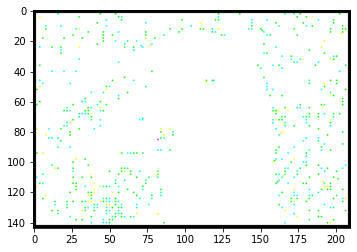

In [241]:
def make_algo():
    n, m = b_1d_image.shape
    ret = np.zeros((n, m, 3))
    for i in range(2, n-2):
        for j in range(2, m-2):
            res = cnt_raws(b_1d_image, [i, j])
            print(np.asarray(res))
            ret[i,j,:] = np.asarray(res)
    return ret
res_image = make_algo()
res_image.astype('int')
imgplot = plt.imshow(res_image)

In [234]:
def test_line_cnt():
    A = np.array([
        [0, 0, 1, 0, 1],
        [0, 0, 2, 1, 0],
        [0, 0, 3, 0, 0],
        [0, 1, 4, 0, 0],
        [1, 0, 5, 0, 0],
    ])
    res, grad = line_cnt(A, 'r')
    print(line_cnt(A, 'r'))
    assert res == 5
    assert grad == (2.0, 2, 0.5)
    
    res, grad = diag_cnt(A, 'r')
    print(diag_cnt(A, 'r'))
    assert res == 6
    assert grad == (2.0, 2, 1)
    A = np.array([
        [0, 0, 1, 0, 1],
        [0, 0, 2, 1, 0],
        [0, 2, 3, 0, 0],
        [0, 1, 4, 0, 0],
        [1, 0, 5, 0, 0],
    ])
    res, grad = line_cnt(A, 'r')
    print(line_cnt(A, 'r'))
    assert res == 6
    assert grad == (2.0, 2, 0.5)
test_line_cnt()

(5.0, (2.0, 2, 0.5))
(6.0, (2.0, 2, 1))
(6.0, (2.0, 2, 0.5))


In [235]:
def test_cnt_raws():
    A = np.array([
        [0, 0, 1, 0, 1],
        [0, 0, 2, 1, 0],
        [0, 0, 3, 0, 0],
        [0, 1, 4, 0, 0],
        [1, 0, 5, 0, 0],
    ])
test_cnt_raws()

[[0 0 1 0 1]
 [0 0 2 1 0]
 [0 0 3 0 0]
 [0 1 4 0 0]
 [1 0 5 0 0]]
{'n': (5.0, (0.5, 2, 2.0)), 'e': (7.0, (0.5, 0, 1.5)), 's': (5.0, (0.5, 4, 4.0)), 'w': (7.0, (0.5, 0, 1.5)), 'ne': (6.0, (2.0, 2, 1)), 'se': (7.0, (1.5, 2, 0)), 'sw': (7.0, (2.0, 4, 1)), 'nw': (8.0, (1.5, 4, 0))} 14.0
